In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER
import copy
from matplotlib import pyplot
from matplotlib import colors
from matplotlib import font_manager
import matplotlib.ticker as mticker
import numpy
import pandas
from PIL import Image
import random
import xarray as xr

In [2]:
numpy.seterr(invalid="ignore")

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## Build Game Board

In [3]:
# Define map bounds
Min_Lon = 98
Max_Lon = 160
Min_Lat = 0
Max_Lat = 44

In [4]:
# Create initial map
def Initial_Map(Axis, Min_Lon, Max_Lon, Min_Lat, Max_Lat):
    pyplot.xlim(Min_Lon, Max_Lon)
    pyplot.ylim(Min_Lat, Max_Lat)
    Axis.set_xticks(numpy.arange(100,170,10))
    Axis.set_yticks(numpy.arange(0,50,10))
    Gridline_Major = Axis.gridlines(crs=ccrs.PlateCarree(), linewidth=1.5, color='darkgrey', linestyle='-')
    Gridline_Major.xlocator = mticker.FixedLocator(numpy.arange(100,170,10))
    Gridline_Major.ylocator = mticker.FixedLocator(numpy.arange(0,50,10))
    Gridline_Minor = Axis.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='darkgrey', linestyle='-')
    Gridline_Minor.xlocator = mticker.FixedLocator(numpy.arange(Min_Lon,Max_Lon,2))
    Gridline_Minor.ylocator = mticker.FixedLocator(numpy.arange(Min_Lat,Max_Lat,2))

In [5]:
# Open map grid file
Map_DF = pandas.read_csv("Map_Pacific.csv", index_col=0)
Map_DF.index = Map_DF.index.astype(int)
Map_DF.columns = Map_DF.columns.astype(int)
Map_Grid = Map_DF.values.astype(int)
Lat_Vals = Map_DF.index.astype(float)
Lon_Vals = Map_DF.columns.astype(float)
Lon_Grid, Lat_Grid = numpy.meshgrid(Lon_Vals, Lat_Vals)

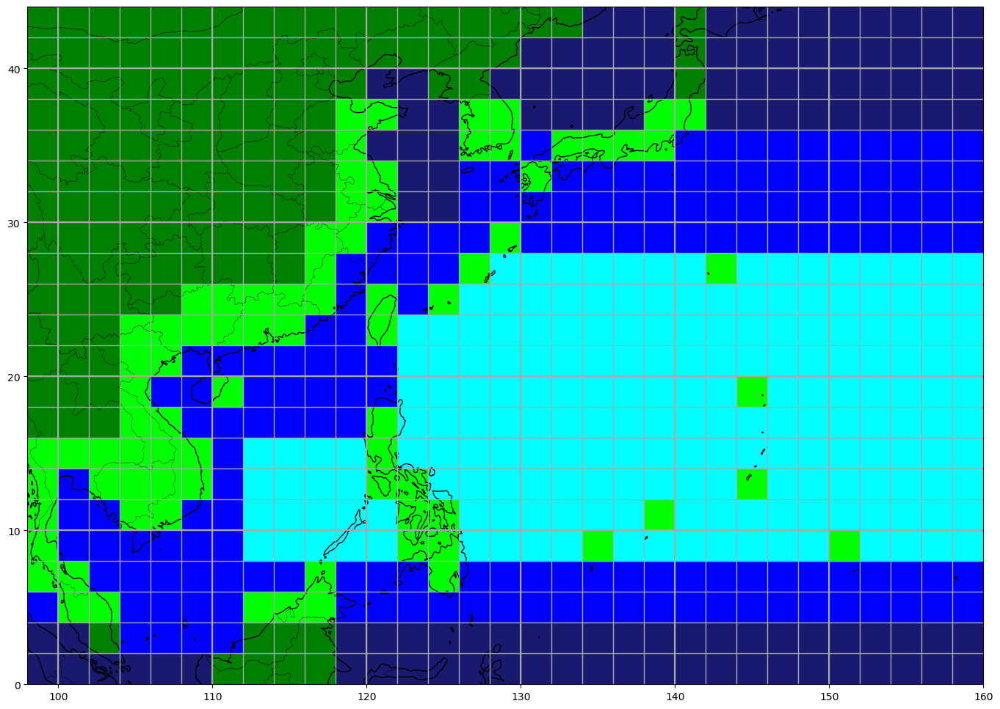

In [6]:
# Plot initial map
Fig = pyplot.figure(figsize=(25,12))
Axis = Fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
Initial_Map(Axis, Min_Lon, Max_Lon, Min_Lat, Max_Lat)
C_Map = colors.ListedColormap(['aqua', 'blue', 'midnightblue', 'lime', 'green'])
Axis.pcolormesh(Lon_Grid, Lat_Grid, Map_Grid, cmap=C_Map, shading='auto', vmin=1, vmax=5)
Axis.coastlines()
Axis.add_feature(cfeature.BORDERS, linewidth=0.3)
Axis.add_feature(cfeature.STATES, linewidth=0.2)

In [7]:
# Open cities file
Cities_DF = pandas.read_csv("Cities_Pacific.csv")

# Open genesis points file
Genesis_DF = pandas.read_csv("Genesis_Pacific.csv")

In [8]:
# City plotting
def City_Plot(Axis, Lon, Lat, Type):
    if Type == "Town":
        Marker, Size, Colour = 'o', 80, 'red'
    elif Type == "Regular":
        Marker, Size, Colour = '^', 160, 'red'
    elif Type == "Metro":
        Marker, Size, Colour = 'p', 320, 'red'
    elif Type == "Mega":
        Marker, Size, Colour = '*', 728, 'red'
    elif Type == "Genesis":
        Marker, Size, Colour = 's', 48, 'gold'
    Axis.scatter(Lon, Lat, marker=Marker, s=Size, c=Colour)

In [9]:
# City labels
def City_Label(Axis, City, Loc, Lon, Lat, Col, Genesis):
    if Genesis == False:
        Size = 14
    else:
        Size = 25
    if Loc == 0:
        Axis.text(Lon, Lat-0.08, City, ha='center', va='center', fontdict={'size':Size}, color=Col)
    elif Loc == 1:
        Axis.text(Lon+0.95, Lat, City, ha='left', va='center', fontdict={'size':Size}, color=Col)
    elif Loc == 2:
        Axis.text(Lon, Lat-1.45, City, ha='center', va='center', fontdict={'size':Size}, color=Col)
    elif Loc == 3:
        Axis.text(Lon-0.95, Lat, City, ha='right', va='center', fontdict={'size':Size}, color=Col)
    elif Loc == 4:
        Axis.text(Lon, Lat+1.38, City, ha='center', va='center', fontdict={'size':Size}, color=Col)

In [10]:
# Legend
def Plot_Legend(Axis):
    Axis.scatter(0,0, marker='s', s=320, c='aqua', label='Zone A (Water)')
    Axis.scatter(0,0, marker='s', s=320, c='blue', label='Zone B (Water)')
    Axis.scatter(0,0, marker='s', s=320, c='midnightblue', label='Zone C (Water)')
    Axis.scatter(0,0, marker='s', s=320, c='lime', label='Zone D (Land)')
    Axis.scatter(0,0, marker='s', s=320, c='green', label='Zone E (Land)')
    Axis.scatter(0,0, marker='*', s=518, c='red', label='Megacity')
    Axis.scatter(0,0, marker='p', s=218, c='red', label='Metropolis')
    Axis.scatter(0,0, marker='^', s=138, c='red', label='Regular City')
    Axis.scatter(0,0, marker='o', s=80, c='red', label='Township')
    Axis.scatter(0,0, marker='s', s=48, c='gold', label='Genesis Points')
    pyplot.legend(loc=2, fontsize=15)

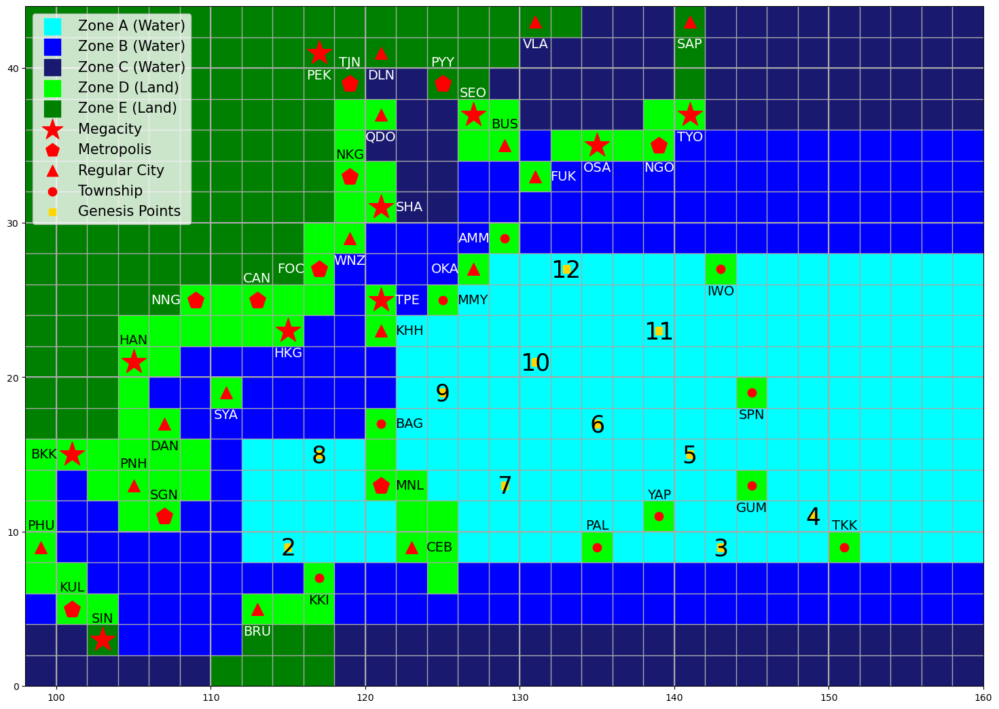

In [11]:
# Plot game board
def Plot_Board(Cities_DF, Genesis_DF, Lon_Grid, Lat_Grid, Map_Grid, C_Map):
    Fig = pyplot.figure(figsize=(25,13))
    Axis = Fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    Initial_Map(Axis, Min_Lon, Max_Lon, Min_Lat, Max_Lat)
    Axis.pcolormesh(Lon_Grid, Lat_Grid, Map_Grid, cmap=C_Map, shading='auto', vmin=1, vmax=5)
    for i in range(len(Cities_DF)):
        City_Plot(Axis, Cities_DF["Lon"][i], Cities_DF["Lat"][i], Cities_DF["Type"][i])
        City_Label(Axis, Cities_DF["City"][i], Cities_DF["Label Loc"][i], Cities_DF["Lon"][i], Cities_DF["Lat"][i], Cities_DF["Label Colour"][i], False)
    for j in range(len(Genesis_DF)):
        City_Plot(Axis, Genesis_DF["Lon"][j], Genesis_DF["Lat"][j], "Genesis")
        City_Label(Axis, Genesis_DF["Point"][j], Genesis_DF["Label Loc"][j], Genesis_DF["Lon"][j], Genesis_DF["Lat"][j], Genesis_DF["Label Colour"][j], True)
    Plot_Legend(Axis)
    #Compass(Axis)
Plot_Board(Cities_DF, Genesis_DF, Lon_Grid, Lat_Grid, Map_Grid, C_Map)
Fig.savefig('Game_Map_Pacific', bbox_inches='tight')

## Initializing Game

In [12]:
# Roll dice
def Dice(n):
    Rolls = [numpy.random.randint(1, 6) for _ in range(n)]
    Result = sum(Rolls)
    return (Result)

In [13]:
# Assign genesis points and create player data dictionary
def Assign_Genesis_Points(Player_Names, Player_Colours, Genesis_DF, Map_DF):
    Taken_Positions = set()
    Player_Data = {}
    for Player in Player_Names:
        while True:
            # Roll dice
            Roll = Dice(2)
            if Roll not in Taken_Positions:
                Taken_Positions.add(Roll)
                print (f"{Player} rolled {Roll} and is assigned genesis point {Roll}.")
                # Find lat lon coordinates of genesis point
                Genesis_Row = Genesis_DF[Genesis_DF["Point"] == Roll]
                Lon = int(Genesis_Row.iloc[0]["Lon"])
                Lat = int(Genesis_Row.iloc[0]["Lat"])
                Zone = Map_DF.loc[Lat, Lon]
                # Initialize player data
                Colour = Player_Colours[Player]
                Player_Data[Player] = {"Colour": Colour, "Order": 0, "Round": 0, "Status": "Initialize", \
                                       "Genesis Point": Roll, "Lon": Lon, "Lat": Lat, "Zone": Zone, \
                                       "Hand": [], "Cards Played This Round": [], "Max Cards": 3, "Remainder": 0, \
                                       "Intensity": 25, "Peak Intensity": 25, "ACE": 0, "Landfall Costs": 0, "Landfall Cities": []}
                break
            # If roll result is already taken, roll again
            else:
                print (f"{Player} rolled {Roll}, but genesis point {Roll} is already taken. Rolling again...")
    # Decide play order based on roll result
    Play_Order = sorted(Player_Names, key=lambda Name: Player_Data[Name]["Genesis Point"], reverse=True)
    Player_Data_Sorted = {Name: Player_Data[Name] for Name in Play_Order}
    for Order, Name in enumerate(Play_Order, start=1):
        Player_Data[Name]["Order"] = Order
    return (Play_Order, Player_Data_Sorted)

In [14]:
# Place pawn on board
def Place_Pawn(Lon, Lat, Colour):
    pyplot.scatter(Lon, Lat, s=383, c=Colour, edgecolors='black', linewidths=3, zorder=5)
    # Add Halo Around Pawn
    pyplot.scatter(Lon, Lat, s=728, c='white', edgecolors='black', linewidths=2, zorder=4)

In [15]:
# Plot current board
def Plot_Current_Board(Player_Data):
    Plot_Board(Cities_DF, Genesis_DF, Lon_Grid, Lat_Grid, Map_Grid, C_Map)
    for Player in Player_Data:
        Place_Pawn(Player_Data[Player]["Lon"], Player_Data[Player]["Lat"], Player_Data[Player]["Colour"])
    pyplot.show()

In [16]:
# Shuffle cards
def Shuffle_Cards(Cards):
    # Build full deck
    Deck = []
    for _, Row in Cards.iterrows():
        Deck.extend([Row["Card"]] * int(Row["Count"]))
    # Shuffle deck
    random.shuffle(Deck)
    return (Deck)

In [17]:
# Deal cards
def Deal_Cards(Deck, Player_Data, Cards_Per_Player):
    for i in range(Cards_Per_Player):
        for Player in Player_Data:
            Player_Data[Player]["Hand"].append(Deck.pop())
    return (Deck)

## Setup Game State

In [128]:
# Setup game state
def Setup_Game_State(n_Players, Movement_Deck, Intensity_Deck, Action_Deck, Cities_DF):
    # Create game state dictionary
    Game_State = {"Round": 0, "Player Position": 0, "Status": "Initialize", \
    "Movement Deck": Movement_Deck, "Intensity Deck": Intensity_Deck, "Action Deck": Action_Deck, \
    "Movement Discard": [], "Intensity Discard": [], "Action Discard": [], \
    "Ocean ACE": 500 * n_Players, "Cities Budget": {}, "Effects": [], "Game End": False}

    # Define cities budget
    for i in range(len(Cities_DF)):
        Game_State["Cities Budget"][Cities_DF.iloc[i]["City"]] = Cities_DF.iloc[i]["Initial Budget"]

In [18]:
# Save player data and game state history
def Save_State(Player_Data, Game_State, Player_Data_History, Game_State_History):
    Player_Data_History.append(copy.deepcopy(Player_Data))
    Game_State_History.append(copy.deepcopy(Game_State))

In [19]:
# Reset board
def Reset(Player_Data_History, Game_State_History):
    Player_Data = copy.deepcopy(Player_Data_History[0])
    Game_State = copy.deepcopy(Game_State_History[0])
    return (Player_Data, Game_State)

In [20]:
# Undo round
def Undo(Player_Data_History, Game_State_History):
    if len(Player_Data_History) > 1:
        Player_Data = copy.deepcopy(Player_Data_History[-1])
        Game_State = copy.deepcopy(Game_State_History[-1])
    else:
        Player_Data = copy.deepcopy(Player_Data_History[0])
        Game_State = copy.deepcopy(Game_State_History[0])
    return (Player_Data, Game_State)

## Running Each Round

In [35]:
# Function for each round of a player
def Run_Round(Round, Player_Pos, Player_Data, Game_State, Player_Data_History, Game_State_History):
# Initialize
    Game_State["Round"] = Round
    Game_State["Player Position"] = Player_Pos
    Game_State["Status"] = "Begin Round"
    Player_Name = Play_Order[Player_Pos-1]
    Player_Data[Player_Name]["Round"] = Round
    Player_Data[Player_Name]["Status"] = "Begin Round"

    # Print initial info
    print (f"\n--- Round {Round}: {Player_Name}'s turn ---")
    Plot_Current_Board(Player_Data)
    print (f"Intensity: {Player_Data[Player_Name]["Intensity"]} knots")
    print (f"ACE: {Player_Data[Player_Name]["ACE"]} kJ")
    print (f"Landfall Costs: ${Player_Data[Player_Name]["Landfall Costs"]} M")
    print ("Hand:")
    for i, Card in enumerate(Player_Data[Player_Name]["Hand"]):
        print (f"{Card}")

    # Draw cards
    if Round > 1:
        Draw_Cards(Player_Name, Player_Data, Game_State)
        Game_State["Status"] = "Drew Cards"
        Player_Data[Player_Name]["Status"] = "Drew Cards"

    # Play cards
    Play_Cards(Player_Name, Player_Data, Game_State)
    Game_State["Status"] = "Played Cards"
    Player_Data[Player_Name]["Status"] = "Played Cards"

    # End round
    End_Round(Player_Name, Player_Data, Game_State)
    Game_State["Status"] = "End Round"
    Player_Data[Player_Name]["Status"] = "End Round"
    Save_State(Player_Data, Game_State, Player_Data_History, Game_State_History)

    # Plot current board
    Plot_Current_Board(Player_Data)

## Drawing Cards

In [126]:
# Function for players to draw cards
def Draw_Cards(Player_Name, Player_Data, Game_State):
    # Initialize
    Hand = Player_Data[Player_Name]["Hand"]
    Round = Game_State["Round"]
    print (f"\n--- Round {Round}: {Player_Name}'s draw phase ---")

    # If player starts the draw phase with no cards, give a new 10 card hand
    if len(Hand) == 0:
        print(f"{Player_Name} has no cards left and draws a new 10 card hand.")
        New_Hand = [("Movement Deck", 4), ("Intensity Deck", 4), ("Action Deck", 2)]
        for Deck, Num_Cards in New_Hand:
            for i in range(Num_Cards):
                Drawn_Card = Draw_From_Deck(Deck, Game_State)
                Hand.append(Drawn_Card)
                print(f"{Player_Name} drew: {Drawn_Card} from {Deck}.")
        return

    # Normal draw phase
    Cards_Drawn = 0
    Action_Chosen = False
    while Cards_Drawn < 2:
        if Action_Chosen == False:
            Decks = ["Movement Deck", "Intensity Deck", "Action Deck"]
        else:
            Decks = ["Movement Deck", "Intensity Deck"]
        for i, Deck in enumerate(Decks):
            print(f"{i}: {Deck} ({len(Game_State[Deck])} cards left)")
            
        # Ask for input
        Index = Request_Index_Input("Choose a deck by index:", len(Decks)-1)

        # Draw card
        Chosen_Deck = Decks[Index]
        Drawn_Card = Draw_From_Deck(Chosen_Deck, Game_State)
        Hand.append(Drawn_Card)
        print (f"{Player_Name} drew: {Drawn_Card} from {Chosen_Deck}.")
        print ("")
        if Chosen_Deck == "Action Deck":
            Action_Chosen = True
        Cards_Drawn += 1

In [127]:
# Function for drawing card from deck
def Draw_From_Deck(Deck, Game_State):
    Discard = Deck.replace("Deck", "Discard")

    # If deck is empty, reshuffle discard pile
    if len(Game_State[Deck]) == 0:
        Game_State[Deck] = Game_State[Discard]
        Game_State[Discard] = []
        random.shuffle(Game_State[Deck])
        print(f"{Deck} is empty. The discard pile has been reshuffled.")

    # Draw top card
    Drawn_Card = Game_State[Deck].pop(0)
    return (Drawn_Card)

In [37]:
# Function for requesting index input
def Request_Index_Input(Input_Message, Max_Index):
    while True:
        Choice = input(Input_Message)
        try:
            Index = int(Choice)
        except ValueError:
            print ("Invalid input. Please enter a number.")
            continue
        if Index < 0 or Index > Max_Index:
            print ("Invalid index. Please try again.")
            continue
        return (Index)

## Playing Cards

In [109]:
# Function for players to play cards
def Play_Cards(Player_Name, Player_Data, Game_State):
    # Initialize
    Hand = Player_Data[Player_Name]["Hand"]
    Round = Game_State["Round"]
    Played_This_Round = []
    Player_Data[Player_Name]["Cards Played This Round"] = Played_This_Round
    Player_Data[Player_Name]["Max Cards"] = 3

    # Print current info
    while len(Played_This_Round) < Player_Data[Player_Name]["Max Cards"]:
        print (f"\n--- Round {Round}: {Player_Name}'s playing phase ---")
        print (f"Cards played this round: {len(Played_This_Round)} / {Player_Data[Player_Name]["Max Cards"]}")

        # If no cards left
        if len(Hand) == 0:
            print ("No cards left in hand.")
            break

        # Get playable indices
        Playable_Indices = [i for i, Card in enumerate(Hand) if Is_Card_Playable(Card, Player_Name, Player_Data, Game_State)]
        if len(Playable_Indices) == 0:
            print("No playable cards available.")
            break

        # Print hand
        print ("Hand:")
        for i, Card in enumerate(Hand):
            if i in Playable_Indices:
                print (f"{i}: {Card}")
            else:
                print (f"{i}: {Card} (cannot play)")

        # Passing is only allowed after at least 1 card played
        if len(Played_This_Round) >= 1:
            print ("Enter 'p' to pass.")

        # Ask for input
        Choice = input(f"Choose a card by index to play: ")
        if Choice.lower() == "p":
            if len(Played_This_Round) >= 1:
                print (f"{Player_Name} passes.")
                break
            else:
                print ("You must play at least 1 card before passing.")
                continue
        try:
            Index = int(Choice)
        except ValueError:
            print ("Invalid input. Please enter a number or 'p'.")
            continue
        if Index < 0 or Index >= len(Hand):
            print ("Invalid index. Please try again.")
            continue
        Card = Hand[Index]
        if not Is_Card_Playable(Card, Player_Name, Player_Data, Game_State):
            print (f"{Card} cannot currently be played. Please try again.")
            continue

        # Play card
        Played_Card = Hand.pop(Index)
        Played_This_Round.append(Played_Card)
        print (f"{Player_Name} played: {Played_Card}")
        print ("")
        Find_Card_Type(Played_Card, Player_Name, Player_Data, Game_State, True)

In [39]:
# Function to find card type
def Find_Card_Type(Card_Name, Player_Name, Player_Data, Game_State, Play_Card):
    Card_Type, Card_Info = Card_Lookup[Card_Name]
    # Play movement card
    if Card_Type == "Movement":
        if Play_Card == True:
            Play_Movement_Cards(Card_Name, Card_Info, Player_Name, Player_Data)
        Game_State["Movement Discard"].append(Card_Name)
    # Play intensity card
    elif Card_Type == "Intensity":
        if Play_Card == True:
            Play_Intensity_Cards(Card_Name, Card_Info, Player_Name, Player_Data)
        Game_State["Intensity Discard"].append(Card_Name)
    # Play action card
    elif Card_Type == "Action":
        if Play_Card == True:
            Play_Action_Cards(Card_Name, Card_Info, Player_Name, Player_Data, Game_State)
        Game_State["Action Discard"].append(Card_Name)

### Playing Movement Cards

In [40]:
# Function for playing movement cards
def Play_Movement_Cards(Card_Name, Card_Info, Player_Name, Player_Data):
    # Find movement velocity
    if Card_Info.iloc[0]["Roll"] == False and Card_Info.iloc[0]["Option"] == False:
        Lon_Change = (Card_Info.iloc[0]["E"] - Card_Info.iloc[0]["W"]) * 2
        Lat_Change = (Card_Info.iloc[0]["N"] - Card_Info.iloc[0]["S"]) * 2
    # Roll dice to find movement velocity
    elif Card_Info.iloc[0]["Roll"] == True:
        Roll = Dice(1)
        Lon_Change = (Card_Info.iloc[0]["E"] - Card_Info.iloc[0]["W"]) * 2 * Roll
        Lat_Change = (Card_Info.iloc[0]["N"] - Card_Info.iloc[0]["S"]) * 2 * Roll
        print (f"{Player_Name} rolled {Roll}: {Card_Name[0]} {Roll}")
    # Movement wildcards: ask player to choose movement direction
    elif Card_Info.iloc[0]["Option"] == True:
        if Card_Name == "W/E 1":
            Lon_Change, Lat_Change = Request_Wildcard_Input("Choose W or E: ", ["W", "E"])
        elif Card_Name == "N/S 1":
            Lon_Change, Lat_Change = Request_Wildcard_Input("Choose N or S: ", ["N", "S"])
        elif Card_Name == "W/E/N/S 1":
            Lon_Change, Lat_Change = Request_Wildcard_Input("Choose W, E, N or S: ", ["W", "E", "N", "S"])

    # Move storm
    Player_Data[Player_Name]["Lon"] += Lon_Change
    Player_Data[Player_Name]["Lat"] += Lat_Change
    Player_Data[Player_Name]["Zone"] = Map_DF.loc[Player_Data[Player_Name]["Lat"], Player_Data[Player_Name]["Lon"]]

    # Plot current board
    Plot_Current_Board(Player_Data)

    # Detect landfall
    Landfall_Row = Cities_DF[(Cities_DF["Lon"] == Player_Data[Player_Name]["Lon"]) & (Cities_DF["Lat"] == Player_Data[Player_Name]["Lat"])]
    if len(Landfall_Row) > 0:
        Landfall(Player_Name, Player_Data, Game_State, Landfall_Row)

In [41]:
# Movement wildcards choice
def Movement_Choice(Choice):
    if Choice == "W":
        Lon_Change, Lat_Change = -2, 0
    elif Choice == "E":
        Lon_Change, Lat_Change = 2, 0
    elif Choice == "N":
        Lon_Change, Lat_Change = 0, 2
    elif Choice == "S":
        Lon_Change, Lat_Change = 0, -2
    return (Lon_Change, Lat_Change)

In [42]:
# Function for requesting movement wildcard input
def Request_Wildcard_Input(Input_Message, Options):
    while True:
        Choice = input(Input_Message)
        if Choice in Options:
            Lon_Change, Lat_Change = Movement_Choice(Choice)
            return (Lon_Change, Lat_Change)
        else:
            print ("Invalid choice. Please try again.")

In [43]:
# Function for landfall
def Landfall(Player_Name, Player_Data, Game_State, Landfall_Row):
    Landfall_City = Landfall_Row.iloc[0]["City"]
    # Calculate landfall cost
    Landfall_Cost = Player_Data[Player_Name]["Intensity"] * Landfall_Row.iloc[0]["Landfall Cost per kt"]
    # If player has never made landfall at this city yet
    if Landfall_City not in Player_Data[Player_Name]["Landfall Cities"]:
        # If remaining city budget less than landfall cost
        if Game_State["Cities Budget"][Landfall_City] < Landfall_Cost:
            Landfall_Cost = Game_State["Cities Budget"][Landfall_City]
        # Deduct landfall cost from city budget
        Game_State["Cities Budget"][Landfall_City] -= Landfall_Cost
        # Add landfall cost to player
        Player_Data[Player_Name]["Landfall Costs"] += Landfall_Cost
        Player_Data[Player_Name]["Landfall Cities"].append(Landfall_City)
        # Print message
        City_Name = Landfall_Row.iloc[0]["City Name"]
        if Landfall_Cost > 0:
            print (f"{Player_Name} has made landfall at {Landfall_City} ({City_Name}) and gains ${Landfall_Cost}M!")
            print (f"Remaining budget of {Landfall_City} ({City_Name}): ${Game_State["Cities Budget"][Landfall_City]}M")
        else:
            print (f"{Player_Name} has made landfall at {Landfall_City} ({City_Name}), but {Landfall_City} is already bankrupt. $0M gained.")

    # If player has already made landfall at this city
    else:
        City_Name = Landfall_Row.iloc[0]["City Name"]
        print (f"{Player_Name} has already made landfall at {Landfall_City} ({City_Name}) previously. $0M gained.")

### Playing Intensity Cards

In [44]:
# Function for playing intensity cards
def Play_Intensity_Cards(Card_Name, Card_Info, Player_Name, Player_Data):
    # Find W/m^2 amount
    if Card_Info.iloc[0]["Roll"] == False:
        Wm2 = Card_Info.iloc[0]["W/m^2"]
    # Roll dice to find W/m^2 amount
    else:
        Roll = Dice(1)
        Wm2 = Roll * 5
        print (f"{Player_Name} rolled {Roll}: + {Wm2} W/m^2")

    # Get current intensity and zone
    Current_Intensity = Player_Data[Player_Name]["Intensity"]
    Rem = Player_Data[Player_Name]["Remainder"]
    Zone = Player_Data[Player_Name]["Zone"]

    # Intensification
    Intensity, Remainder = Intensify(Current_Intensity, Wm2, Rem, Zone)

    # Print message
    if Intensity > Current_Intensity:
        print (f"{Player_Name} has intensified to {Intensity} knots!")
    else:
        print (f"{Player_Name} remains at {Intensity} knots.")

    # Store data
    Player_Data[Player_Name]["Intensity"] = Intensity
    if Intensity > Player_Data[Player_Name]["Peak Intensity"]:
        Player_Data[Player_Name]["Peak Intensity"] = Intensity
    Player_Data[Player_Name]["Remainder"] = Remainder

In [45]:
# Calculate intensification amount
def Intensify(Intensity, Wm2_New, Rem, Zone):
    Wm2 = Wm2_New + Rem
    while True:
        if Intensity < 65:
            if Zone <= 2:
                Cost = 5
            elif Zone == 3:
                Cost = 10
        elif Intensity < 100:
            Cost = 5 * Zone
        elif Intensity < 140:
            Cost = 5 * Zone + 5
        else:
            if Zone <= 2:
                Cost = 5 * Zone + 10
            elif Zone == 3:
                Cost = 30
        if Wm2 < Cost:
            break
        Intensity += 5
        Wm2 -= Cost
    return (Intensity, Wm2)

### Playing Action Cards

In [142]:
# Function for playing action cards
def Play_Action_Cards(Card_Name, Card_Info, Player_Name, Player_Data, Game_State):
    if len (Player_Data[Player_Name]["Cards Played This Round"]) > 1:
        Prev_Card = Player_Data[Player_Name]["Cards Played This Round"][-2]
    Opponents = [Name for Name in Player_Data if Name != Player_Name]

    # Rapid Intensification: Doubles the effect of an intensity card
    if Card_Name == "Rapid Intensification":
        Play_Intensity_Cards(Prev_Card, Card_Lookup[Prev_Card][1], Player_Name, Player_Data)

    # Cyclone Express: Doubles the effect of a movement card
    elif Card_Name == "Cyclone Express":
        Play_Movement_Cards(Prev_Card, Card_Lookup[Prev_Card][1], Player_Name, Player_Data)

    # Wrong Way Round: Move in the opposite direction of a movement card
    elif Card_Name == "Wrong Way Round":
        Card_Type, Card_Info = Card_Lookup[Prev_Card]
        Lon_Change = (Card_Info.iloc[0]["E"] - Card_Info.iloc[0]["W"]) * 2 * -2
        Lat_Change = (Card_Info.iloc[0]["N"] - Card_Info.iloc[0]["S"]) * 2 * -2
        Player_Data[Player_Name]["Lon"] += Lon_Change
        Player_Data[Player_Name]["Lat"] += Lat_Change
        Player_Data[Player_Name]["Zone"] = Map_DF.loc[Player_Data[Player_Name]["Lat"], Player_Data[Player_Name]["Lon"]]
        Plot_Current_Board(Player_Data)
        Landfall_Row = Cities_DF[(Cities_DF["Lon"] == Player_Data[Player_Name]["Lon"]) & (Cities_DF["Lat"] == Player_Data[Player_Name]["Lat"])]
        if len(Landfall_Row) > 0:
            Landfall(Player_Name, Player_Data, Game_State, Landfall_Row)

    # Survival of the Fittest: Become immune from any weakening for the next 3 rounds
    elif Card_Name == "Survival of the Fittest":
        Game_State["Effects"].append({"Effect": Card_Name, "Type": "Positive", "Player": Player_Name, "Rounds Left": 3})
        print (f"{Player_Name} is immune from any weakening for the next 3 rounds.")

    # Eyewall Replacement: Stop one opponent of your choice from intensifying for 3 rounds
    elif Card_Name == "Eyewall Replacement":
        for i, Opponent in enumerate(Opponents):
            print(f"{i}: {Opponent}")
        Index = Request_Index_Input("Select an opponent:", len(Opponents)-1)
        Opponent = Opponents[Index]
        Game_State["Effects"].append({"Effect": Card_Name, "Type": "Negative", "Player": Opponent, "Rounds Left": 3})
        print (f"{Opponent} will not be able to intensify for the next 3 rounds.")

    # Vertical Wind Shear: Weaken every opponent by 10 knots
    elif Card_Name == "Vertical Wind Shear":
        for Opponent in Opponents:
            if Has_Effect(Opponent, "Survival of the Fittest", Game_State) == False:
                Player_Data[Opponent]["Intensity"] -= 10
                if Player_Data[Opponent]["Intensity"] < 25:
                    Player_Data[Opponent]["Intensity"] = 25
                print (f"{Opponent} has weakened to {Player_Data[Opponent]["Intensity"]} knots.")

    # City Fortress: Protect one city of your choice from being impacted by any opponent for 3 rounds
    elif Card_Name == "City Fortress":
        while True:
            Choice = input(f"Select a city by inputting its three letter code:")
            if Choice in list(Cities_DF["City"]):
                Chosen_City = Choice
                break
            else:
                print ("Invalid input. Please input the three letter code of a city on the map.")
                continue
        for Opponent in Opponents:
            Game_State["Effects"].append({"Effect": Card_Name, "Type": "Negative", "Player": Opponent, "City": Chosen_City, "Rounds Left": 3})
        print (f"{Choice} is protected from being impacted by any opponent for the next 3 rounds.")

    # Expand Circulation: Impact one city of your choice at an adjacent grid box
    elif Card_Name == "Expand Circulation":
        # Find adjacent cities
        Adj_Cities = Find_Adj_Cities(Player_Data[Player_Name]["Lon"], Player_Data[Player_Name]["Lat"])
        # If more than one adjacent city, ask for input
        if len(Adj_Cities) > 1:
            Index = Request_Index_Input("Select a city by index:", len(Adj_Cities)-1)
            Chosen_City = Adj_Cities[Index]
        else:
            Chosen_City = Adj_Cities[0]
        Landfall_Row = Cities_DF[Cities_DF["City"] == Chosen_City]
        Landfall(Player_Name, Player_Data, Game_State, Landfall_Row)

    # Random Teleportation: Roll the dice and teleport to that genesis point
    elif Card_Name == "Random Teleportation":
        Roll = Dice(2)
        Genesis_Row = Genesis_DF[Genesis_DF["Point"] == Roll]
        Player_Data[Player_Name]["Lon"] = int(Genesis_Row.iloc[0]["Lon"])
        Player_Data[Player_Name]["Lat"] = int(Genesis_Row.iloc[0]["Lat"])
        Player_Data[Player_Name]["Zone"] = Map_DF.loc[Player_Data[Player_Name]["Lat"], Player_Data[Player_Name]["Lon"]]
        print (f"{Player_Name} rolled {Roll} and is teleported to genesis point {Roll}.")
        Plot_Current_Board(Player_Data)

    # Factory Reset: Discard all your current cards and take 10 new cards from the deck
    elif Card_Name == "Factory Reset":
        # Discard old hand
        Old_Hand = Player_Data[Player_Name]["Hand"]
        for Card_Name in Old_Hand:
            Find_Card_Type(Card_Name, Player_Name, Player_Data, Game_State, Play_Card)
        # Get new hand
        New_Hand = [("Movement Deck", 4), ("Intensity Deck", 4), ("Action Deck", 2)]
        for Deck, Num_Cards in New_Hand:
            for i in range(Num_Cards):
                Drawn_Card = Draw_From_Deck(Deck, Game_State)
                Hand.append(Drawn_Card)
                print(f"{Player_Name} drew: {Drawn_Card} from {Deck}.")
        print (f"{Player_Name} has discarded all current cards and received a new hand.")

    # Extra Time: Be able to use 6 cards within this round
    elif Card_Name == "Extra Time":
        Player_Data[Player_Name]["Max Cards"] = 6
        print (f"{Player_Name} is able to use 6 cards within this round.")

    # Breaking Free: Remove all negative effects affecting yourself
    elif Card_Name == "Breaking Free":
        Game_State["Effects"] = [Effect for Effect in Game_State["Effects"] \
                                 if not (Effect["Target"] == Player_Name and Effect["Type"] == "Negative")]
        print (f"All negative effects removed from {Player_Name}.")

In [47]:
# Find if a player has a effect
def Has_Effect(Player_Name, Effect_Name, Game_State):
    for Effect in Game_State["Effects"]:
        if Effect["Effect"] == Effect_Name and Effect["Player"] == Player_Name:
            return (True)
    return (False)

In [48]:
# Find adjacent cities
def Find_Adj_Cities(Player_Lon, Player_Lat):
    Adj_Lons = [Player_Lon + 2, Player_Lon, Player_Lon - 2, Player_Lon]
    Adj_Lats = [Player_Lat, Player_Lat - 2, Player_Lat, Player_Lat + 2]
    Adj_Cities = []
    for i in range(4):
        Adj_DF = Cities_DF[(Cities_DF["Lon"] == Adj_Lons[i]) & (Cities_DF["Lat"] == Adj_Lats[i])]
        if len(Adj_DF) > 0:
            Adj_Cities.append(Adj_DF.iloc[0]["City"])
    return (Adj_Cities)

In [49]:
# Function for deciding if a card is playable
def Is_Card_Playable(Card_Name, Player_Name, Player_Data, Game_State):
    # Find previous card
    if len(Player_Data[Player_Name]["Cards Played This Round"]) > 0:
        Prev_Card = Player_Data[Player_Name]["Cards Played This Round"][-1]
    else:
        Prev_Card = None

    if Card_Lookup[Card_Name][0] == "Intensity":
        # Intensity cards cannot be used on land
        if Player_Data[Player_Name]["Zone"] >= 4:
            return (False)

        # Intensity cards cannot be used when vertical wind shear in effect
        if Has_Effect(Player_Name, "Vertical Wind Shear", Game_State) == True:
            return (False)

    elif Card_Lookup[Card_Name][0] == "Action":
        # Rapid intensification can only be used when previous card is an intensity card
        if Card_Name == "Rapid Intensification":
            if Prev_Card == None or Card_Lookup[Prev_Card][0] != "Intensity":
                return (False)

        # Cyclone express can only be used when previous card is a movement card
        elif Card_Name == "Cyclone Express":
            if Prev_Card == None or Card_Lookup[Prev_Card][0] != "Movement":
                return (False)

        # Wrong way round can only be used when previous card is a regular movement card
        elif Card_Name == "Wrong Way Round":
            if Prev_Card == None or Card_Lookup[Prev_Card][0] != "Movement":
                return (False)
            elif Card_Lookup[Prev_Card][1].iloc[0]["Option"] == True or Card_Lookup[Prev_Card][1].iloc[0]["Roll"] == True:
                return (False)

        # Expand circulation can only be used when there is at least one adjacent city
        elif Card_Name == "Expand Circulation":
            if len(Find_Adj_Cities(Player_Data[Player_Name]["Lon"], Player_Data[Player_Name]["Lat"])) == 0:
                return (False)

        # Breaking free can only be used when there is at least one negative effect
        elif Card_Name == "Breaking Free":
            if any(Effect["Target"] == Player_Name and Effect["Type"] == "Negative" for Effect in Game_State["Effects"]) == False:
                return (False)

    # Else return true
    return (True)

## Ending Round

In [136]:
# End round
def End_Round(Player_Name, Player_Data, Game_State):
    # Reset round data
    Player_Data[Player_Name]["Cards Played This Round"] = []
    Player_Data[Player_Name]["Remainder"] = 0
    Player_Data[Player_Name]["Max Cards"] = 3

    # Calculate ACE
    Intensity = Player_Data[Player_Name]["Intensity"]
    ACE = Calc_ACE(Intensity)
    Player_Data[Player_Name]["ACE"] += ACE
    Game_State["Ocean ACE"] -= ACE
    Game_State["Ocean ACE"] = max(0, Game_State["Ocean ACE"])
    print ("")
    print (f"--- End of {Player_Name}'s turn ---")
    print (f"{Player_Name}'s current intensity: {Intensity} knots. {Player_Name} has gained {ACE} kJ.")
    print (f"{Player_Name}'s current ACE: {Player_Data[Player_Name]["ACE"]} kJ.")
    print (f"{Player_Name}'s total landfall costs: ${Player_Data[Player_Name]["Landfall Costs"]}M.")
    print (f"The ocean has {Game_State["Ocean ACE"]} kJ of energy remaining.")

    # End game if ocean OCE is depleted
    if Game_State["Ocean ACE"] == 0:
        Game_State["End Game"] = True
        print("\nOcean ACE has been depleted!")
        print("All remaining players will complete their turns this round.")

    # Weaken storm if in zones of unfavourable environment (Zones C, D, E)
    Zone = Map_DF.loc[Player_Data[Player_Name]["Lat"], Player_Data[Player_Name]["Lon"]]
    if Zone >= 3:
        if Has_Effect(Player_Name, "Survival of the Fittest", Game_State) == False:
            if Zone == 3 or Zone == 4:
                Player_Data[Player_Name]["Intensity"] -= 5
            elif Zone == 5:
                Player_Data[Player_Name]["Intensity"] -= 10
            Player_Data[Player_Name]["Intensity"] = max(25, Player_Data[Player_Name]["Intensity"])
            print (f"{Player_Name} has weakened to {Player_Data[Player_Name]["Intensity"]} knots.")

    # Update effects
    for Effect in Game_State["Effects"]:
        if Effect["Player"] == Player_Name:
            Effect["Rounds Left"] -= 1
    # Remove expired effects
    Game_State["Effects"] = [Effect for Effect in Game_State["Effects"] if Effect["Rounds Left"] > 0]

In [51]:
# Function to calculate ACE
def Calc_ACE(Intensity):
    Intensity_Bins = numpy.array([35, 65, 85, 100, 120, 140])
    ACE_Bins = numpy.array([0, 10, 20, 30, 50, 70, 100])
    Bin = numpy.digitize(Intensity, bins=Intensity_Bins, right=False)
    ACE = ACE_Bins[Bin]
    return (ACE)

## Ending Game

In [131]:
# End game
def End_Game(Game_State):
    if Game_State["End Game"] == True:
        print("\n========== GAME OVER ==========")

In [150]:
Player_Data

{'Demi': {'Colour': 'magenta',
  'Order': 1,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 8,
  'Lon': np.int64(113),
  'Lat': np.int64(23),
  'Zone': np.int64(4),
  'Hand': ['+5 W/m^2'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 60,
  'Peak Intensity': 65,
  'ACE': np.int64(140),
  'Landfall Costs': np.int64(975),
  'Landfall Cities': ['SYA', 'HKG', 'WNZ', 'FOC', 'CAN']},
 'Kinen': {'Colour': 'limegreen',
  'Order': 2,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 7,
  'Lon': np.int64(125),
  'Lat': np.int64(25),
  'Zone': np.int64(4),
  'Hand': ['Factory Reset', 'Breaking Free'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 110,
  'Peak Intensity': 115,
  'ACE': np.int64(300),
  'Landfall Costs': np.int64(1395),
  'Landfall Cities': ['MNL', 'KHH', 'TPE', 'OKA', 'AMM', 'MMY']},
 'Jin': {'Colour': 'darkorange',
  'Order': 3,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 

In [151]:
# Calculate final points tally
def Points_Tally(Player_Data, Game_State):
    # Peak intensity ranking
    Intensity_Results = Bonus_Ranking(Player_Data, Primary_Key=lambda Player: Player["Peak Intensity"], 
                                                Secondary_Key=lambda Player: Player["ACE"])

    # Landfall cities count ranking
    Landfall_Results = Bonus_Ranking(Player_Data, Primary_Key=lambda Player: len(Player["Landfall Cities"]), 
                                               Secondary_Key=lambda Player: Player["Landfall Costs"])

    # Final results
    Final_Results = {}
    for Player_Name in Player_Data:
        # Final Score = ACE + Landfall Costs + Peak Intensity Bonus + Landfall Cities Bonus
        ACE = int(Player_Data[Player_Name]["ACE"])
        Landfall_Costs = int(Player_Data[Player_Name]["Landfall Costs"])
        Intensity_Bonus = Intensity_Results[Player_Name]["Bonus"]
        Landfall_Bonus = Landfall_Results[Player_Name]["Bonus"]
        Final_Score = ACE + Landfall_Costs + Intensity_Bonus + Landfall_Bonus
        Final_Results[Player_Name] = {"ACE": ACE, "Landfall Costs": Landfall_Costs, 
            "Peak Intensity": Player_Data[Player_Name]["Peak Intensity"], 
            "Peak Intensity Rank": Intensity_Results[Player_Name]["Rank"], "Peak Intensity Bonus": Intensity_Bonus,
            "Landfall Cities Count": len(Player_Data[Player_Name]["Landfall Cities"]),
            "Landfall Cities Rank": Landfall_Results[Player_Name]["Rank"], "Landfall Cities Bonus": Landfall_Bonus,
            "Final Score": Final_Score}
    return (Final_Results)

In [152]:
# Calculate bonus ranking
def Bonus_Ranking(Player_Data, Primary_Key, Secondary_Key):
    Bonus_Points = {1: 200, 2: 100, 3: 50}

    # Create ranking data
    Ranking = []
    for Player_Name in Player_Data:
        Primary_Value = Primary_Key(Player_Data[Player_Name])
        Secondary_Value = Secondary_Key(Player_Data[Player_Name])
        Ranking.append({"Player": Player_Name, "Primary": Primary_Value, "Secondary": Secondary_Value})

    # Sort by primary criterion, then secondary criterion
    Ranking = sorted(Ranking, key=lambda x: (x["Primary"], x["Secondary"]), reverse=True)

    # Assign ranks and bonus points
    Results = {}
    Previous_Values = None
    Previous_Rank = None
    for i, Entry in enumerate(Ranking):
        Current_Values = (Entry["Primary"], Entry["Secondary"])
        # Same rank if same primary and secondary
        if Current_Values == Previous_Values:
            Rank = Previous_Rank
        else:
            Rank = i + 1
        Bonus = Bonus_Points.get(Rank, 0)
        Results[Entry["Player"]] = {"Rank": Rank, "Bonus": Bonus}
        Previous_Values = Current_Values
        Previous_Rank = Rank
    return (Results)

In [156]:
# Print final points tally
def Print_Points_Tally(Final_Results):
    # Sort by final score
    Sorted_Players = sorted(Final_Results, key=lambda Player: Final_Results[Player]["Final Score"], reverse=True)

    # Print final points tally
    print("\n========== FINAL RESULTS ==========")
    for i, Player_Name in enumerate(Sorted_Players, start=1):
        Result = Final_Results[Player_Name]
        print(f"\n{i}. {Player_Name}")
        print(f"ACE: {Result['ACE']}")
        print(f"Landfall Costs: {Result['Landfall Costs']}")
        print(f"Peak Intensity: {Result['Peak Intensity']} kt (Rank {Result['Peak Intensity Rank']}, + {Result['Peak Intensity Bonus']} points)")
        print(f"Landfall Cities Count: {Result['Landfall Cities Count']} (Rank {Result['Landfall Cities Rank']}, +{Result['Landfall Cities Bonus']} points)")
        print(f"Final Score: {Result['Final Score']}")

## Game Setup

In [21]:
# Open cards files
Movement_Cards = pandas.read_csv("Cards_Movement_Pacific.csv")
Intensity_Cards = pandas.read_csv("Cards_Intensity_Pacific.csv")
Action_Cards = pandas.read_csv("Cards_Action_Pacific.csv")

In [22]:
# Create card lookup dictionary
Card_Lookup = {}
for Card in Movement_Cards["Card"]:
    Card_Lookup[Card] = ("Movement", Movement_Cards[Movement_Cards["Card"] == Card])
for Card in Intensity_Cards["Card"]:
    Card_Lookup[Card] = ("Intensity", Intensity_Cards[Intensity_Cards["Card"] == Card])
for Card in Action_Cards["Card"]:
    Card_Lookup[Card] = ("Action", Action_Cards[Action_Cards["Card"] == Card])

In [24]:
# Define players
n_Players = 4
Player_Names = ["Kinen", "Demi", "Jin", "Jason"]
Player_Colours = {"Kinen": "limegreen", "Demi": "magenta", "Jin": "darkorange", "Jason": "white"}

In [27]:
# Assign genesis points and decide play order
Play_Order, Player_Data = Assign_Genesis_Points(Player_Names, Player_Colours, Genesis_DF, Map_DF)
Play_Order

Kinen rolled 7 and is assigned genesis point 7.
Demi rolled 8 and is assigned genesis point 8.
Jin rolled 7, but genesis point 7 is already taken. Rolling again...
Jin rolled 6 and is assigned genesis point 6.
Jason rolled 6, but genesis point 6 is already taken. Rolling again...
Jason rolled 3 and is assigned genesis point 3.


['Demi', 'Kinen', 'Jin', 'Jason']

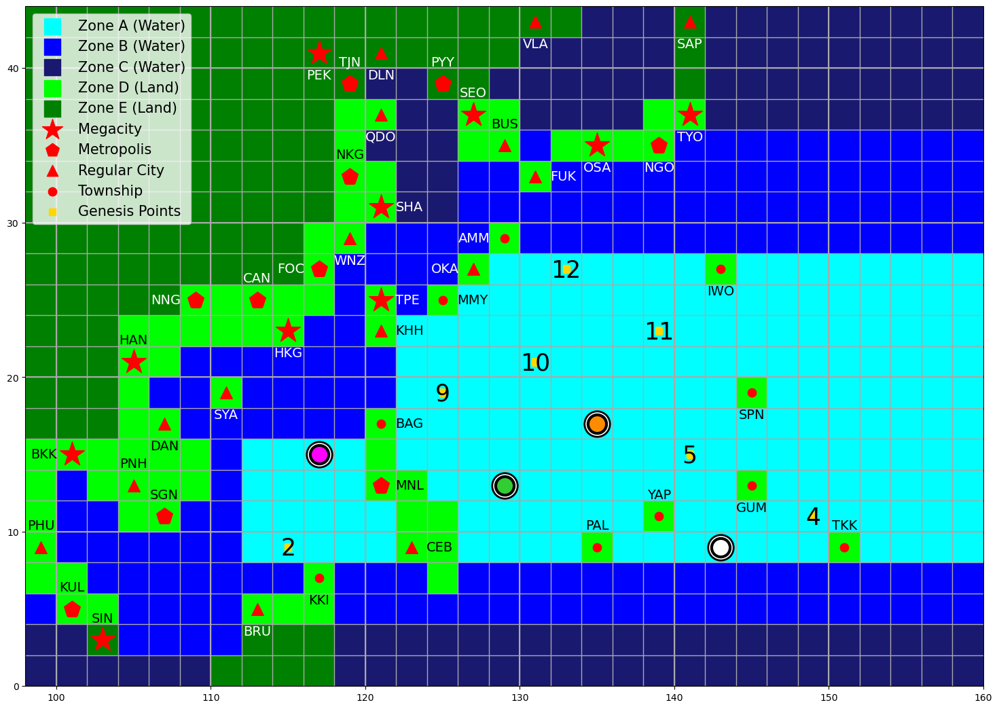

In [28]:
# Plot initial board
Plot_Current_Board(Player_Data)

In [29]:
# Shuffle cards
Movement_Deck = Shuffle_Cards(Movement_Cards)
Intensity_Deck = Shuffle_Cards(Intensity_Cards)
Action_Deck = Shuffle_Cards(Action_Cards)

In [30]:
# Deal cards
Movement_Deck = Deal_Cards(Movement_Deck, Player_Data, 4)
Intensity_Deck = Deal_Cards(Intensity_Deck, Player_Data, 4)
Action_Deck = Deal_Cards(Action_Deck, Player_Data, 2)

In [31]:
# Setup game state
Game_State = Setup_Game_State(Movement_Deck, Intensity_Deck, Action_Deck)

# Save player data and game state history
Player_Data_History = []
Game_State_History = []
Save_State(Player_Data, Game_State, Player_Data_History, Game_State_History)

### Backup Material

In [144]:
Game_State

{'Round': 7,
 'Player Position': 2,
 'Status': 'End Round',
 'Movement Deck': ['E 1 N 2',
  'N/S 1',
  'E 1 N 1',
  'W 1 S 1',
  'N/S 1',
  'W 2 S 1',
  'E 1 S 1',
  'W/E 1',
  'W 5',
  'W ?',
  'N 2',
  'W 2 S 2',
  'N 1',
  'W 1',
  'W 2',
  'W 1 N 1',
  'E 1',
  'E ?',
  'E 2',
  'E ?',
  'E 2',
  'E 4',
  'W 2 N 2',
  'W 4',
  'E 2 N 2',
  'W 2 N 1',
  'W 3',
  'N 1',
  'W 3 N 1',
  'W 2'],
 'Intensity Deck': ['+ ? W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+ ? W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+10 W/m^2',
  '+25 W/m^2',
  '+ ? W/m^2',
  '+ ? W/m^2',
  '+25 W/m^2',
  '+10 W/m^2',
  '+15 W/m^2',
  '+ ? W/m^2',
  '+10 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+15 W/m^2',
  '+20 W/m^2',
  '+15 W/m^2',
  '+15 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+20 W/m^2',
  '+10 W/m^2',
  '+5 W/m^2',
  '+20 W/m^2',
  '+5 W/m^2',
  '+25 W/m^2',
  '+ ? W/m^2',
  '+15 W/

In [145]:
Player_Data

{'Demi': {'Colour': 'magenta',
  'Order': 1,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 8,
  'Lon': np.int64(113),
  'Lat': np.int64(23),
  'Zone': np.int64(4),
  'Hand': ['+5 W/m^2'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 60,
  'Peak Intensity': 65,
  'ACE': np.int64(140),
  'Landfall Costs': np.int64(975),
  'Landfall Cities': ['SYA', 'HKG', 'WNZ', 'FOC', 'CAN']},
 'Kinen': {'Colour': 'limegreen',
  'Order': 2,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 7,
  'Lon': np.int64(125),
  'Lat': np.int64(25),
  'Zone': np.int64(4),
  'Hand': ['Factory Reset', 'Breaking Free'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 110,
  'Peak Intensity': 115,
  'ACE': np.int64(300),
  'Landfall Costs': np.int64(1395),
  'Landfall Cities': ['MNL', 'KHH', 'TPE', 'OKA', 'AMM', 'MMY']},
 'Jin': {'Colour': 'darkorange',
  'Order': 3,
  'Round': 6,
  'Status': 'End Round',
  'Genesis Point': 

In [ ]:
#Player_Data, Game_State = Reset(Player_Data_History, Game_State_History)

In [143]:
Player_Data, Game_State = Undo(Player_Data_History, Game_State_History)

In [146]:
Player_Data_History.pop()

{'Demi': {'Colour': 'magenta',
  'Order': 1,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 8,
  'Lon': np.int64(113),
  'Lat': np.int64(23),
  'Zone': np.int64(4),
  'Hand': ['+5 W/m^2'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 60,
  'Peak Intensity': 65,
  'ACE': np.int64(140),
  'Landfall Costs': np.int64(975),
  'Landfall Cities': ['SYA', 'HKG', 'WNZ', 'FOC', 'CAN']},
 'Kinen': {'Colour': 'limegreen',
  'Order': 2,
  'Round': 7,
  'Status': 'End Round',
  'Genesis Point': 7,
  'Lon': np.int64(125),
  'Lat': np.int64(25),
  'Zone': np.int64(4),
  'Hand': ['Factory Reset', 'Breaking Free'],
  'Cards Played This Round': [],
  'Max Cards': 3,
  'Remainder': 0,
  'Intensity': 110,
  'Peak Intensity': 115,
  'ACE': np.int64(300),
  'Landfall Costs': np.int64(1395),
  'Landfall Cities': ['MNL', 'KHH', 'TPE', 'OKA', 'AMM', 'MMY']},
 'Jin': {'Colour': 'darkorange',
  'Order': 3,
  'Round': 6,
  'Status': 'End Round',
  'Genesis Point': 

In [147]:
Game_State_History.pop()

{'Round': 7,
 'Player Position': 2,
 'Status': 'End Round',
 'Movement Deck': ['E 1 N 2',
  'N/S 1',
  'E 1 N 1',
  'W 1 S 1',
  'N/S 1',
  'W 2 S 1',
  'E 1 S 1',
  'W/E 1',
  'W 5',
  'W ?',
  'N 2',
  'W 2 S 2',
  'N 1',
  'W 1',
  'W 2',
  'W 1 N 1',
  'E 1',
  'E ?',
  'E 2',
  'E ?',
  'E 2',
  'E 4',
  'W 2 N 2',
  'W 4',
  'E 2 N 2',
  'W 2 N 1',
  'W 3',
  'N 1',
  'W 3 N 1',
  'W 2'],
 'Intensity Deck': ['+ ? W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+ ? W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+10 W/m^2',
  '+25 W/m^2',
  '+ ? W/m^2',
  '+ ? W/m^2',
  '+25 W/m^2',
  '+10 W/m^2',
  '+15 W/m^2',
  '+ ? W/m^2',
  '+10 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+15 W/m^2',
  '+30 W/m^2',
  '+5 W/m^2',
  '+5 W/m^2',
  '+15 W/m^2',
  '+20 W/m^2',
  '+15 W/m^2',
  '+15 W/m^2',
  '+5 W/m^2',
  '+10 W/m^2',
  '+20 W/m^2',
  '+10 W/m^2',
  '+5 W/m^2',
  '+20 W/m^2',
  '+5 W/m^2',
  '+25 W/m^2',
  '+ ? W/m^2',
  '+15 W/

## Play Game


--- Round 1: Demi's turn ---


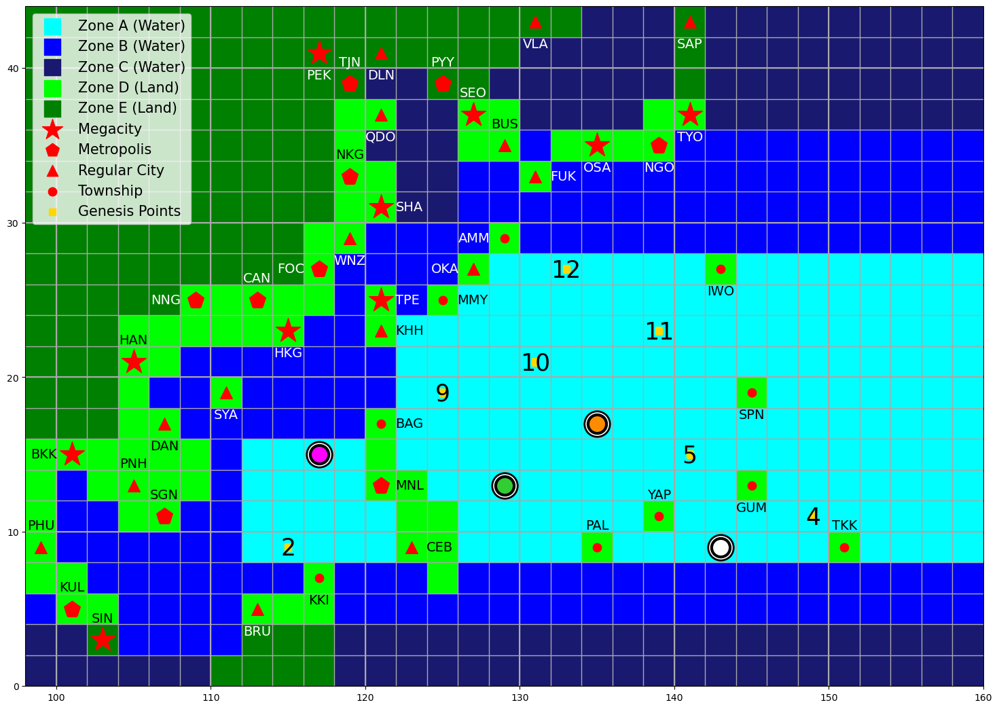

Intensity: 25 knots
ACE: 0 kJ
Landfall Costs: $0 M
Hand:
E 1 N 1
W 1 S 1
N ?
W 2
+5 W/m^2
+10 W/m^2
+10 W/m^2
+20 W/m^2
City Fortress
Survival of the Fittest

--- Round 1: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: W 2
4: +5 W/m^2
5: +10 W/m^2
6: +10 W/m^2
7: +20 W/m^2
8: City Fortress
9: Survival of the Fittest


Choose a card by index to play:  7


Demi played: +20 W/m^2

Demi has intensified to 45 knots!

--- Round 1: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: W 2
4: +5 W/m^2
5: +10 W/m^2
6: +10 W/m^2
7: City Fortress
8: Survival of the Fittest
Enter 'p' to pass.


Choose a card by index to play:  6


Demi played: +10 W/m^2

Demi has intensified to 55 knots!

--- Round 1: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: W 2
4: +5 W/m^2
5: +10 W/m^2
6: City Fortress
7: Survival of the Fittest
Enter 'p' to pass.


Choose a card by index to play:  5


Demi played: +10 W/m^2

Demi has intensified to 65 knots!

--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 20 kJ.
The ocean has 980 kJ of energy remaining.


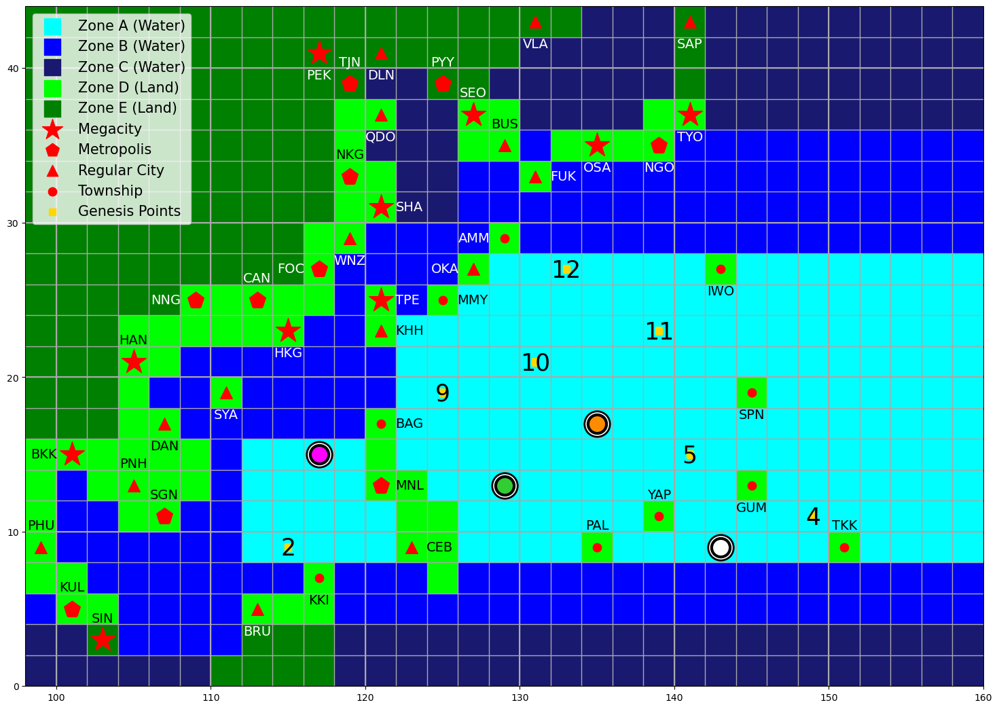

In [52]:
Run_Round(1, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 1: Kinen's turn ---


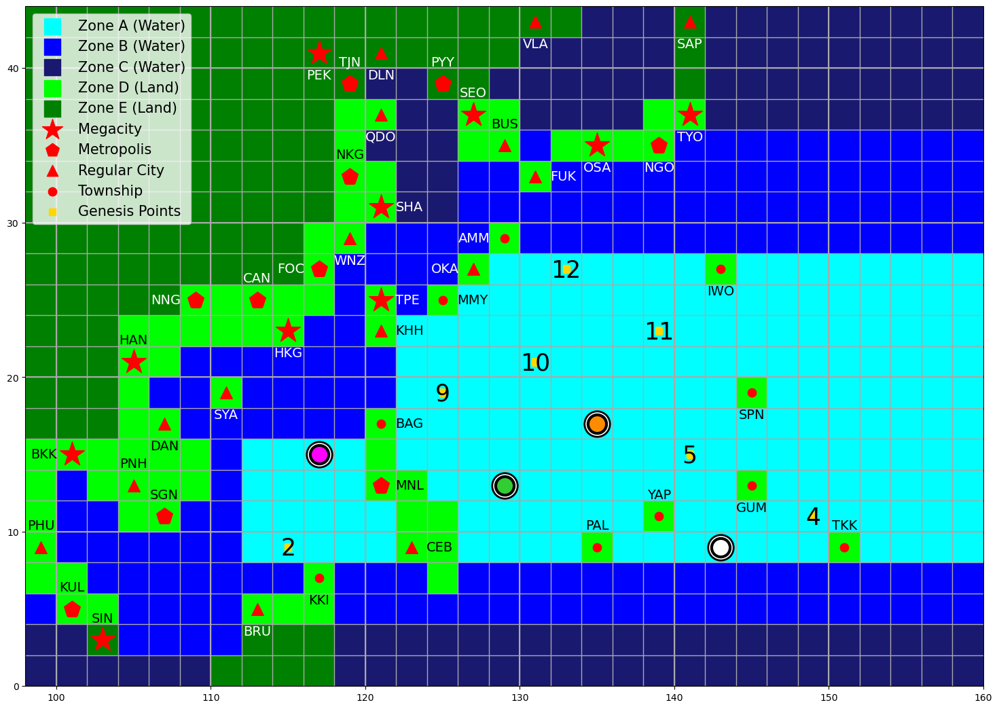

Intensity: 25 knots
ACE: 0 kJ
Landfall Costs: $0 M
Hand:
N 5
N 1
E 1 N 1
W 3
+ ? W/m^2
+25 W/m^2
+20 W/m^2
+25 W/m^2
Rapid Intensification
Factory Reset

--- Round 1: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: W 3
4: + ? W/m^2
5: +25 W/m^2
6: +20 W/m^2
7: +25 W/m^2
8: Rapid Intensification (cannot play)
9: Factory Reset


Choose a card by index to play:  5


Kinen played: +25 W/m^2

Kinen has intensified to 50 knots!

--- Round 1: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: W 3
4: + ? W/m^2
5: +20 W/m^2
6: +25 W/m^2
7: Rapid Intensification
8: Factory Reset
Enter 'p' to pass.


Choose a card by index to play:  7


Kinen played: Rapid Intensification

Kinen has intensified to 75 knots!

--- Round 1: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: W 3
4: + ? W/m^2
5: +20 W/m^2
6: +25 W/m^2
7: Factory Reset
Enter 'p' to pass.


Choose a card by index to play:  4


Kinen played: + ? W/m^2

Kinen rolled 1: + 5 W/m^2
Kinen has intensified to 80 knots!

--- End of Kinen's turn ---
Kinen's current intensity: 80 knots.
Kinen has gained 20 kJ. Current ACE: 20 kJ.
The ocean has 960 kJ of energy remaining.


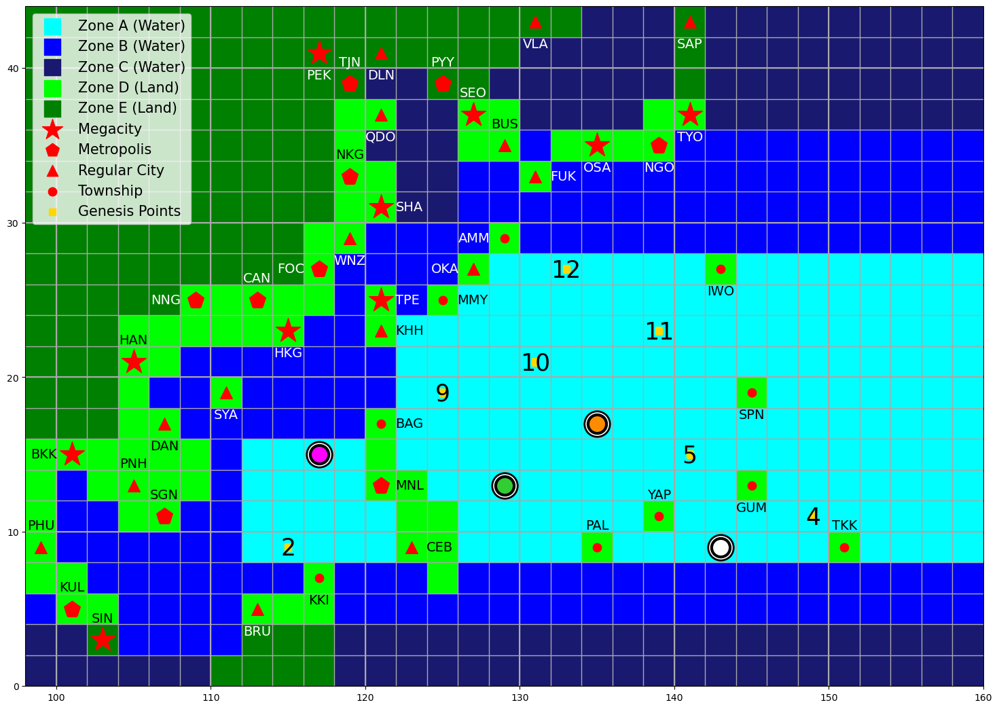

In [53]:
Run_Round(1, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 1: Jin's turn ---


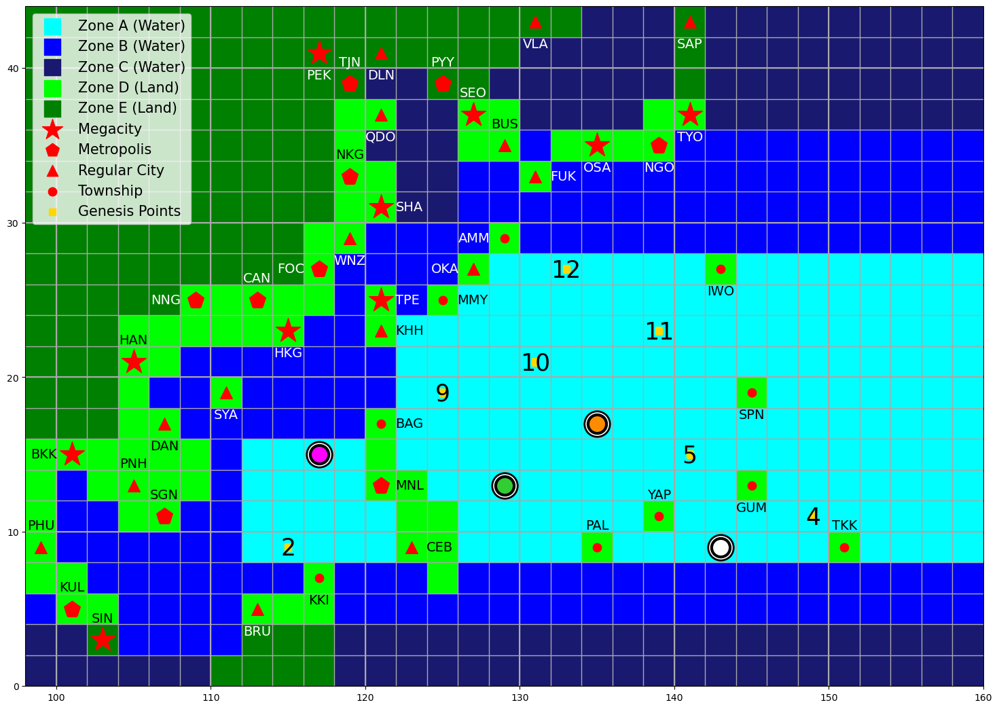

Intensity: 25 knots
ACE: 0 kJ
Landfall Costs: $0 M
Hand:
W 2
W/E 1
N 1
W ?
+5 W/m^2
+20 W/m^2
+20 W/m^2
+10 W/m^2
Random Teleportation
Extra Time

--- Round 1: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: W 2
1: W/E 1
2: N 1
3: W ?
4: +5 W/m^2
5: +20 W/m^2
6: +20 W/m^2
7: +10 W/m^2
8: Random Teleportation
9: Extra Time


Choose a card by index to play:  5


Jin played: +20 W/m^2

Jin has intensified to 45 knots!

--- Round 1: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: W 2
1: W/E 1
2: N 1
3: W ?
4: +5 W/m^2
5: +20 W/m^2
6: +10 W/m^2
7: Random Teleportation
8: Extra Time
Enter 'p' to pass.


Choose a card by index to play:  5


Jin played: +20 W/m^2

Jin has intensified to 65 knots!

--- Round 1: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: W 2
1: W/E 1
2: N 1
3: W ?
4: +5 W/m^2
5: +10 W/m^2
6: Random Teleportation
7: Extra Time
Enter 'p' to pass.


Choose a card by index to play:  0


Jin played: W 2



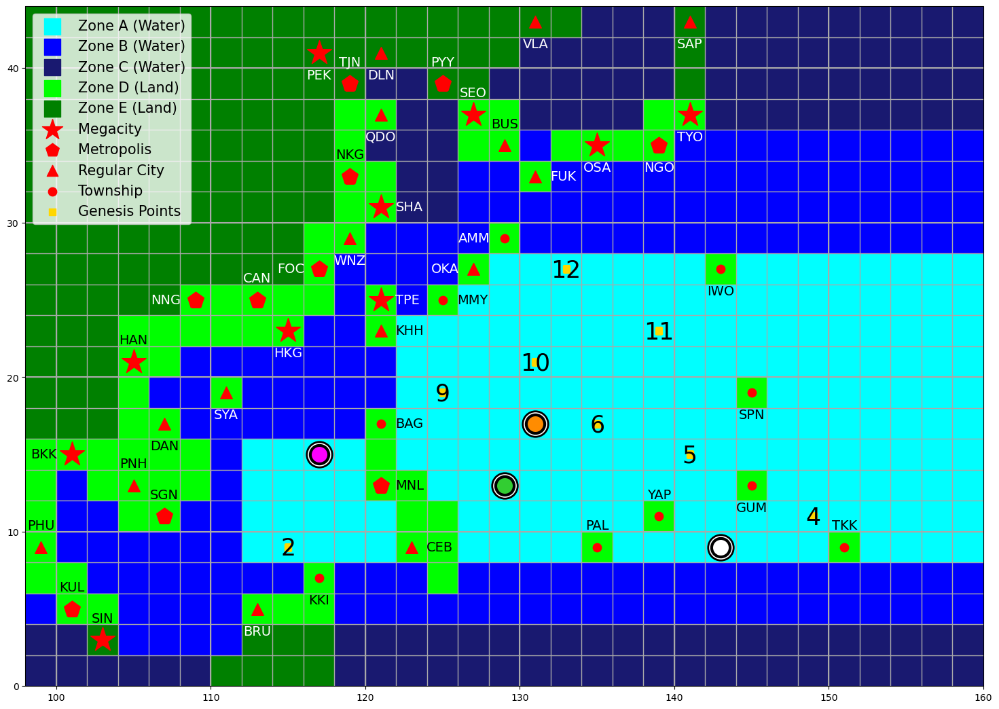


--- End of Jin's turn ---
Jin's current intensity: 65 knots.
Jin has gained 20 kJ. Current ACE: 20 kJ.
The ocean has 940 kJ of energy remaining.


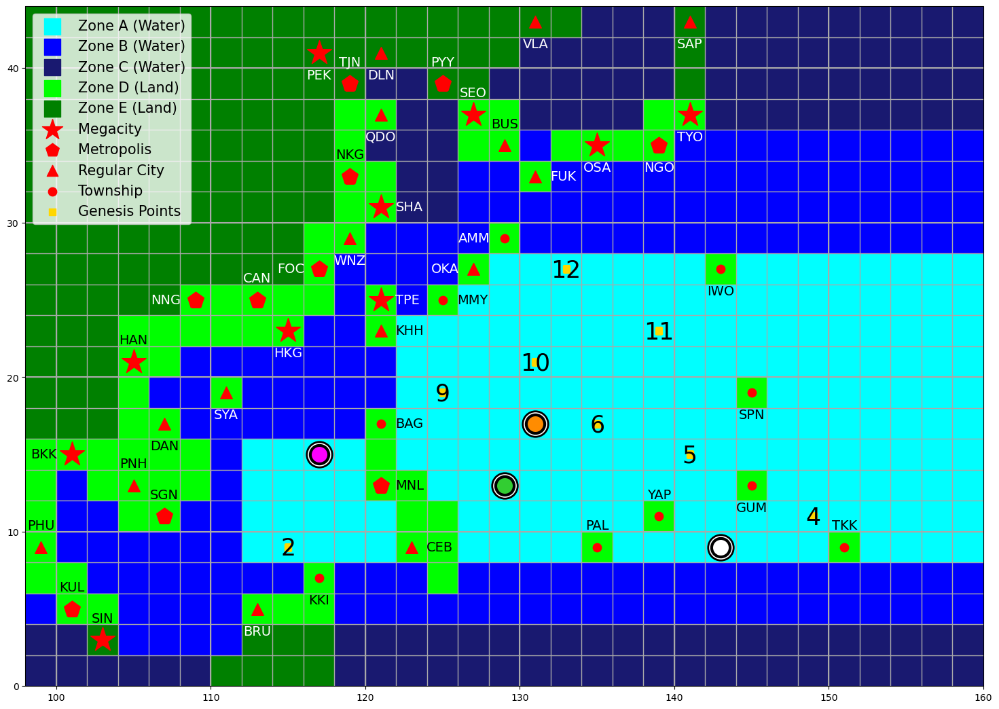

In [54]:
Run_Round(1, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 1: Jason's turn ---


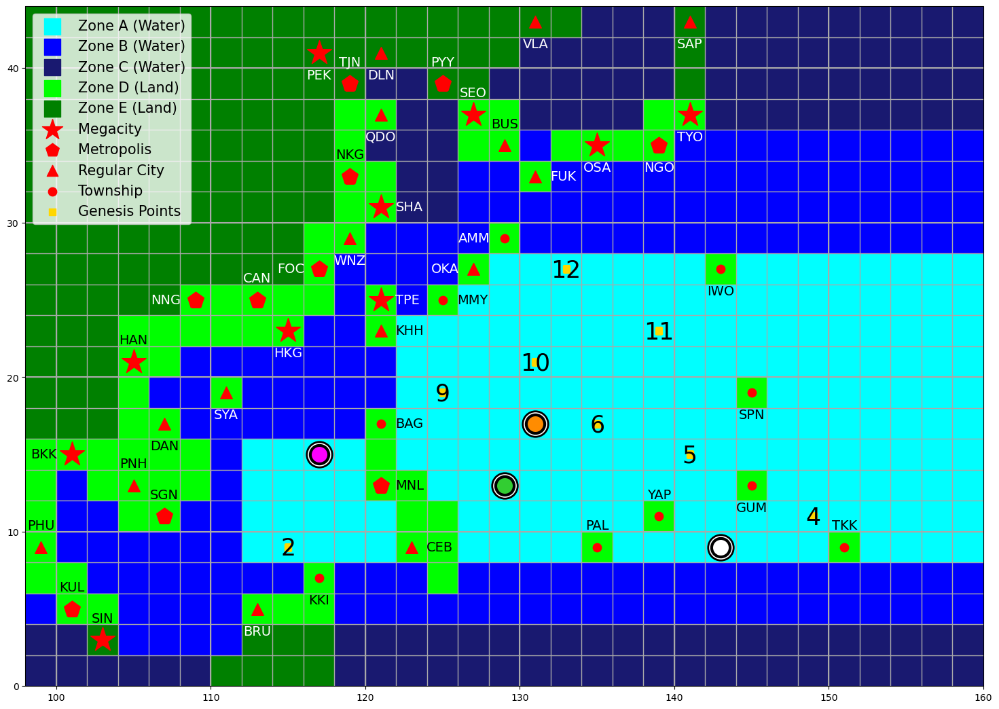

Intensity: 25 knots
ACE: 0 kJ
Landfall Costs: $0 M
Hand:
E 1
W/E/N/S 1
E 1
W 1 N 1
+10 W/m^2
+5 W/m^2
+10 W/m^2
+5 W/m^2
Cyclone Express
Rapid Intensification

--- Round 1: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: W 1 N 1
4: +10 W/m^2
5: +5 W/m^2
6: +10 W/m^2
7: +5 W/m^2
8: Cyclone Express (cannot play)
9: Rapid Intensification (cannot play)


Choose a card by index to play:  4


Jason played: +10 W/m^2

Jason has intensified to 35 knots!

--- Round 1: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: W 1 N 1
4: +5 W/m^2
5: +10 W/m^2
6: +5 W/m^2
7: Cyclone Express (cannot play)
8: Rapid Intensification
Enter 'p' to pass.


Choose a card by index to play:  5


Jason played: +10 W/m^2

Jason has intensified to 45 knots!

--- Round 1: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: W 1 N 1
4: +5 W/m^2
5: +5 W/m^2
6: Cyclone Express (cannot play)
7: Rapid Intensification
Enter 'p' to pass.


Choose a card by index to play:  3


Jason played: W 1 N 1



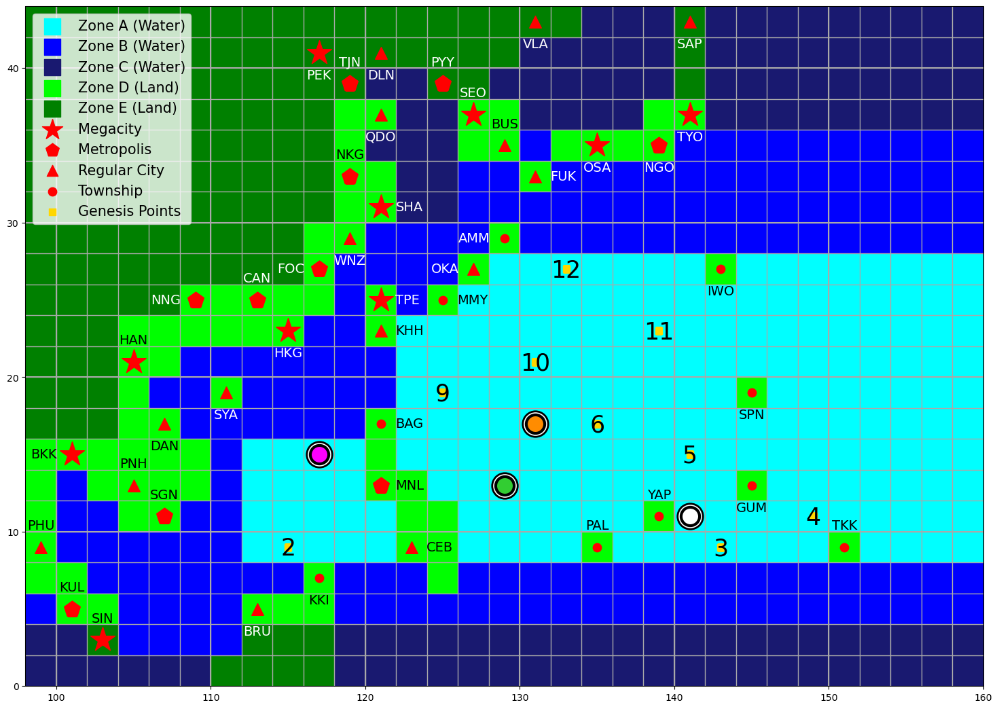


--- End of Jason's turn ---
Jason's current intensity: 45 knots.
Jason has gained 10 kJ. Current ACE: 10 kJ.
The ocean has 930 kJ of energy remaining.


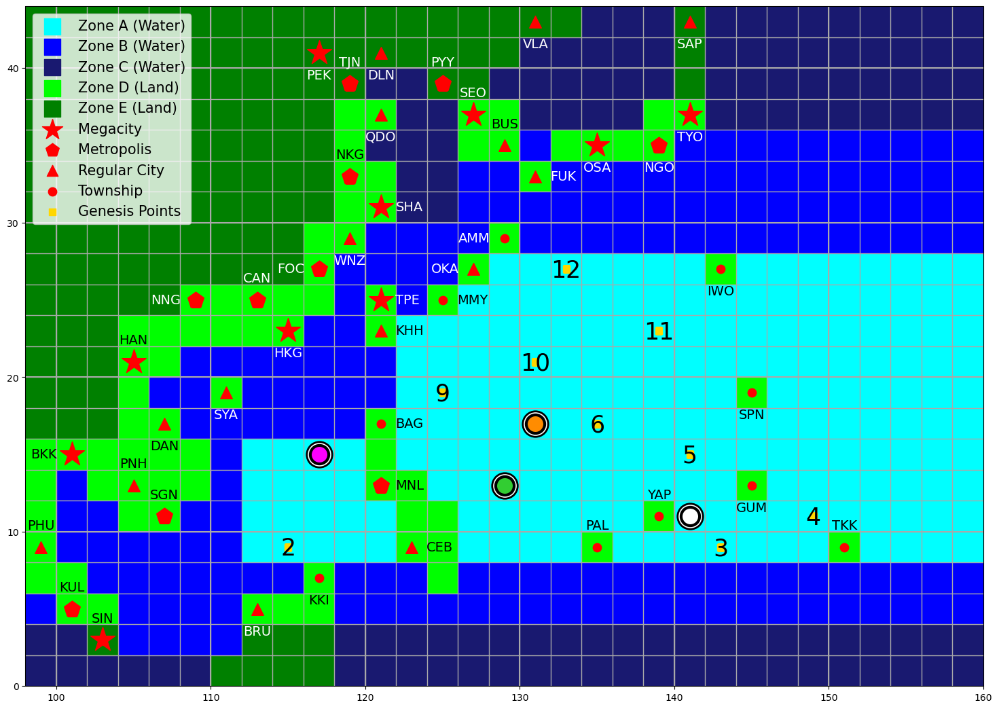

In [55]:
Run_Round(1, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 2: Demi's turn ---


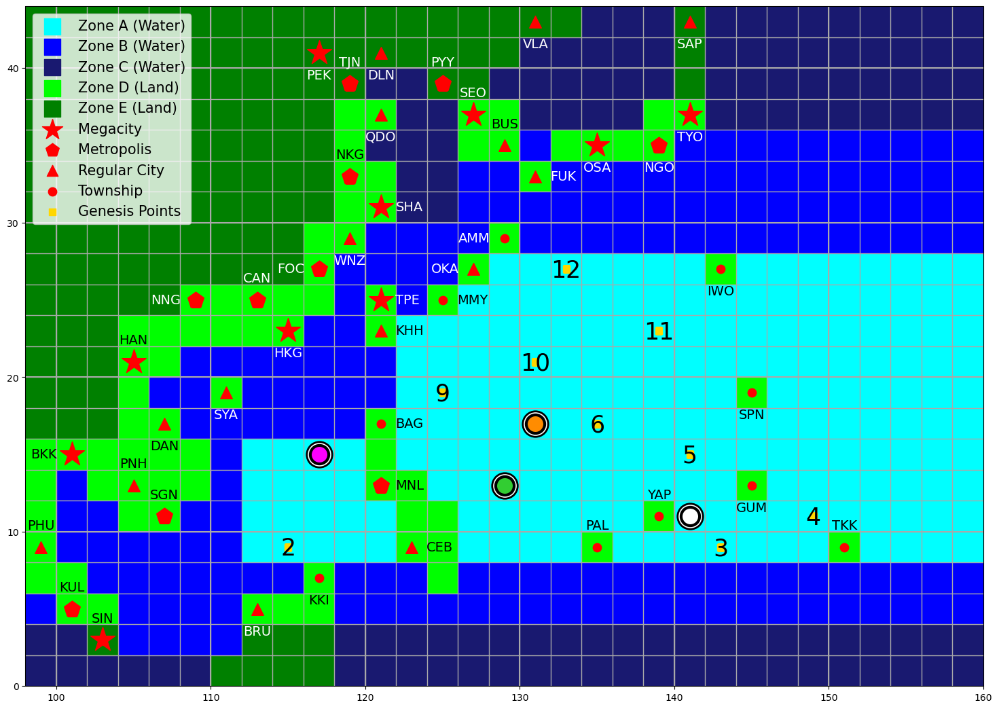

Intensity: 65 knots
ACE: 20 kJ
Landfall Costs: $0 M
Hand:
E 1 N 1
W 1 S 1
N ?
W 2
+5 W/m^2
City Fortress
Survival of the Fittest

--- Round 2: Demi's draw phase ---
0: Movement Deck (59 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 0


Demi drew: E 2 from Movement Deck.

0: Movement Deck (58 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 0


Demi drew: W 1 N 2 from Movement Deck.


--- Round 2: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: W 2
4: +5 W/m^2
5: City Fortress
6: Survival of the Fittest
7: E 2
8: W 1 N 2


Choose a card by index to play:  8


Demi played: W 1 N 2



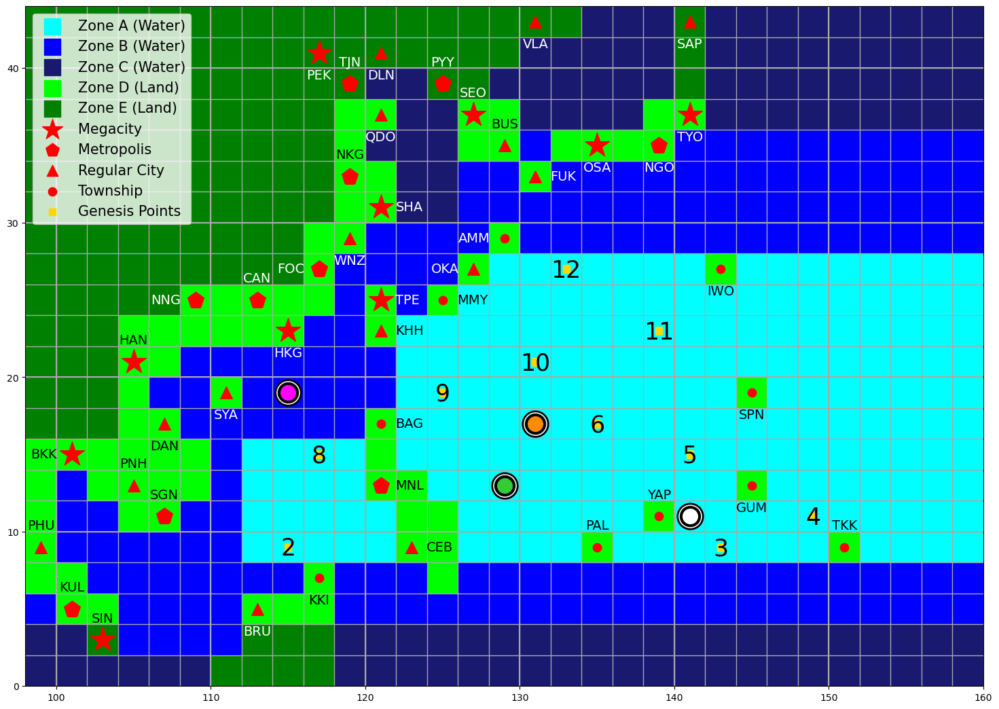


--- Round 2: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: W 2
4: +5 W/m^2
5: City Fortress
6: Survival of the Fittest
7: E 2
Enter 'p' to pass.


Choose a card by index to play:  3


Demi played: W 2



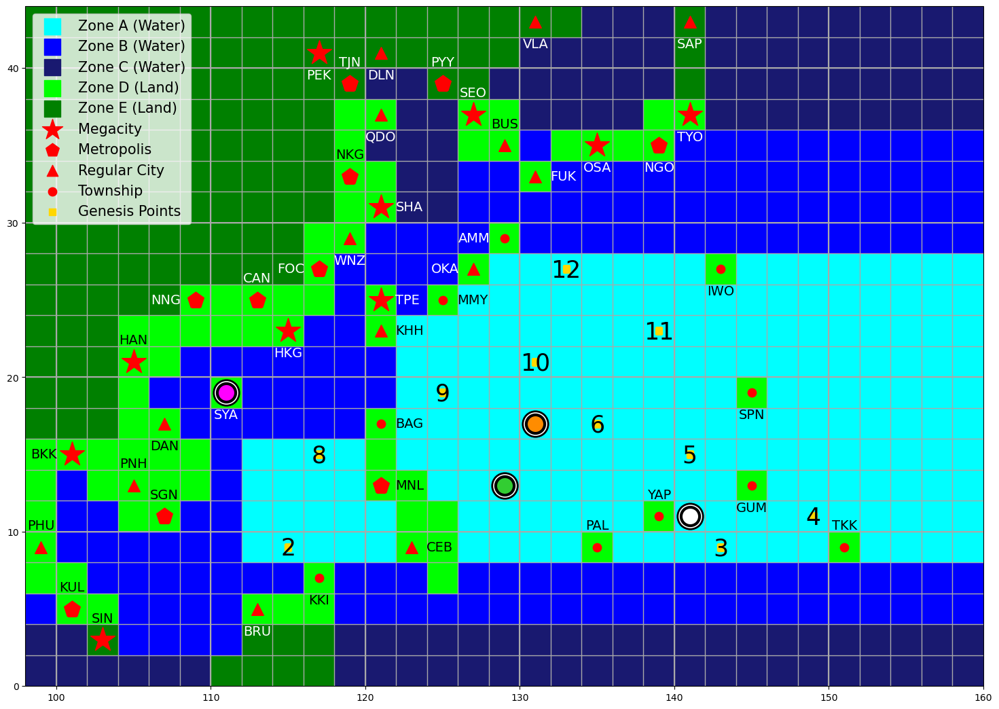

Demi has made landfall at SYA (Sanya) and gains $130M!
Remaining budget of SYA (Sanya): $270M

--- Round 2: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: +5 W/m^2 (cannot play)
4: City Fortress
5: Survival of the Fittest
6: E 2
Enter 'p' to pass.


Choose a card by index to play:  6


Demi played: E 2



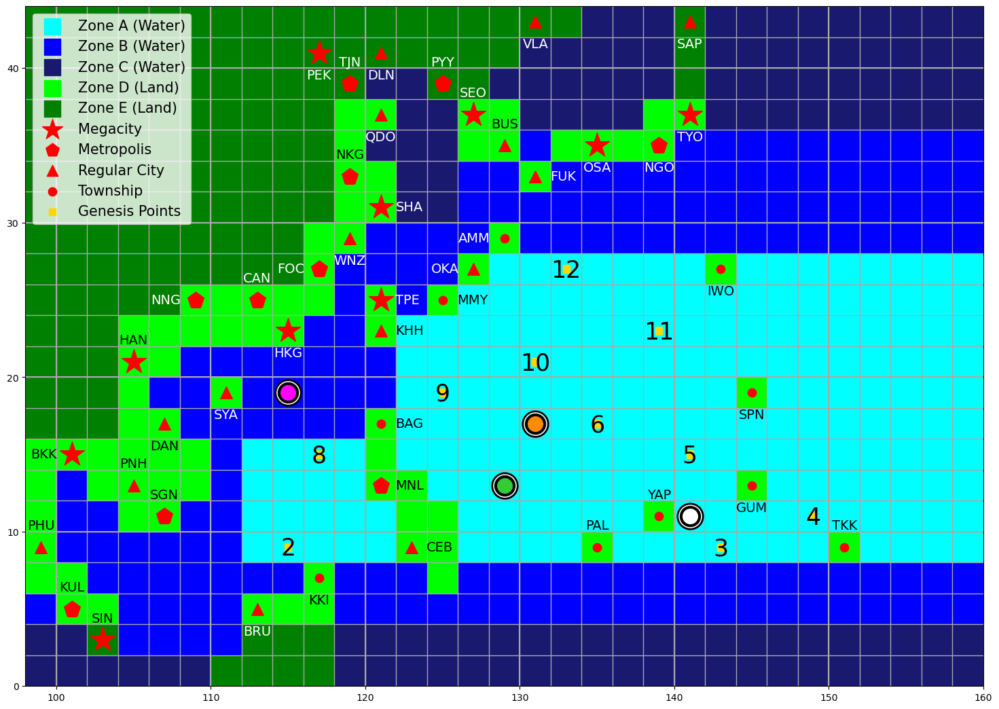


--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 40 kJ.
The ocean has 910 kJ of energy remaining.


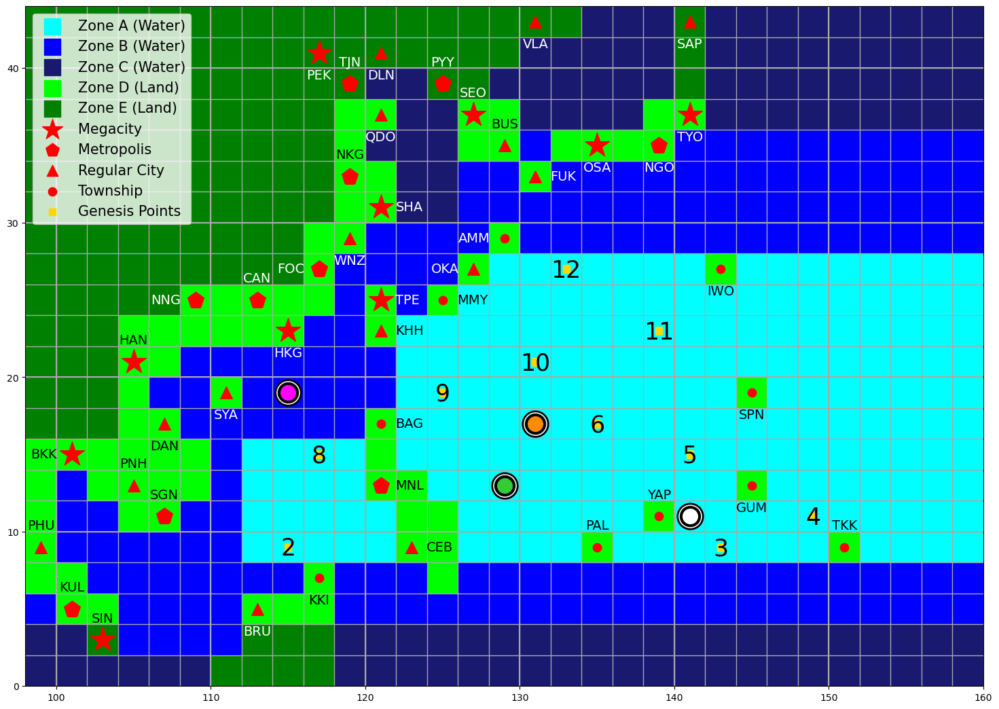

In [56]:
Run_Round(2, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 2: Kinen's turn ---


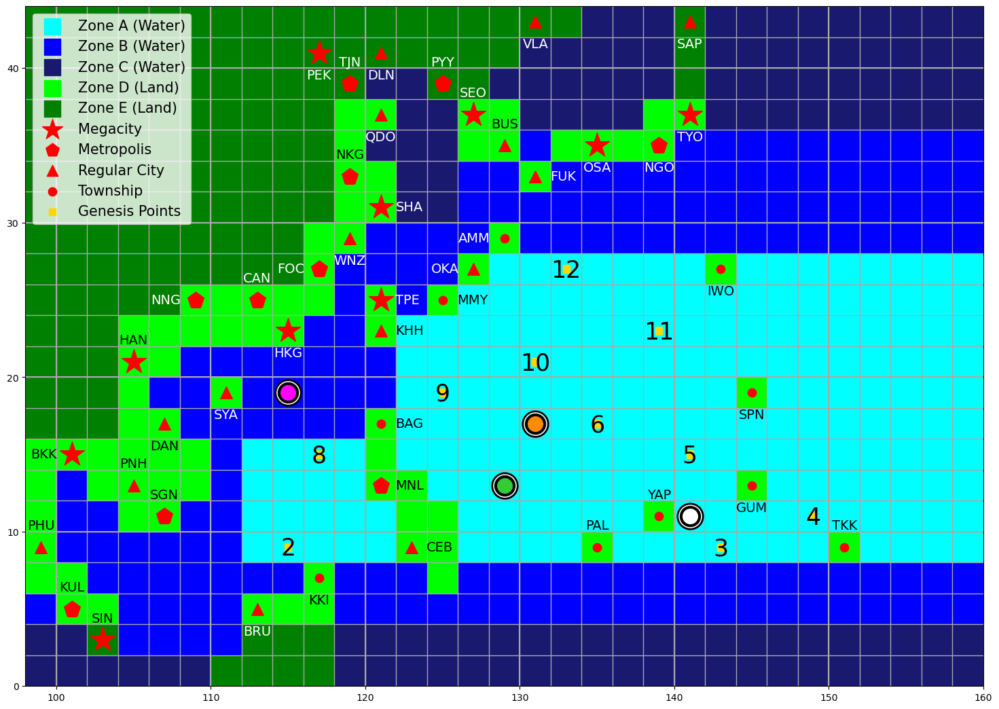

Intensity: 80 knots
ACE: 20 kJ
Landfall Costs: $0 M
Hand:
N 5
N 1
E 1 N 1
W 3
+20 W/m^2
+25 W/m^2
Factory Reset

--- Round 2: Kinen's draw phase ---
0: Movement Deck (57 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 0


Kinen drew: E 2 S 1 from Movement Deck.

0: Movement Deck (56 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 0


Kinen drew: W/E/N/S 1 from Movement Deck.


--- Round 2: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: W 3
4: +20 W/m^2
5: +25 W/m^2
6: Factory Reset
7: E 2 S 1
8: W/E/N/S 1


Choose a card by index to play:  5


Kinen played: +25 W/m^2

Kinen has intensified to 100 knots!

--- Round 2: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: W 3
4: +20 W/m^2
5: Factory Reset
6: E 2 S 1
7: W/E/N/S 1
Enter 'p' to pass.


Choose a card by index to play:  3


Kinen played: W 3



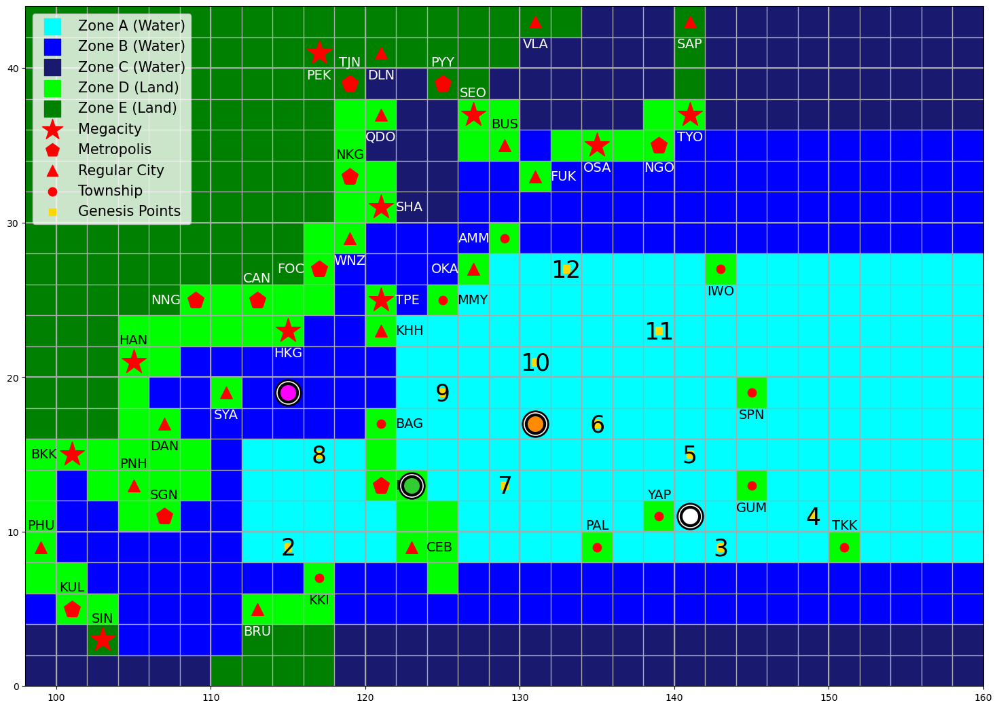


--- Round 2: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: +20 W/m^2 (cannot play)
4: Factory Reset
5: E 2 S 1
6: W/E/N/S 1
Enter 'p' to pass.


Choose a card by index to play:  6


Kinen played: W/E/N/S 1



Choose W, E, N or S:  W


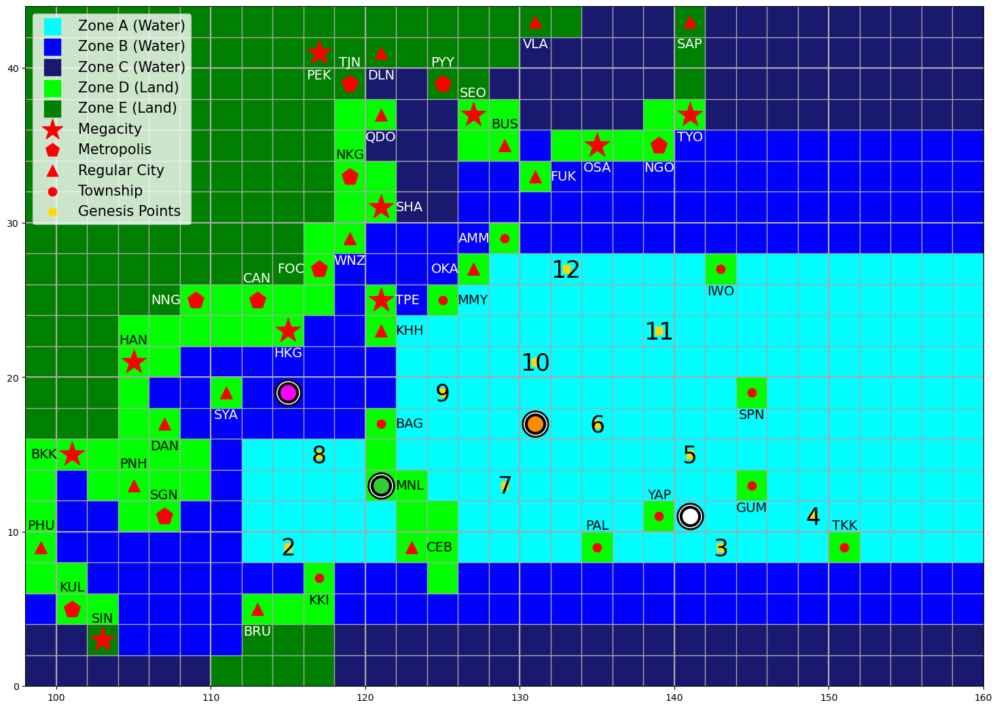

Kinen has made landfall at MNL (Manila) and gains $300M!
Remaining budget of MNL (Manila): $450M

--- End of Kinen's turn ---
Kinen's current intensity: 100 knots.
Kinen has gained 50 kJ. Current ACE: 70 kJ.
The ocean has 860 kJ of energy remaining.
Kinen has weakened to 95 knots.


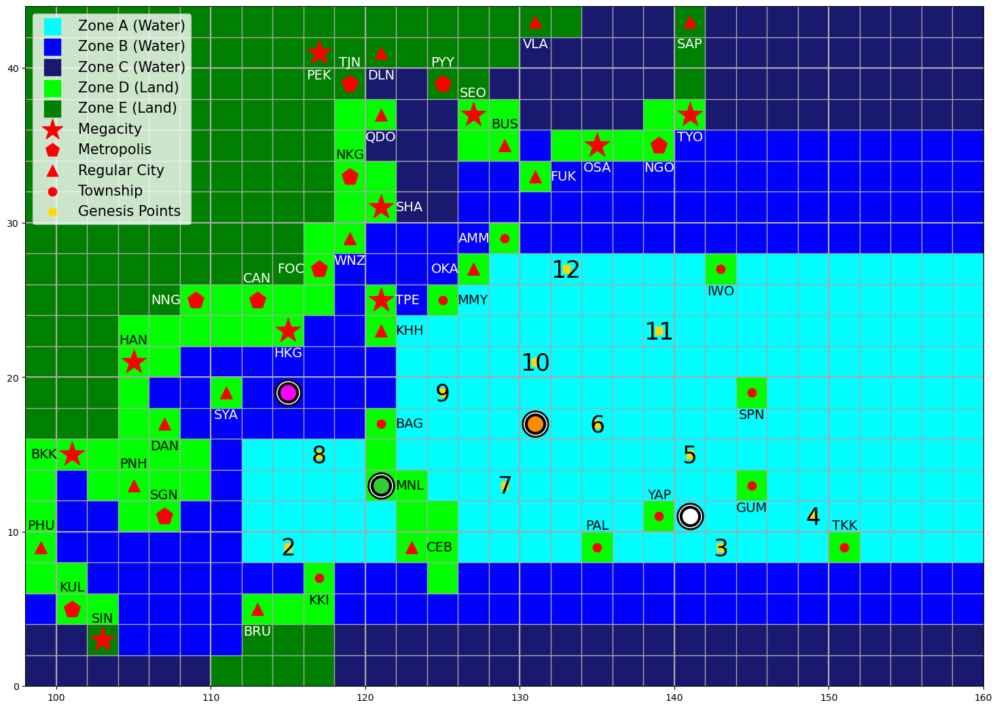

In [57]:
Run_Round(2, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 2: Jin's turn ---


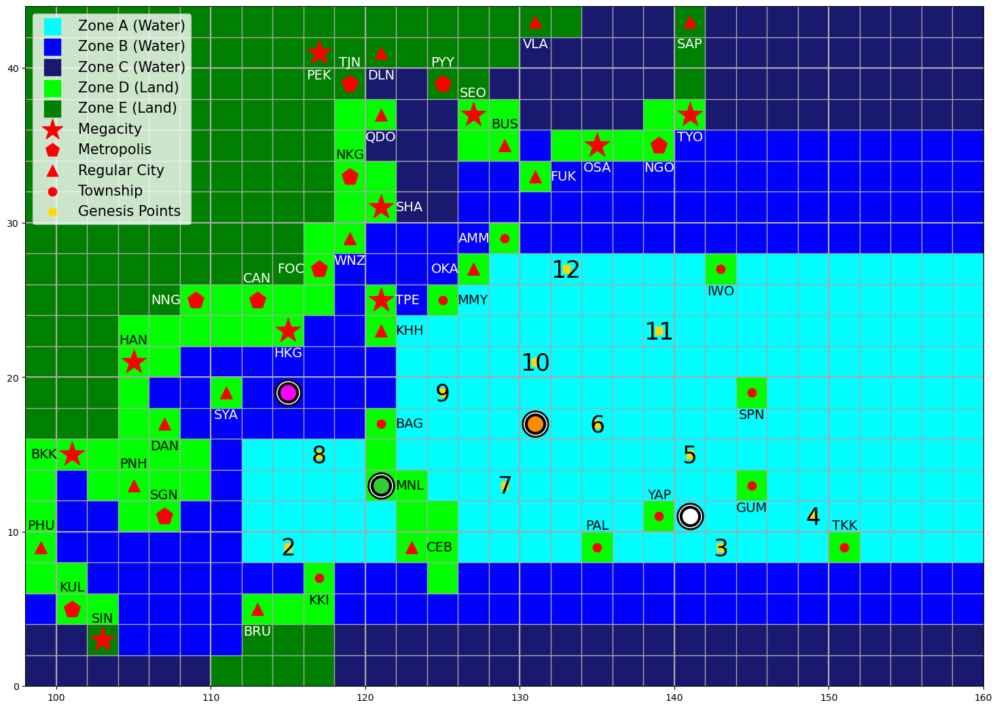

Intensity: 65 knots
ACE: 20 kJ
Landfall Costs: $0 M
Hand:
W/E 1
N 1
W ?
+5 W/m^2
+10 W/m^2
Random Teleportation
Extra Time

--- Round 2: Jin's draw phase ---
0: Movement Deck (55 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 0


Jin drew: E 1 S 1 from Movement Deck.

0: Movement Deck (54 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (22 cards left)


Choose a deck by index: 2


Jin drew: Wrong Way Round from Action Deck.


--- Round 2: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: W/E 1
1: N 1
2: W ?
3: +5 W/m^2
4: +10 W/m^2
5: Random Teleportation
6: Extra Time
7: E 1 S 1
8: Wrong Way Round (cannot play)


Choose a card by index to play:  2


Jin played: W ?

Jin rolled 1: W 1


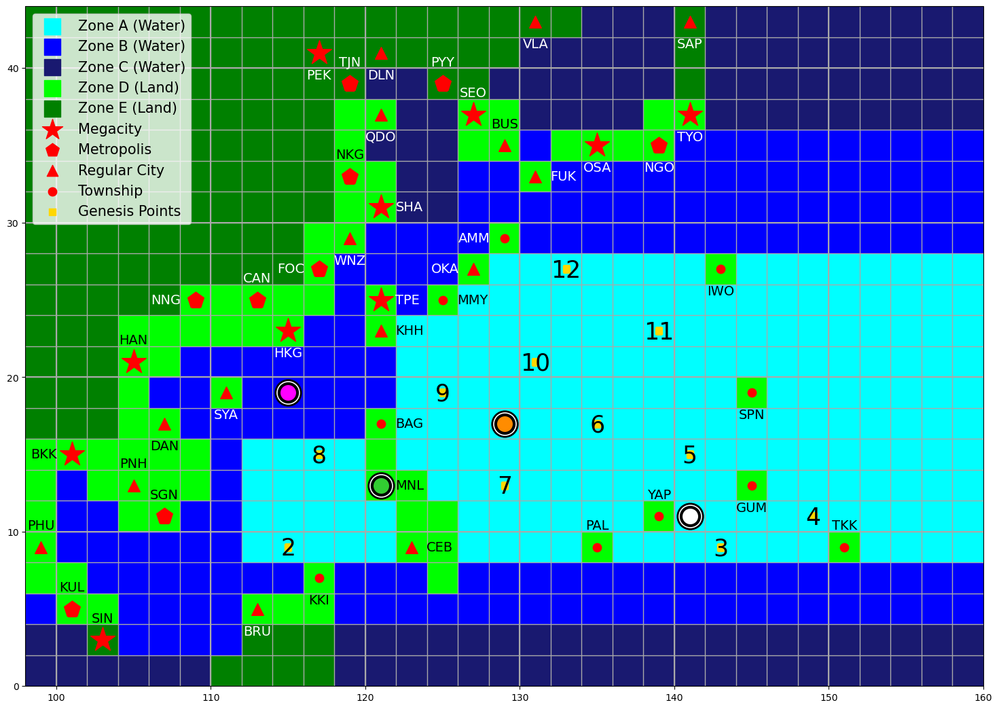


--- Round 2: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: W/E 1
1: N 1
2: +5 W/m^2
3: +10 W/m^2
4: Random Teleportation
5: Extra Time
6: E 1 S 1
7: Wrong Way Round (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  3


Jin played: +10 W/m^2

Jin has intensified to 75 knots!

--- Round 2: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: W/E 1
1: N 1
2: +5 W/m^2
3: Random Teleportation
4: Extra Time
5: E 1 S 1
6: Wrong Way Round (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  1


Jin played: N 1



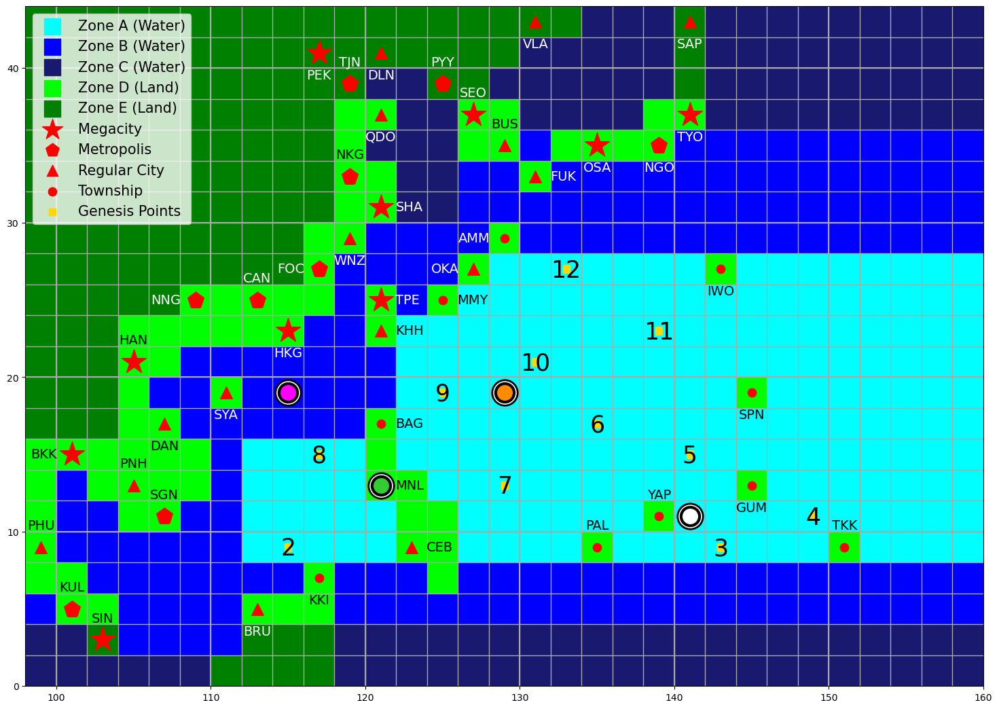


--- End of Jin's turn ---
Jin's current intensity: 75 knots.
Jin has gained 20 kJ. Current ACE: 40 kJ.
The ocean has 840 kJ of energy remaining.


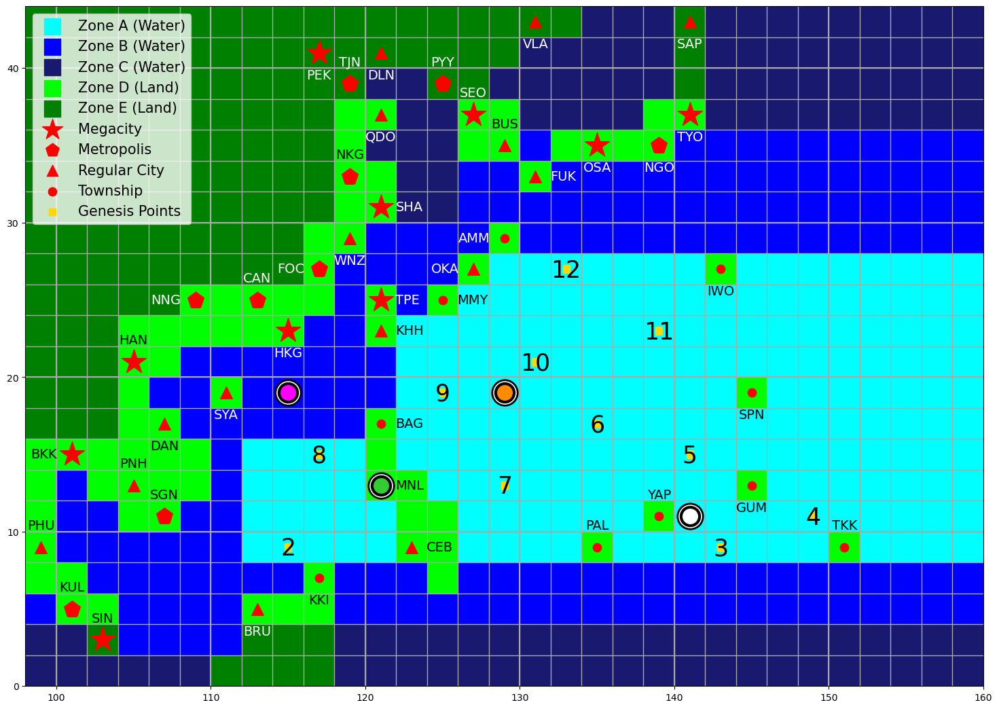

In [58]:
Run_Round(2, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 2: Jason's turn ---


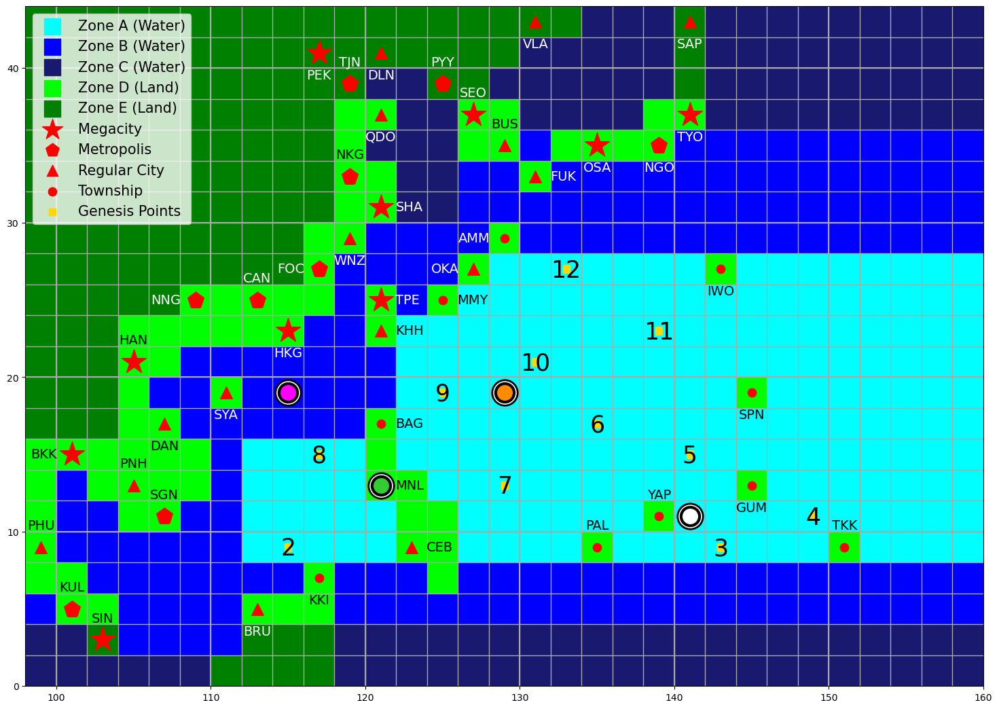

Intensity: 45 knots
ACE: 10 kJ
Landfall Costs: $0 M
Hand:
E 1
W/E/N/S 1
E 1
+5 W/m^2
+5 W/m^2
Cyclone Express
Rapid Intensification

--- Round 2: Jason's draw phase ---
0: Movement Deck (54 cards left)
1: Intensity Deck (59 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: +15 W/m^2 from Intensity Deck.

0: Movement Deck (54 cards left)
1: Intensity Deck (58 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: +5 W/m^2 from Intensity Deck.


--- Round 2: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: +5 W/m^2
5: Cyclone Express (cannot play)
6: Rapid Intensification (cannot play)
7: +15 W/m^2
8: +5 W/m^2


Choose a card by index to play:  7


Jason played: +15 W/m^2

Jason has intensified to 60 knots!

--- Round 2: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: +5 W/m^2
5: Cyclone Express (cannot play)
6: Rapid Intensification
7: +5 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  7


Jason played: +5 W/m^2

Jason has intensified to 65 knots!

--- Round 2: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: +5 W/m^2
5: Cyclone Express (cannot play)
6: Rapid Intensification
Enter 'p' to pass.


Choose a card by index to play:  4


Jason played: +5 W/m^2

Jason has intensified to 70 knots!

--- End of Jason's turn ---
Jason's current intensity: 70 knots.
Jason has gained 20 kJ. Current ACE: 30 kJ.
The ocean has 820 kJ of energy remaining.


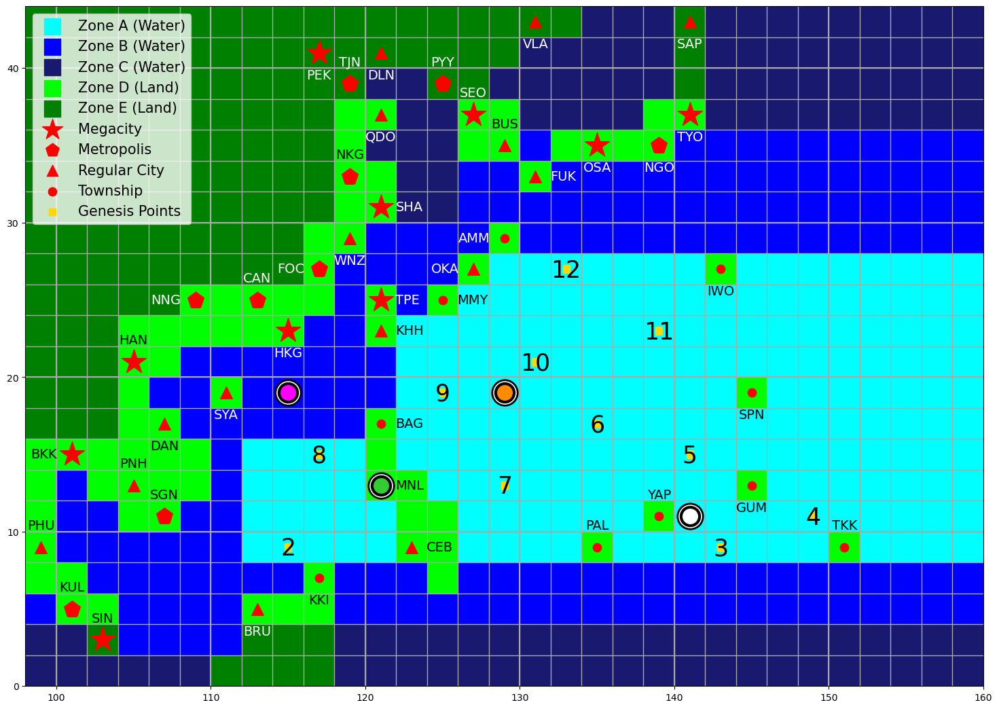

In [59]:
Run_Round(2, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 3: Demi's turn ---


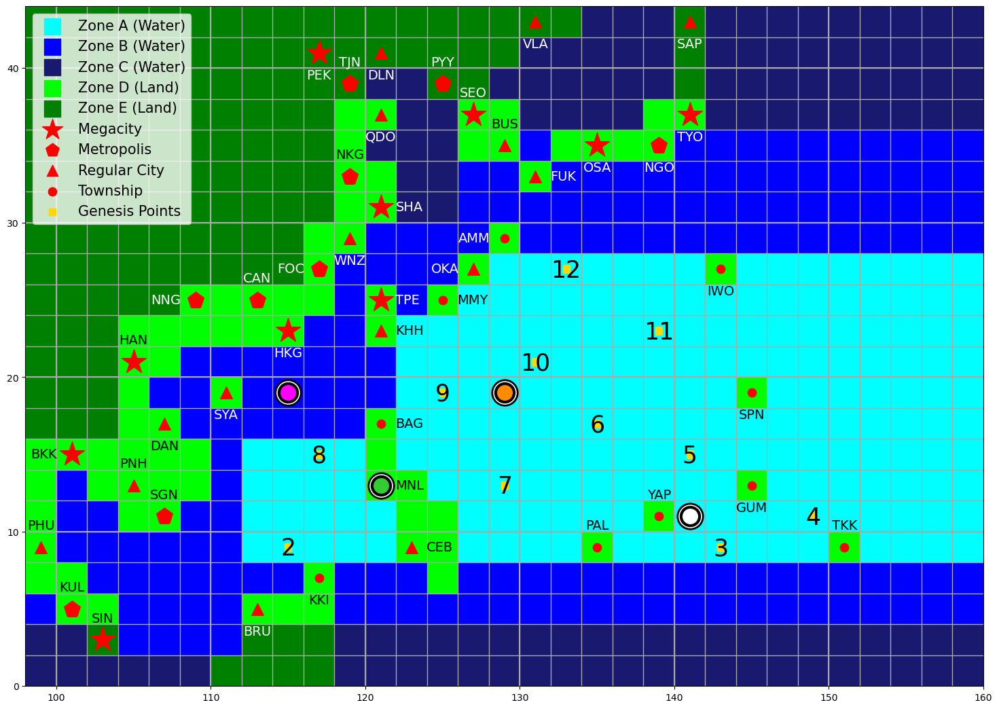

Intensity: 65 knots
ACE: 40 kJ
Landfall Costs: $130 M
Hand:
E 1 N 1
W 1 S 1
N ?
+5 W/m^2
City Fortress
Survival of the Fittest

--- Round 3: Demi's draw phase ---
0: Movement Deck (54 cards left)
1: Intensity Deck (57 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Demi drew: +5 W/m^2 from Intensity Deck.

0: Movement Deck (54 cards left)
1: Intensity Deck (56 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Demi drew: S ? from Movement Deck.


--- Round 3: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: N ?
3: +5 W/m^2
4: City Fortress
5: Survival of the Fittest
6: +5 W/m^2
7: S ?


Choose a card by index to play:  2


Demi played: N ?

Demi rolled 2: N 2


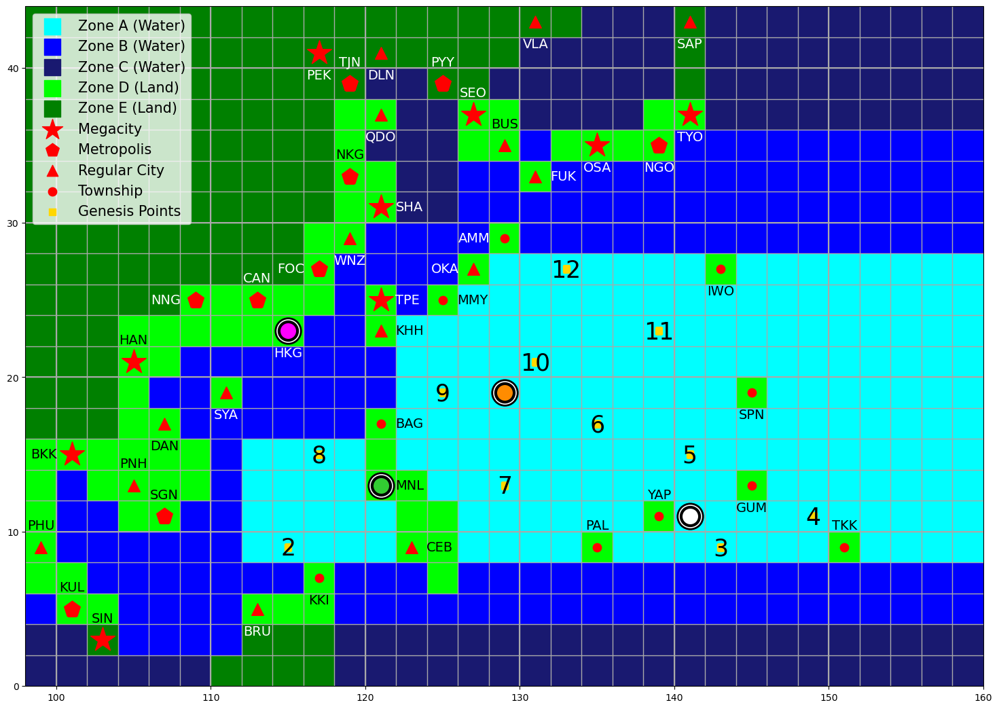

Demi has made landfall at HKG (Hong Kong) and gains $325M!
Remaining budget of HKG (Hong Kong): $1175M

--- Round 3: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: +5 W/m^2 (cannot play)
3: City Fortress
4: Survival of the Fittest
5: +5 W/m^2 (cannot play)
6: S ?
Enter 'p' to pass.


Choose a card by index to play:  4


Demi played: Survival of the Fittest

Demi is immune from any weakening for the next 3 rounds.

--- Round 3: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1 N 1
1: W 1 S 1
2: +5 W/m^2 (cannot play)
3: City Fortress
4: +5 W/m^2 (cannot play)
5: S ?
Enter 'p' to pass.


Choose a card by index to play:  0


Demi played: E 1 N 1



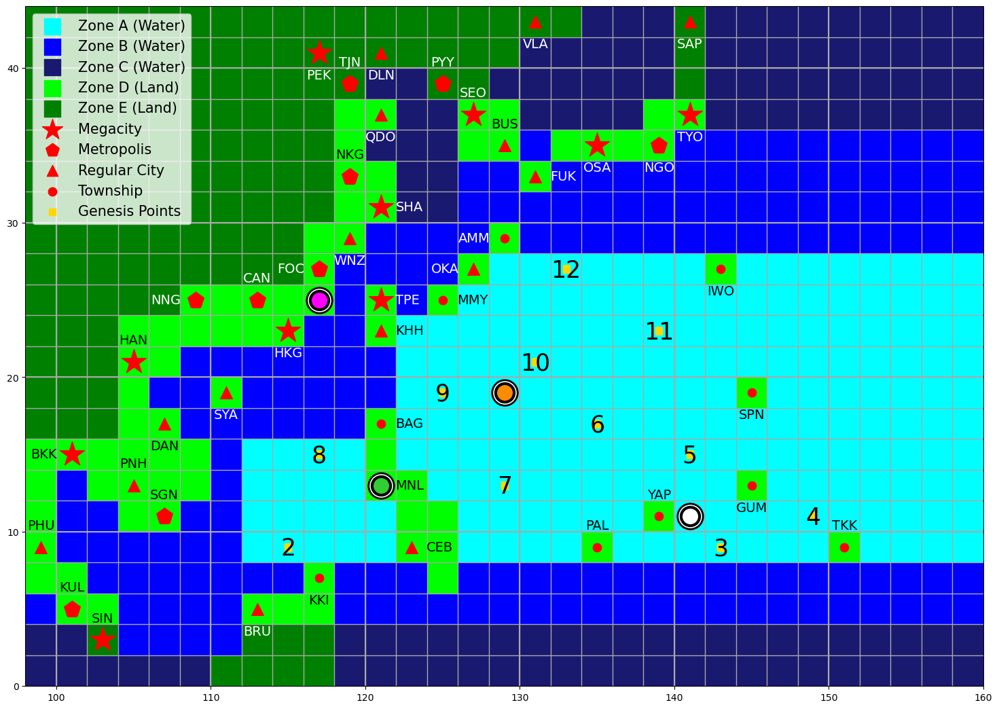


--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 60 kJ.
The ocean has 800 kJ of energy remaining.


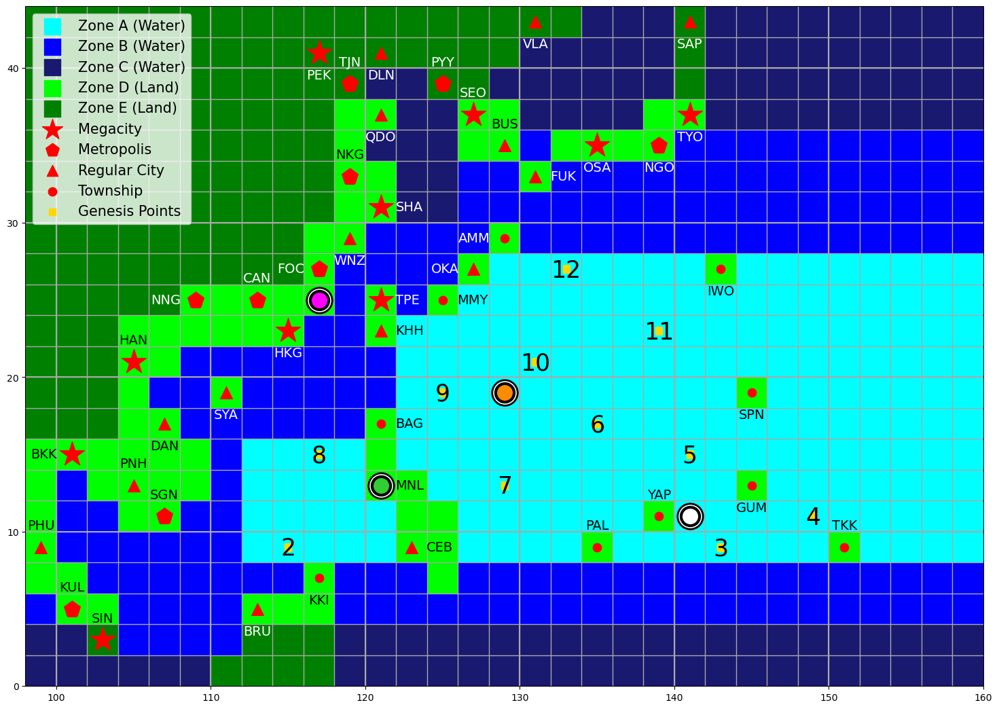

In [60]:
Run_Round(3, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 3: Kinen's turn ---


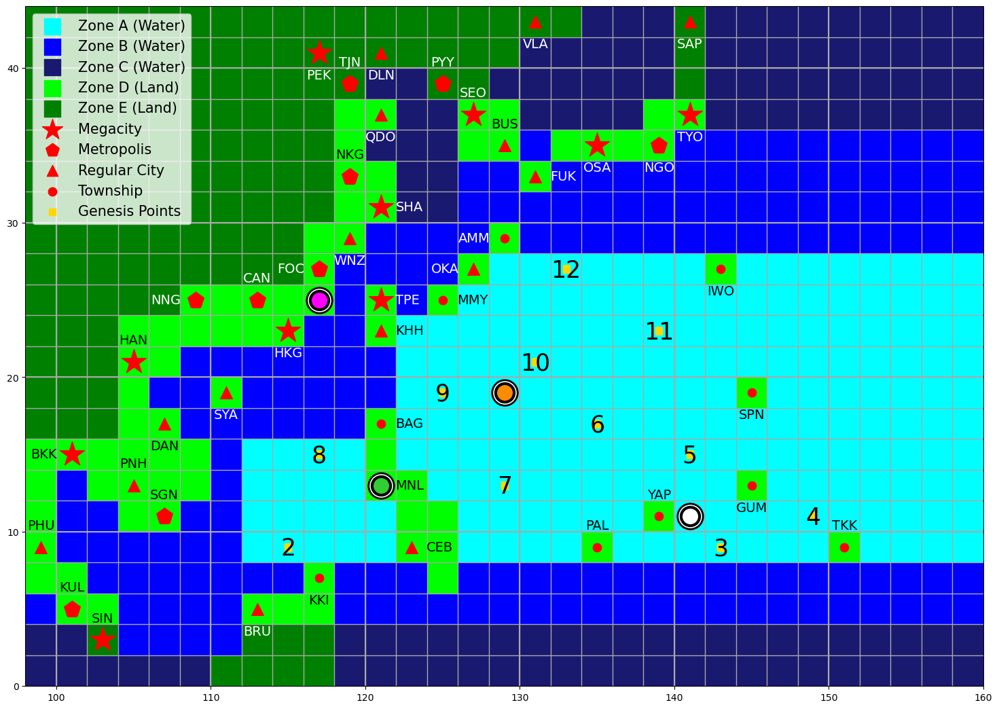

Intensity: 95 knots
ACE: 70 kJ
Landfall Costs: $300 M
Hand:
N 5
N 1
E 1 N 1
+20 W/m^2
Factory Reset
E 2 S 1

--- Round 3: Kinen's draw phase ---
0: Movement Deck (53 cards left)
1: Intensity Deck (56 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Kinen drew: E 3 from Movement Deck.

0: Movement Deck (52 cards left)
1: Intensity Deck (56 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Kinen drew: W 1 N 1 from Movement Deck.


--- Round 3: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: N 5
1: N 1
2: E 1 N 1
3: +20 W/m^2 (cannot play)
4: Factory Reset
5: E 2 S 1
6: E 3
7: W 1 N 1


Choose a card by index to play:  0


Kinen played: N 5



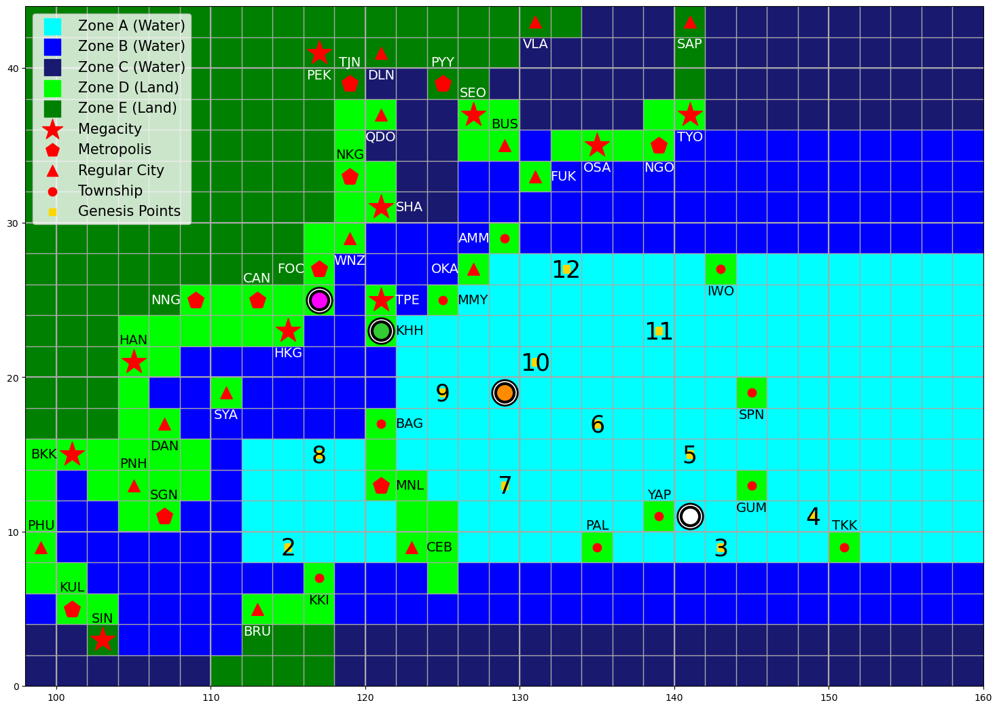

Kinen has made landfall at KHH (Kaohsiung) and gains $190M!
Remaining budget of KHH (Kaohsiung): $210M

--- Round 3: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: N 1
1: E 1 N 1
2: +20 W/m^2 (cannot play)
3: Factory Reset
4: E 2 S 1
5: E 3
6: W 1 N 1
Enter 'p' to pass.


Choose a card by index to play:  0


Kinen played: N 1



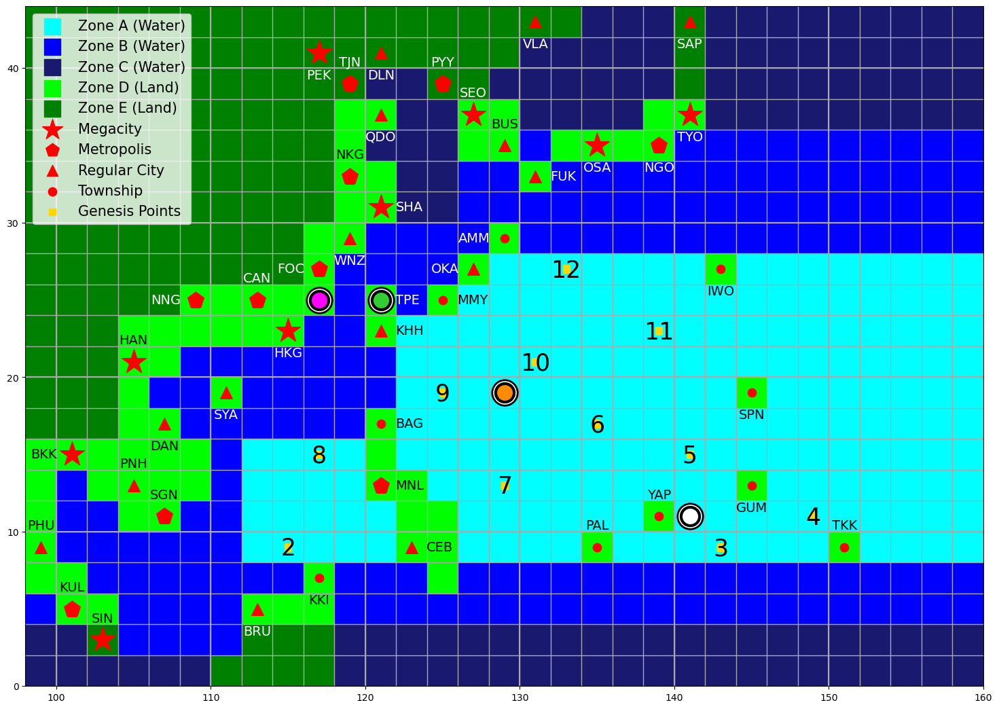

Kinen has made landfall at TPE (Taipei) and gains $475M!
Remaining budget of TPE (Taipei): $1025M

--- Round 3: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1 N 1
1: +20 W/m^2 (cannot play)
2: Factory Reset
3: E 2 S 1
4: E 3
5: W 1 N 1
Enter 'p' to pass.


Choose a card by index to play:  4


Kinen played: E 3



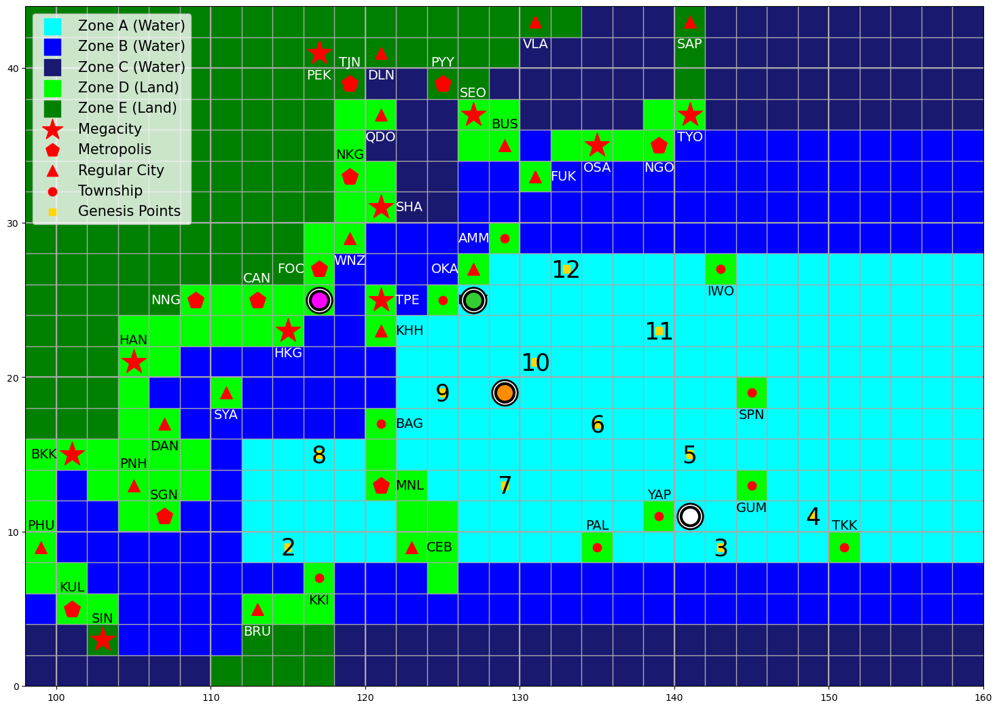


--- End of Kinen's turn ---
Kinen's current intensity: 95 knots.
Kinen has gained 30 kJ. Current ACE: 100 kJ.
The ocean has 770 kJ of energy remaining.


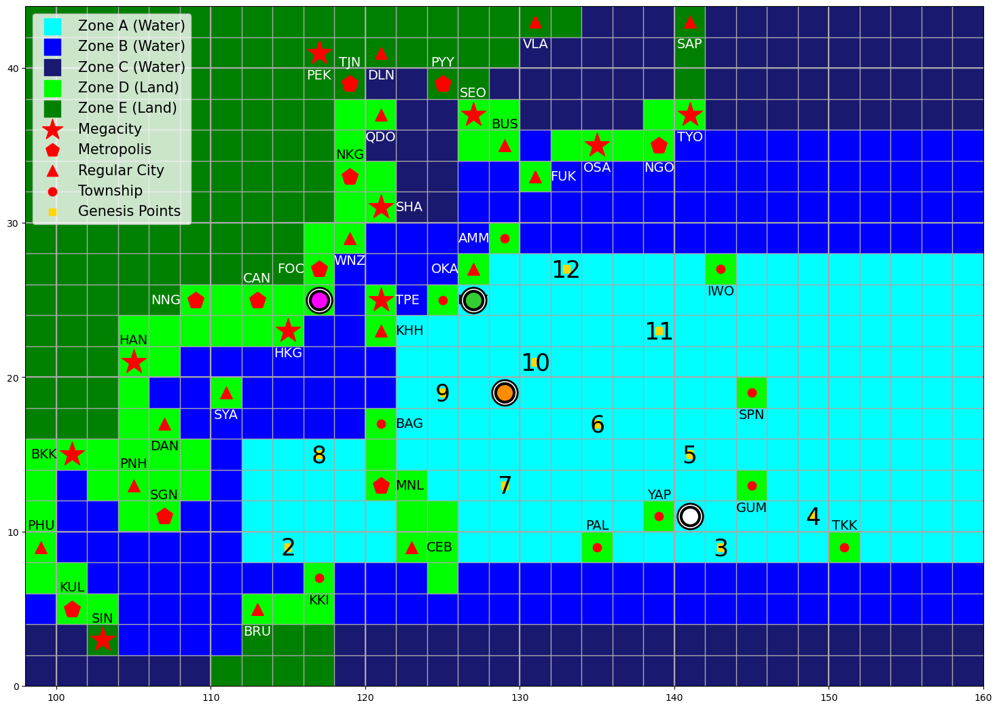

In [61]:
Run_Round(3, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 3: Jin's turn ---


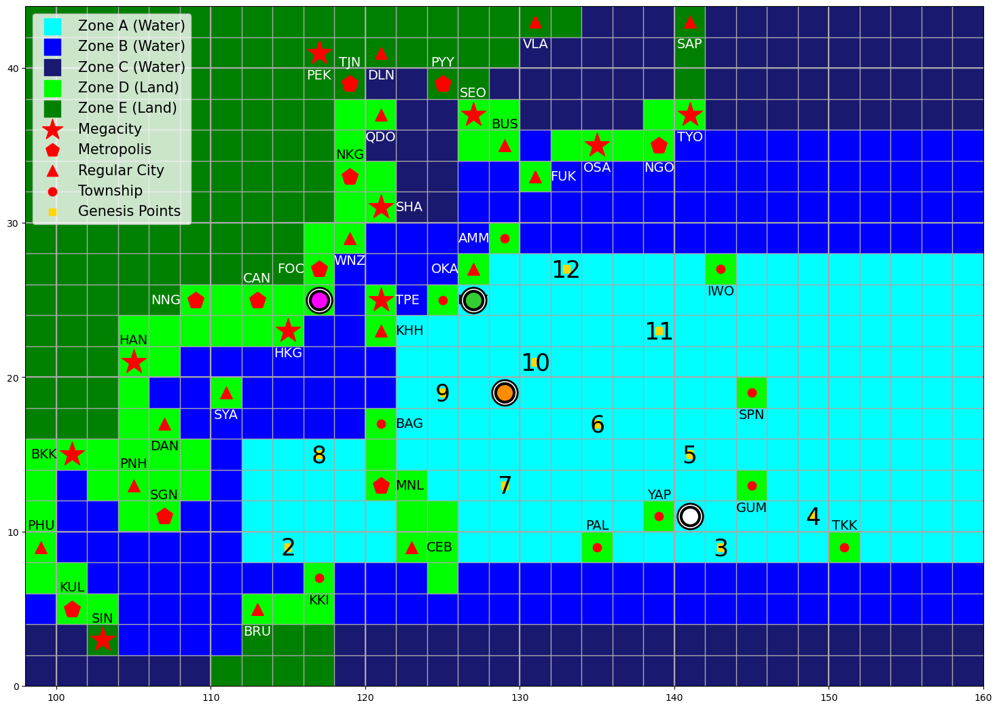

Intensity: 75 knots
ACE: 40 kJ
Landfall Costs: $0 M
Hand:
W/E 1
+5 W/m^2
Random Teleportation
Extra Time
E 1 S 1
Wrong Way Round

--- Round 3: Jin's draw phase ---
0: Movement Deck (51 cards left)
1: Intensity Deck (56 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jin drew: E 1 from Movement Deck.

0: Movement Deck (50 cards left)
1: Intensity Deck (56 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jin drew: +25 W/m^2 from Intensity Deck.


--- Round 3: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: W/E 1
1: +5 W/m^2
2: Random Teleportation
3: Extra Time
4: E 1 S 1
5: Wrong Way Round (cannot play)
6: E 1
7: +25 W/m^2


Choose a card by index to play:  7


Jin played: +25 W/m^2

Jin has intensified to 100 knots!

--- Round 3: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: W/E 1
1: +5 W/m^2
2: Random Teleportation
3: Extra Time
4: E 1 S 1
5: Wrong Way Round (cannot play)
6: E 1
Enter 'p' to pass.


Choose a card by index to play:  0


Jin played: W/E 1



Choose W or E:  W


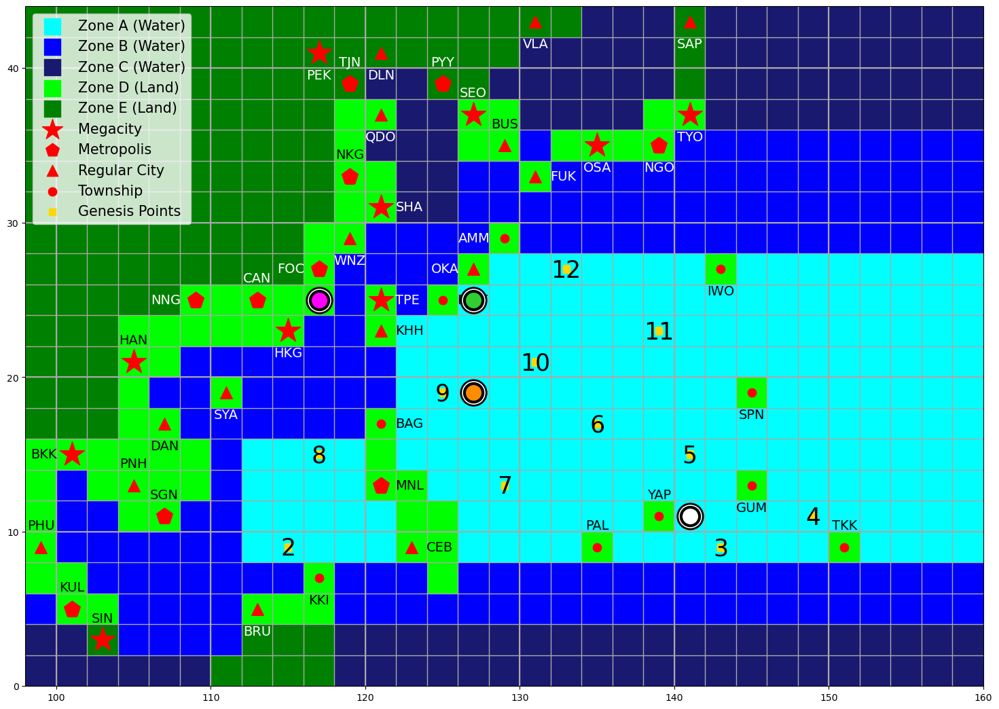


--- Round 3: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: +5 W/m^2
1: Random Teleportation
2: Extra Time
3: E 1 S 1
4: Wrong Way Round (cannot play)
5: E 1
Enter 'p' to pass.


Choose a card by index to play:  p


Jin passes.

--- End of Jin's turn ---
Jin's current intensity: 100 knots.
Jin has gained 50 kJ. Current ACE: 90 kJ.
The ocean has 720 kJ of energy remaining.


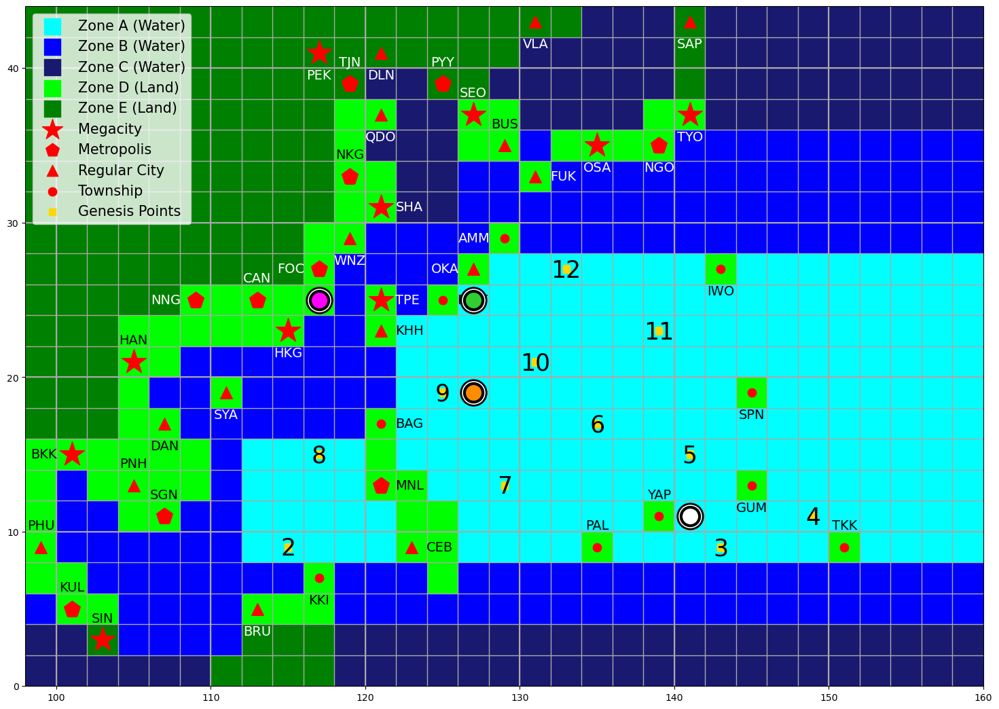

In [62]:
Run_Round(3, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 3: Jason's turn ---


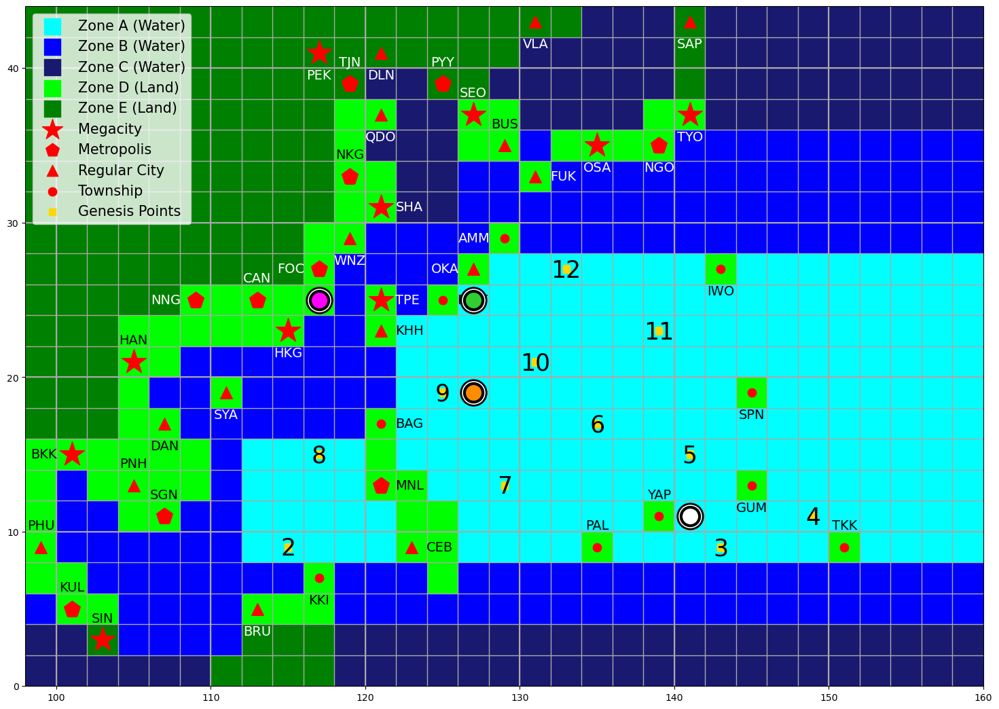

Intensity: 70 knots
ACE: 30 kJ
Landfall Costs: $0 M
Hand:
E 1
W/E/N/S 1
E 1
+5 W/m^2
Cyclone Express
Rapid Intensification

--- Round 3: Jason's draw phase ---
0: Movement Deck (50 cards left)
1: Intensity Deck (55 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: +15 W/m^2 from Intensity Deck.

0: Movement Deck (50 cards left)
1: Intensity Deck (54 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: +20 W/m^2 from Intensity Deck.


--- Round 3: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: Cyclone Express (cannot play)
5: Rapid Intensification (cannot play)
6: +15 W/m^2
7: +20 W/m^2


Choose a card by index to play:  7


Jason played: +20 W/m^2

Jason has intensified to 90 knots!

--- Round 3: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: Cyclone Express (cannot play)
5: Rapid Intensification
6: +15 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  5


Jason played: Rapid Intensification

Jason has intensified to 105 knots!

--- Round 3: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: Cyclone Express (cannot play)
5: +15 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  5


Jason played: +15 W/m^2

Jason has intensified to 110 knots!

--- End of Jason's turn ---
Jason's current intensity: 110 knots.
Jason has gained 50 kJ. Current ACE: 80 kJ.
The ocean has 670 kJ of energy remaining.


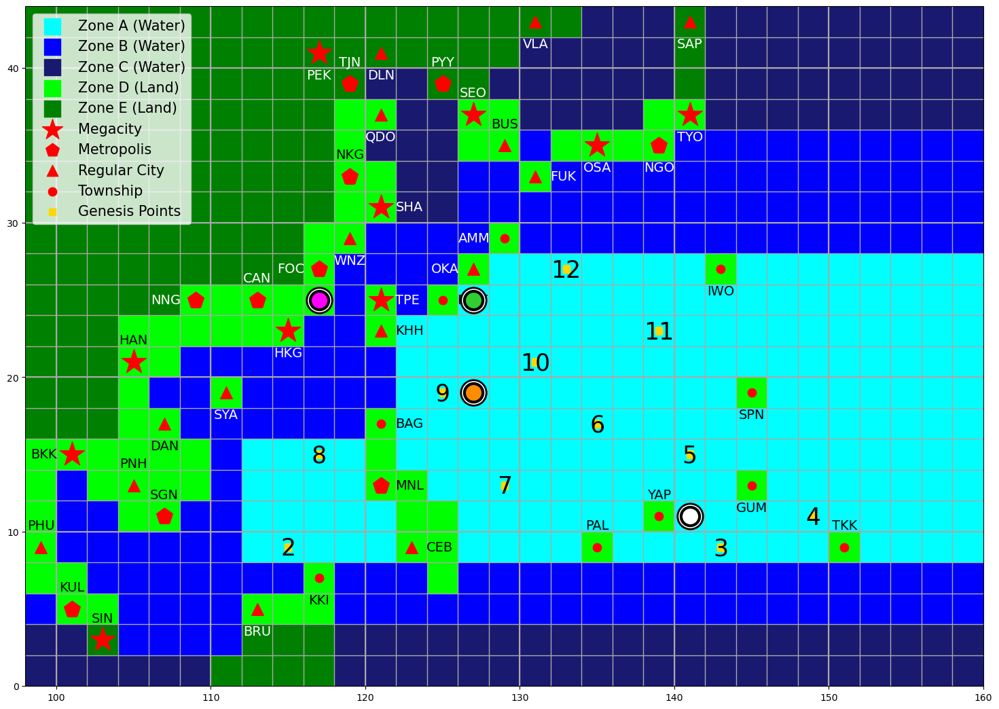

In [63]:
Run_Round(3, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 4: Demi's turn ---


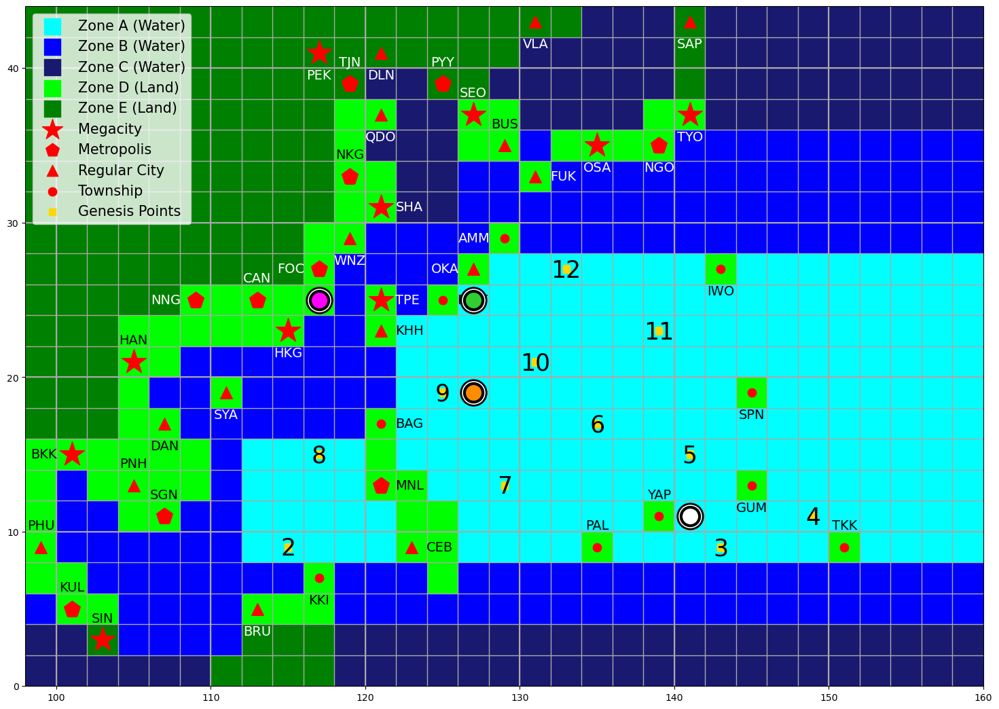

Intensity: 65 knots
ACE: 60 kJ
Landfall Costs: $455 M
Hand:
W 1 S 1
+5 W/m^2
City Fortress
+5 W/m^2
S ?

--- Round 4: Demi's draw phase ---
0: Movement Deck (50 cards left)
1: Intensity Deck (53 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Demi drew: W 1 from Movement Deck.

0: Movement Deck (49 cards left)
1: Intensity Deck (53 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Demi drew: E 1 N 2 from Movement Deck.


--- Round 4: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: W 1 S 1
1: +5 W/m^2 (cannot play)
2: City Fortress
3: +5 W/m^2 (cannot play)
4: S ?
5: W 1
6: E 1 N 2


Choose a card by index to play:  6


Demi played: E 1 N 2



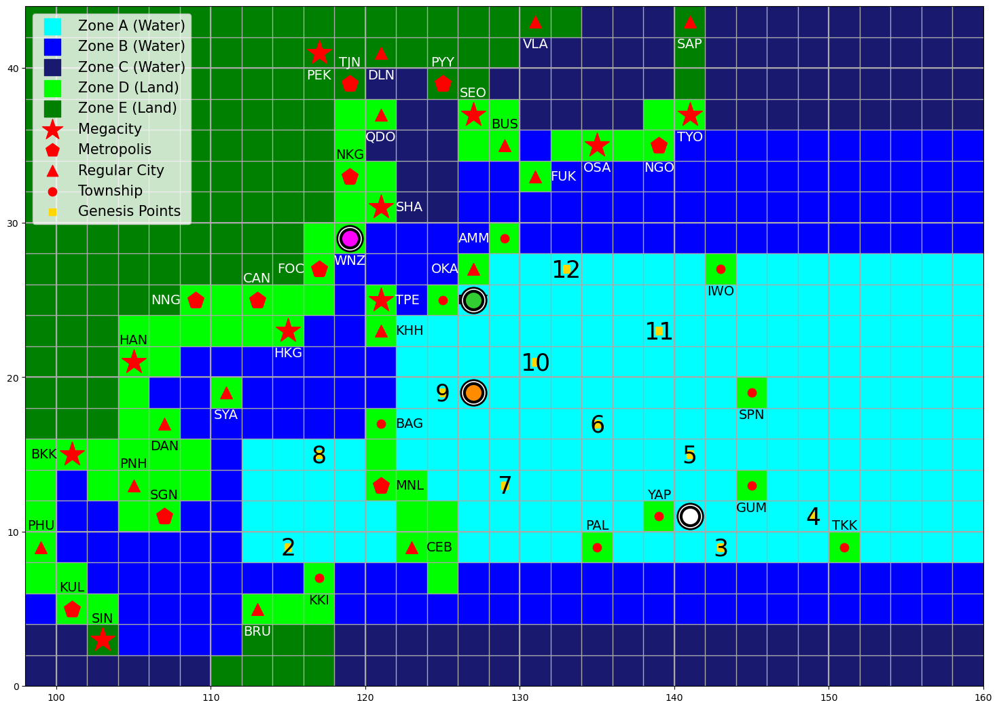

Demi has made landfall at WNZ (Wenzhou) and gains $130M!
Remaining budget of WNZ (Wenzhou): $270M

--- Round 4: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: W 1 S 1
1: +5 W/m^2 (cannot play)
2: City Fortress
3: +5 W/m^2 (cannot play)
4: S ?
5: W 1
Enter 'p' to pass.


Choose a card by index to play:  0


Demi played: W 1 S 1



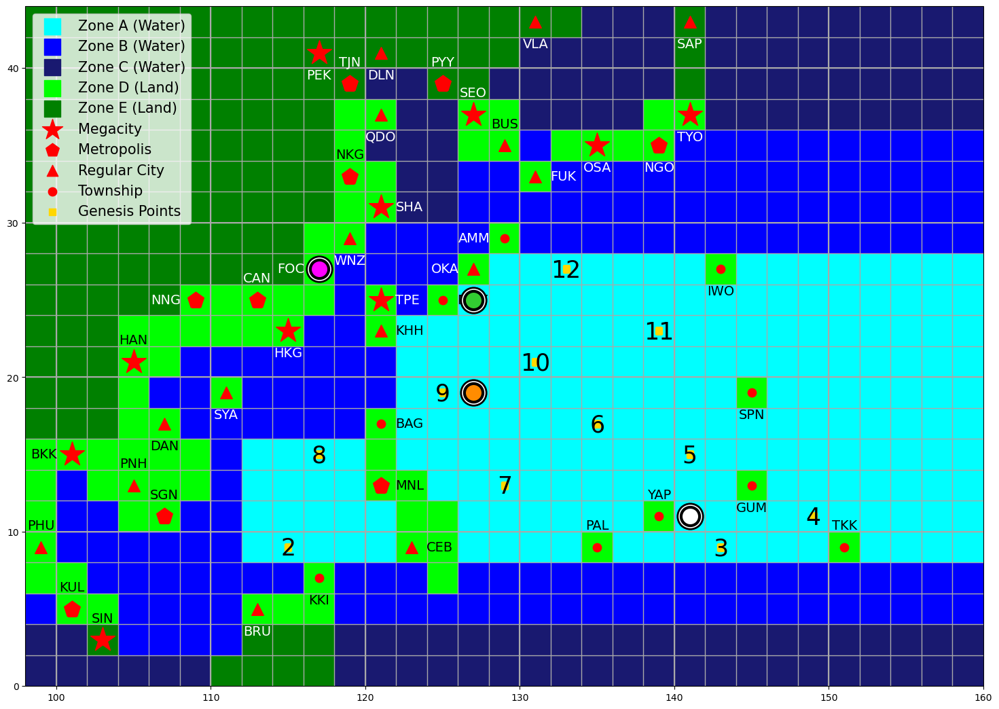

Demi has made landfall at FOC (Fuzhou) and gains $195M!
Remaining budget of FOC (Fuzhou): $555M

--- Round 4: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: +5 W/m^2 (cannot play)
1: City Fortress
2: +5 W/m^2 (cannot play)
3: S ?
4: W 1
Enter 'p' to pass.


Choose a card by index to play:  3


Demi played: S ?

Demi rolled 5: S 5


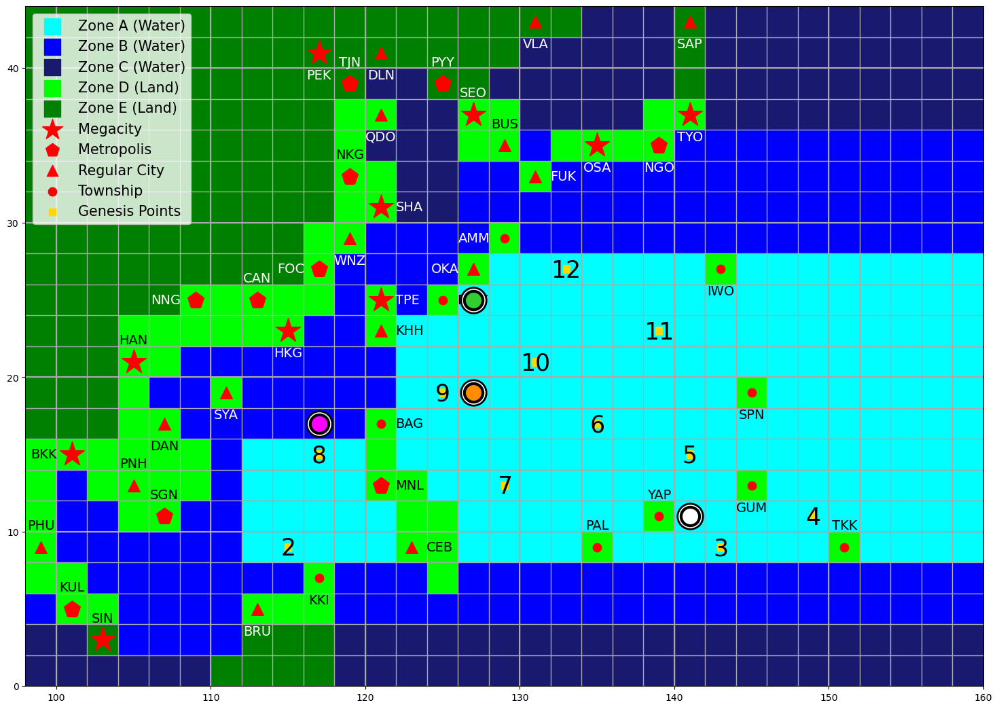


--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 80 kJ.
Demi's landfall costs: 780.
The ocean has 650 kJ of energy remaining.


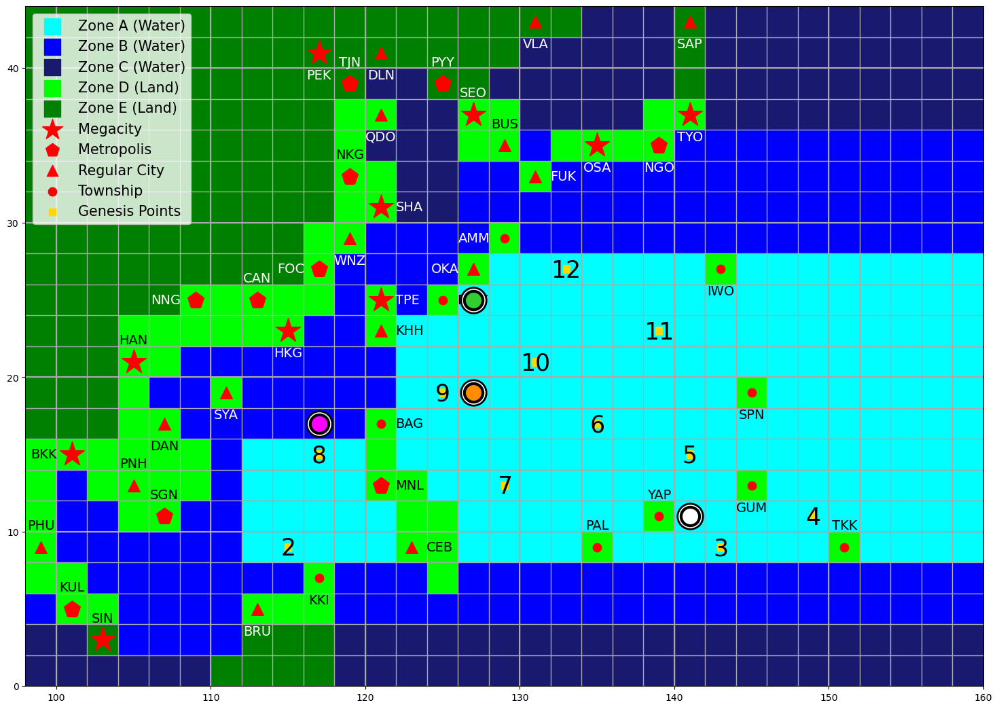

In [65]:
Run_Round(4, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 4: Kinen's turn ---


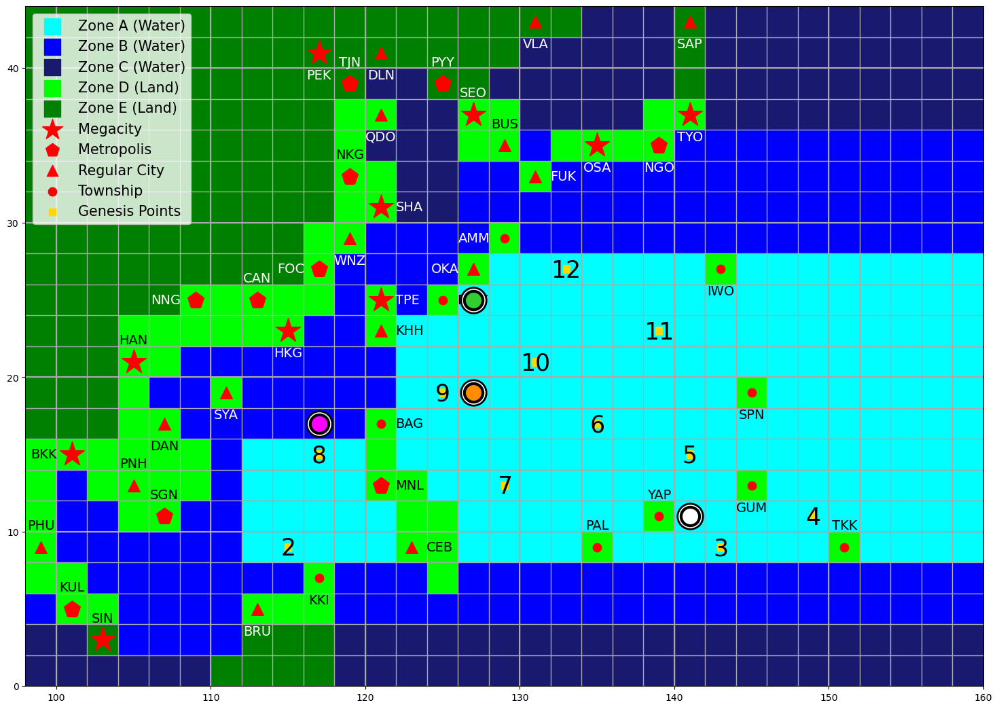

Intensity: 95 knots
ACE: 100 kJ
Landfall Costs: $965 M
Hand:
E 1 N 1
+20 W/m^2
Factory Reset
E 2 S 1
W 1 N 1

--- Round 4: Kinen's draw phase ---
0: Movement Deck (48 cards left)
1: Intensity Deck (53 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Kinen drew: +10 W/m^2 from Intensity Deck.

0: Movement Deck (48 cards left)
1: Intensity Deck (52 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Kinen drew: S 1 from Movement Deck.


--- Round 4: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1 N 1
1: +20 W/m^2
2: Factory Reset
3: E 2 S 1
4: W 1 N 1
5: +10 W/m^2
6: S 1


Choose a card by index to play:  1


Kinen played: +20 W/m^2

Kinen has intensified to 105 knots!

--- Round 4: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1 N 1
1: Factory Reset
2: E 2 S 1
3: W 1 N 1
4: +10 W/m^2
5: S 1
Enter 'p' to pass.


Choose a card by index to play:  4


Kinen played: +10 W/m^2

Kinen has intensified to 110 knots!

--- Round 4: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1 N 1
1: Factory Reset
2: E 2 S 1
3: W 1 N 1
4: S 1
Enter 'p' to pass.


Choose a card by index to play:  0


Kinen played: E 1 N 1



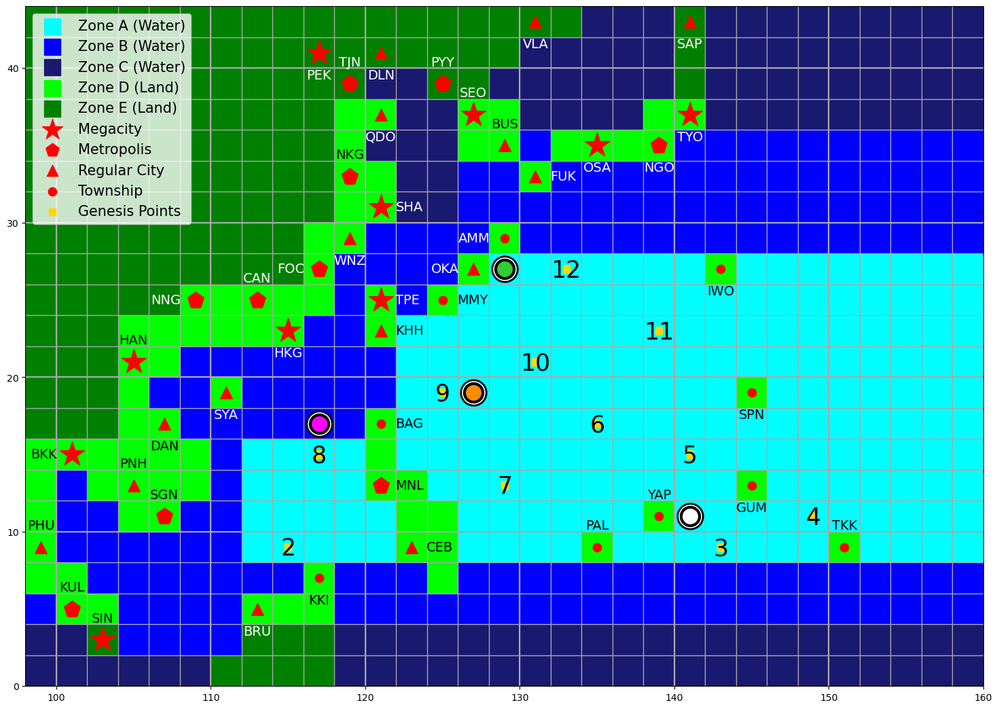


--- End of Kinen's turn ---
Kinen's current intensity: 110 knots.
Kinen has gained 50 kJ. Current ACE: 150 kJ.
Kinen's landfall costs: $965M.
The ocean has 600 kJ of energy remaining.


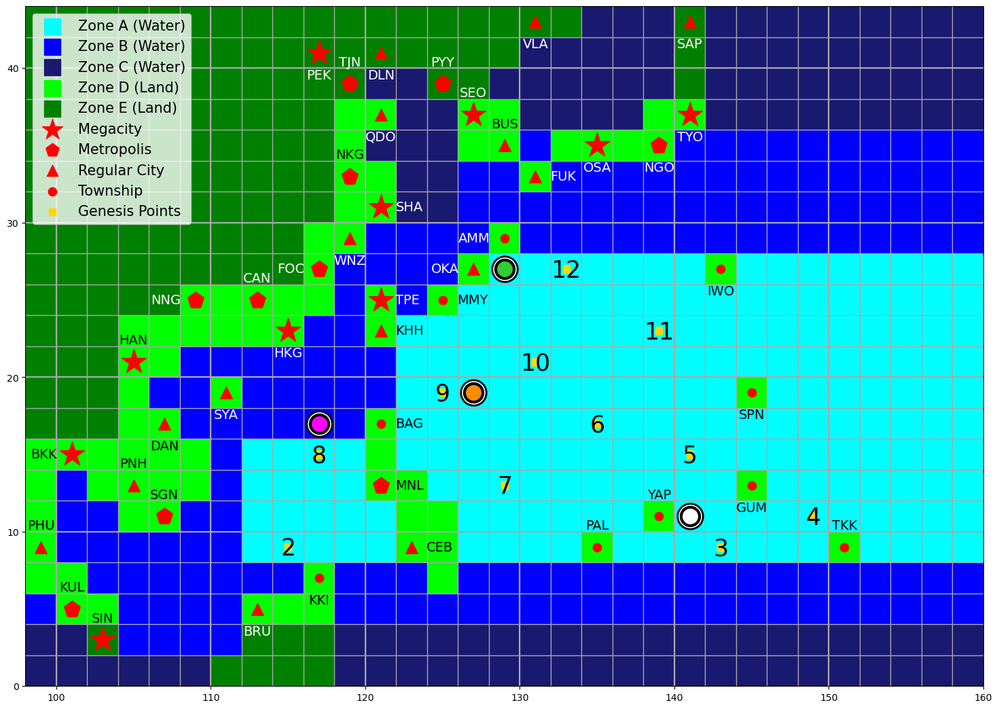

In [67]:
Run_Round(4, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 4: Jin's turn ---


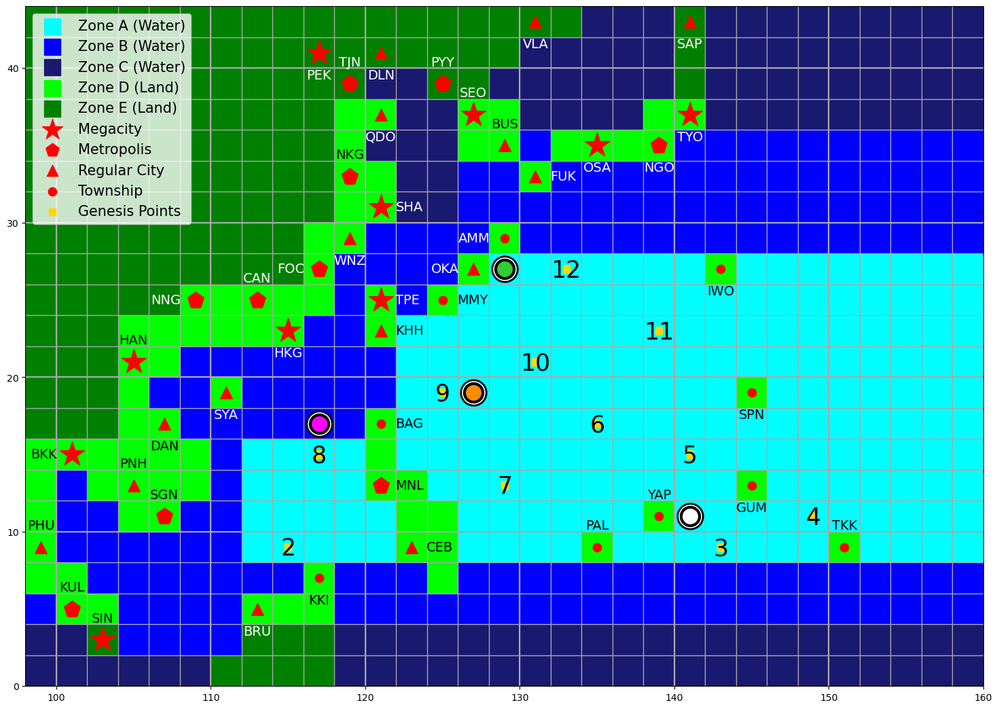

Intensity: 100 knots
ACE: 90 kJ
Landfall Costs: $0 M
Hand:
+5 W/m^2
Random Teleportation
Extra Time
E 1 S 1
Wrong Way Round
E 1

--- Round 4: Jin's draw phase ---
0: Movement Deck (47 cards left)
1: Intensity Deck (52 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jin drew: W/E 1 from Movement Deck.

0: Movement Deck (46 cards left)
1: Intensity Deck (52 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jin drew: W 1 from Movement Deck.


--- Round 4: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: +5 W/m^2
1: Random Teleportation
2: Extra Time
3: E 1 S 1
4: Wrong Way Round (cannot play)
5: E 1
6: W/E 1
7: W 1


Choose a card by index to play:  7


Jin played: W 1



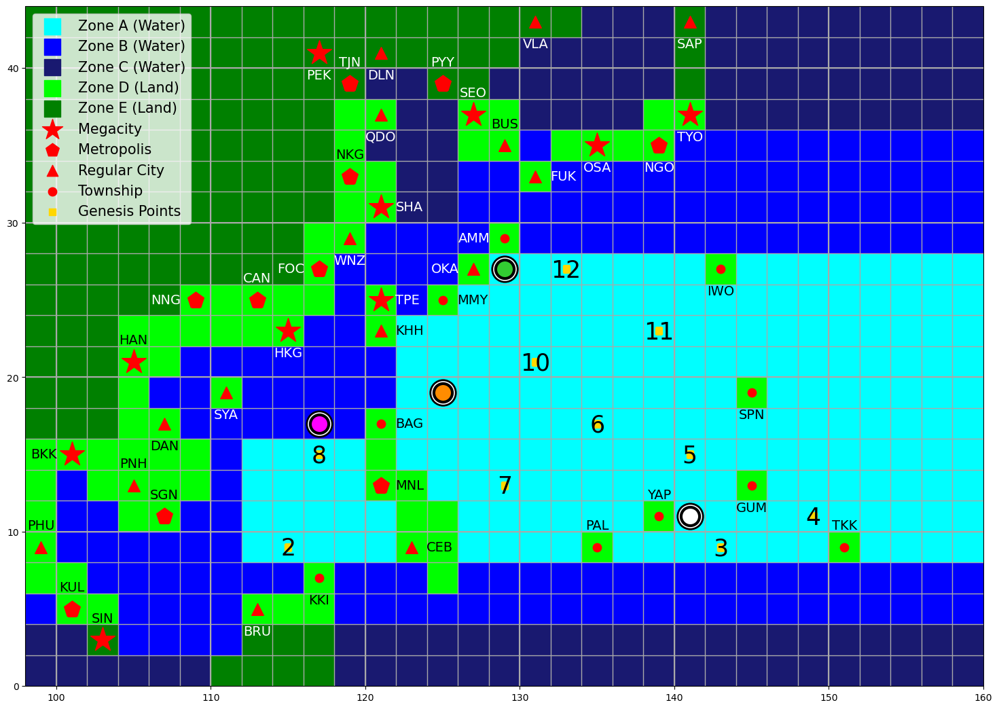


--- Round 4: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: +5 W/m^2
1: Random Teleportation
2: Extra Time
3: E 1 S 1
4: Wrong Way Round
5: E 1
6: W/E 1
Enter 'p' to pass.


Choose a card by index to play:  6


Jin played: W/E 1



Choose W or E:  W


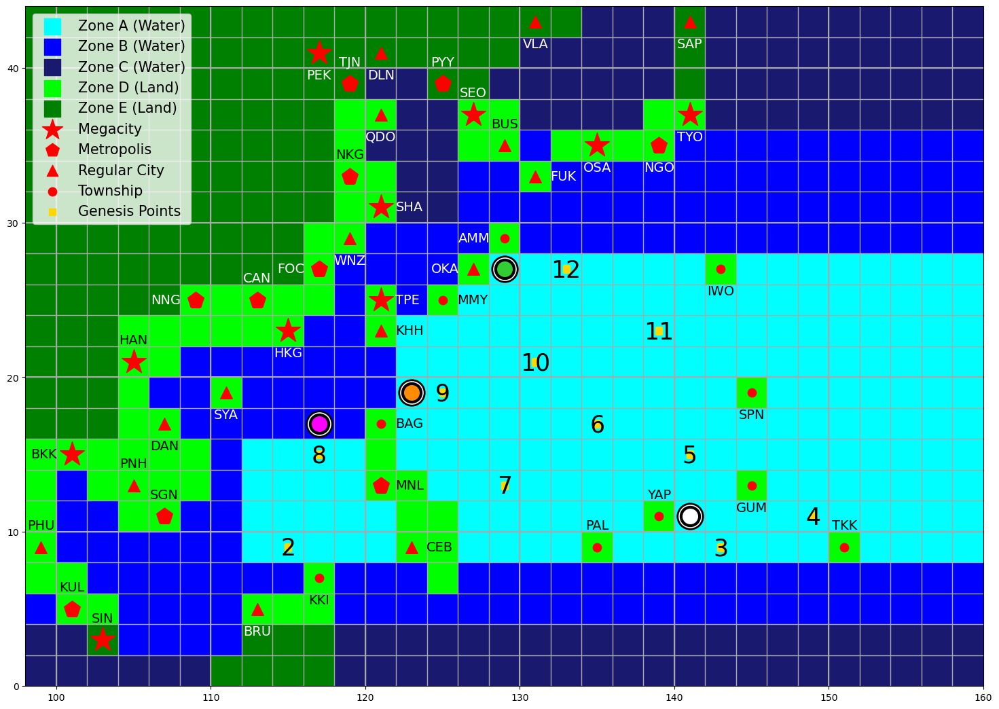


--- Round 4: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: +5 W/m^2
1: Random Teleportation
2: Extra Time
3: E 1 S 1
4: Wrong Way Round (cannot play)
5: E 1
Enter 'p' to pass.


Choose a card by index to play:  0


Jin played: +5 W/m^2

Jin remains at 100 knots.

--- End of Jin's turn ---
Jin's current intensity: 100 knots.
Jin has gained 50 kJ. Current ACE: 140 kJ.
Jin's landfall costs: $0M.
The ocean has 550 kJ of energy remaining.


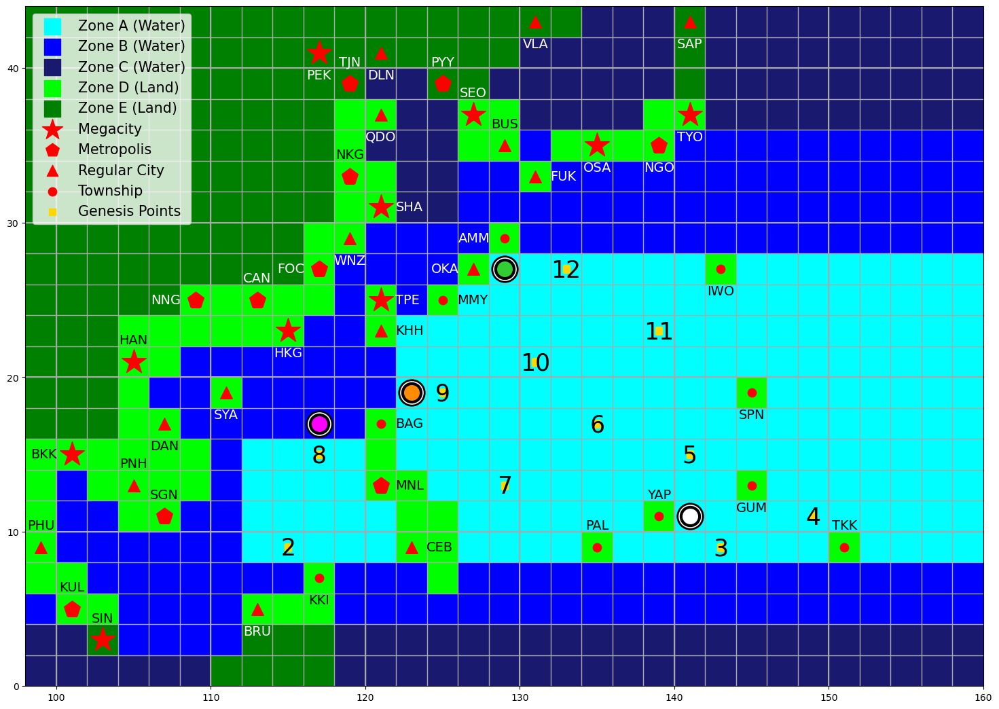

In [68]:
Run_Round(4, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 4: Jason's turn ---


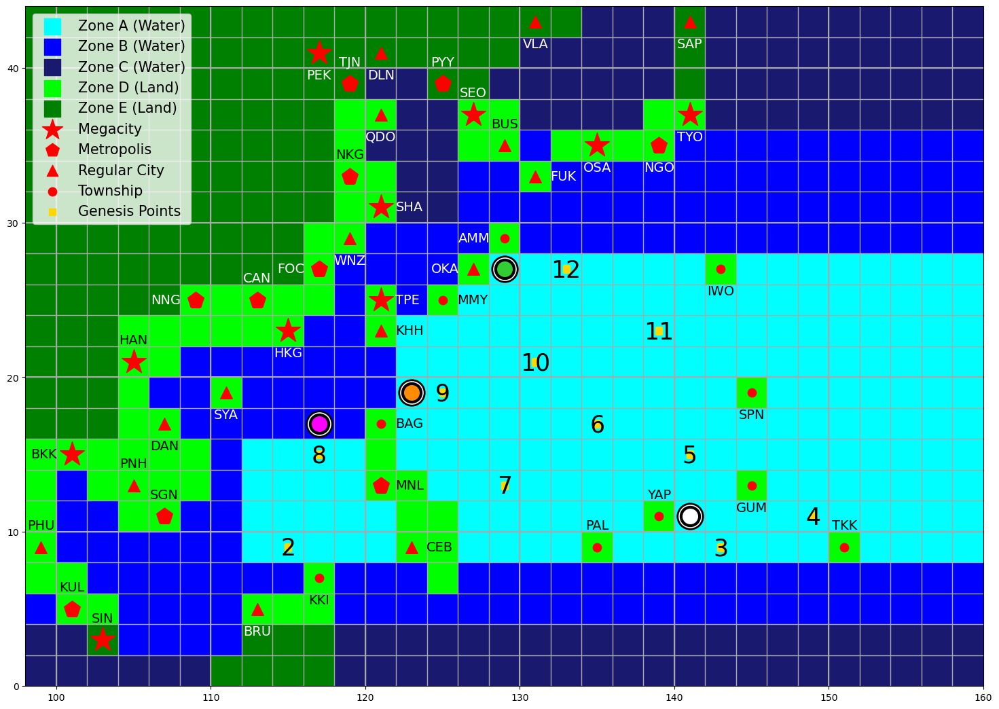

Intensity: 110 knots
ACE: 80 kJ
Landfall Costs: $0 M
Hand:
E 1
W/E/N/S 1
E 1
+5 W/m^2
Cyclone Express

--- Round 4: Jason's draw phase ---
0: Movement Deck (45 cards left)
1: Intensity Deck (52 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: +5 W/m^2 from Intensity Deck.

0: Movement Deck (45 cards left)
1: Intensity Deck (51 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Jason drew: + ? W/m^2 from Intensity Deck.


--- Round 4: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: Cyclone Express (cannot play)
5: +5 W/m^2
6: + ? W/m^2


Choose a card by index to play:  6


Jason played: + ? W/m^2

Jason rolled 3: + 15 W/m^2
Jason has intensified to 115 knots!

--- Round 4: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: +5 W/m^2
4: Cyclone Express (cannot play)
5: +5 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  3


Jason played: +5 W/m^2

Jason has intensified to 120 knots!

--- Round 4: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: Cyclone Express (cannot play)
4: +5 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  4


Jason played: +5 W/m^2

Jason remains at 120 knots.

--- End of Jason's turn ---
Jason's current intensity: 120 knots.
Jason has gained 70 kJ. Current ACE: 150 kJ.
Jason's landfall costs: $0M.
The ocean has 480 kJ of energy remaining.


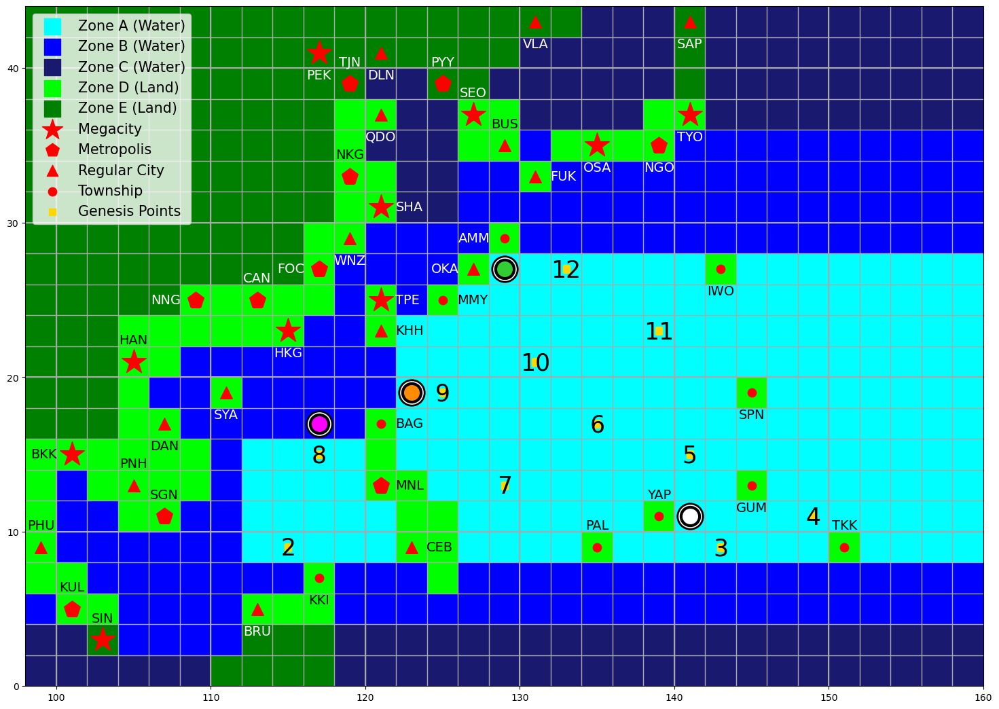

In [69]:
Run_Round(4, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 5: Demi's turn ---


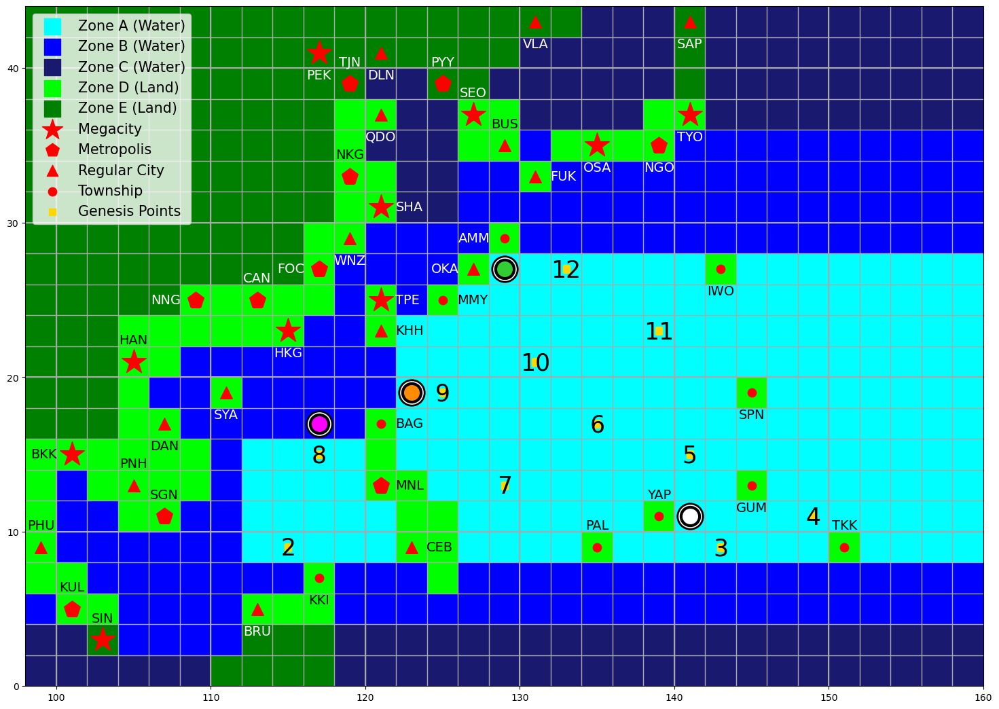

Intensity: 65 knots
ACE: 80 kJ
Landfall Costs: $780 M
Hand:
+5 W/m^2
City Fortress
+5 W/m^2
W 1

--- Round 5: Demi's draw phase ---
0: Movement Deck (45 cards left)
1: Intensity Deck (50 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Demi drew: +5 W/m^2 from Intensity Deck.

0: Movement Deck (45 cards left)
1: Intensity Deck (49 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Demi drew: W 1 N 2 from Movement Deck.


--- Round 5: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: +5 W/m^2
1: City Fortress
2: +5 W/m^2
3: W 1
4: +5 W/m^2
5: W 1 N 2


Choose a card by index to play:  0


Demi played: +5 W/m^2

Demi remains at 65 knots.

--- Round 5: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: City Fortress
1: +5 W/m^2
2: W 1
3: +5 W/m^2
4: W 1 N 2
Enter 'p' to pass.


Choose a card by index to play:  2


Demi played: W 1



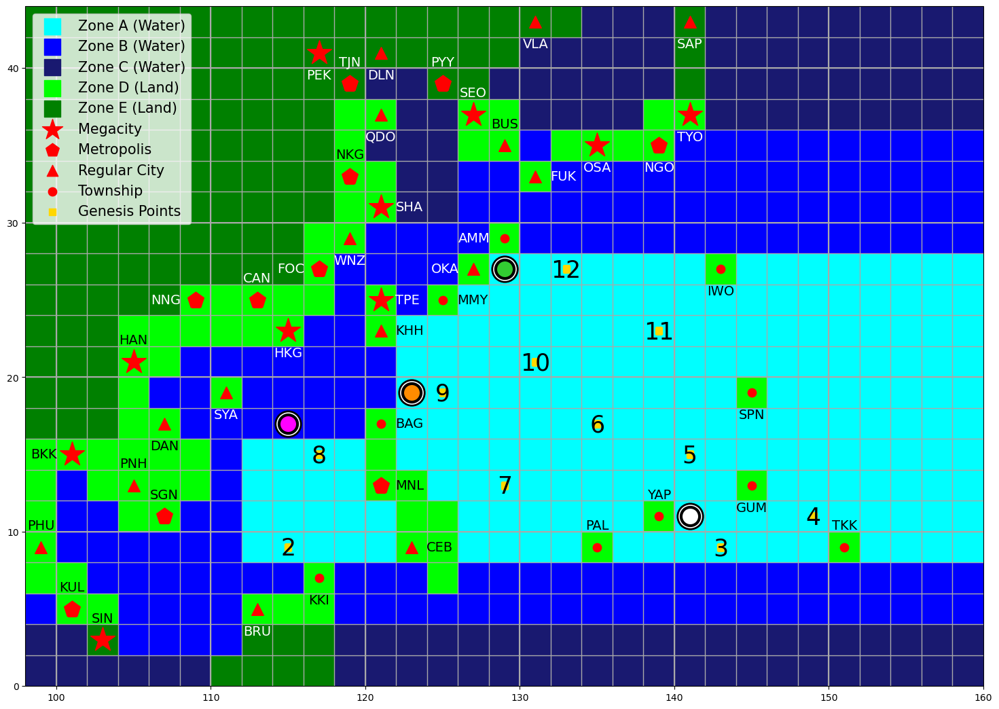


--- Round 5: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: City Fortress
1: +5 W/m^2
2: +5 W/m^2
3: W 1 N 2
Enter 'p' to pass.


Choose a card by index to play:  3


Demi played: W 1 N 2



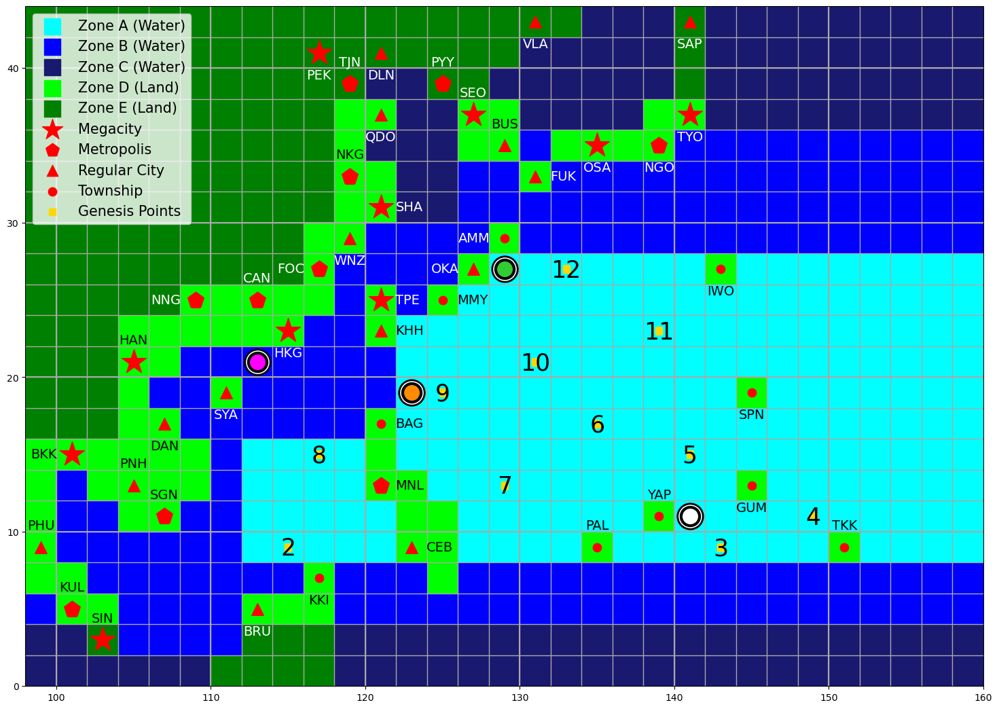


--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 100 kJ.
Demi's landfall costs: $780M.
The ocean has 460 kJ of energy remaining.


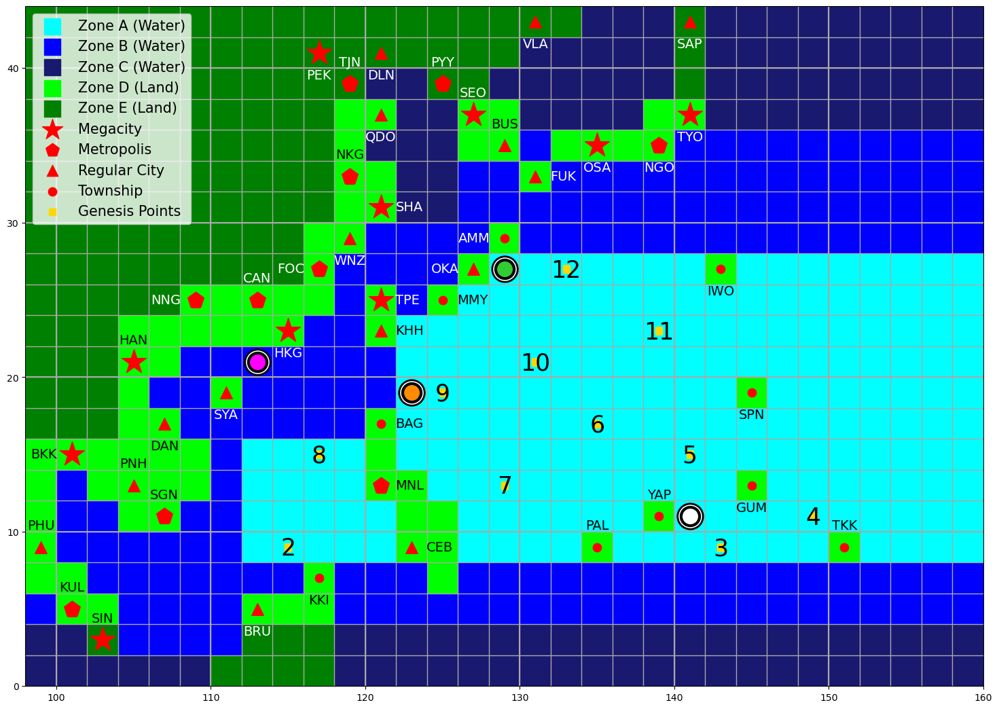

In [70]:
Run_Round(5, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 5: Kinen's turn ---


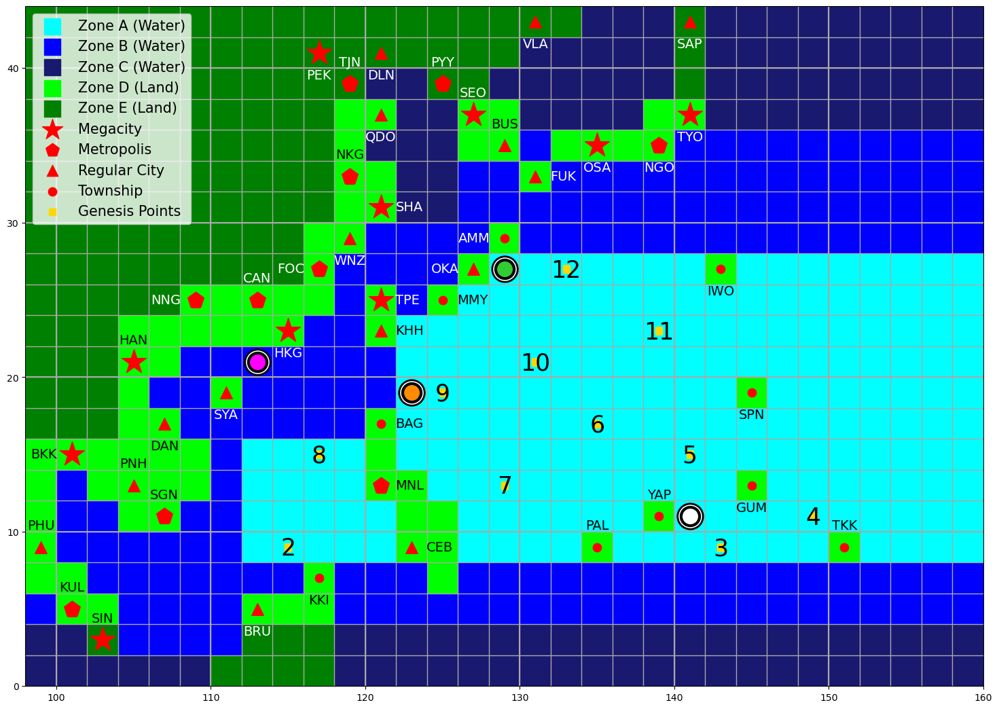

Intensity: 110 knots
ACE: 150 kJ
Landfall Costs: $965 M
Hand:
Factory Reset
E 2 S 1
W 1 N 1
S 1

--- Round 5: Kinen's draw phase ---
0: Movement Deck (44 cards left)
1: Intensity Deck (49 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 1


Kinen drew: +10 W/m^2 from Intensity Deck.

0: Movement Deck (44 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Kinen drew: S 3 from Movement Deck.


--- Round 5: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Factory Reset
1: E 2 S 1
2: W 1 N 1
3: S 1
4: +10 W/m^2
5: S 3


Choose a card by index to play:  4


Kinen played: +10 W/m^2

Kinen has intensified to 115 knots!

--- Round 5: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: Factory Reset
1: E 2 S 1
2: W 1 N 1
3: S 1
4: S 3
Enter 'p' to pass.


Choose a card by index to play:  2


Kinen played: W 1 N 1



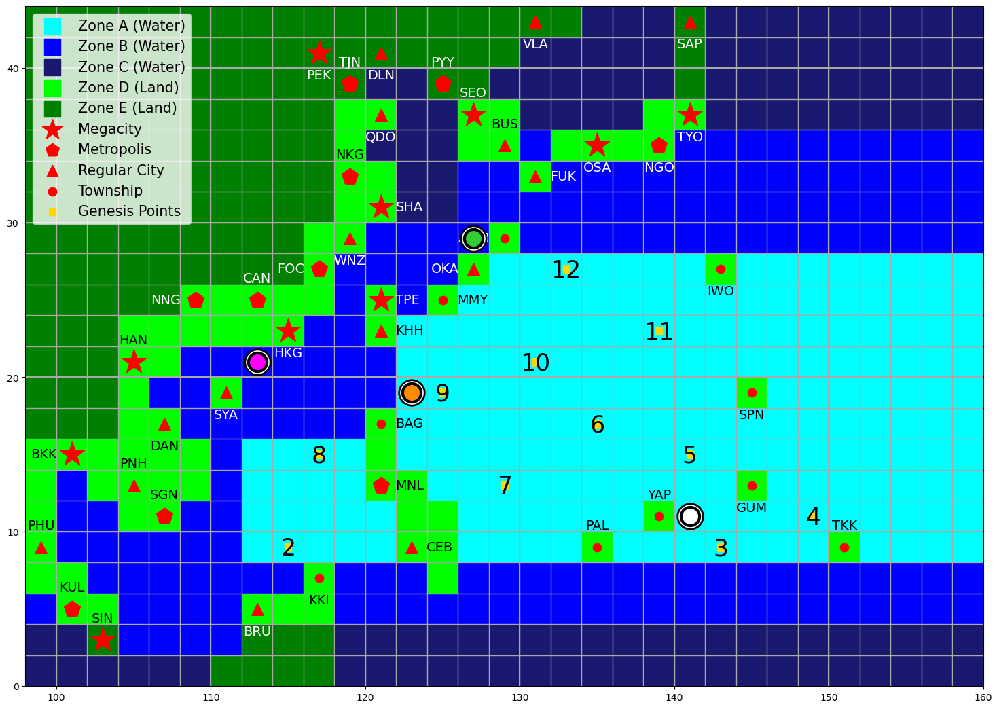


--- Round 5: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: Factory Reset
1: E 2 S 1
2: S 1
3: S 3
Enter 'p' to pass.


Choose a card by index to play:  p


Kinen passes.

--- End of Kinen's turn ---
Kinen's current intensity: 115 knots.
Kinen has gained 50 kJ. Current ACE: 200 kJ.
Kinen's landfall costs: $965M.
The ocean has 410 kJ of energy remaining.


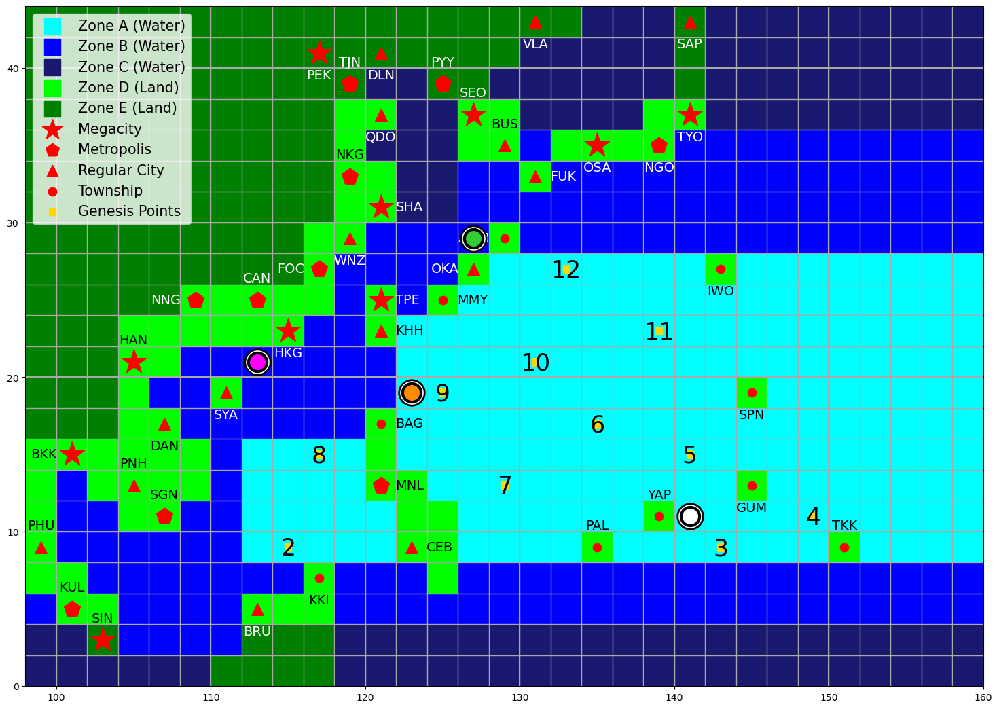

In [71]:
Run_Round(5, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 5: Jin's turn ---


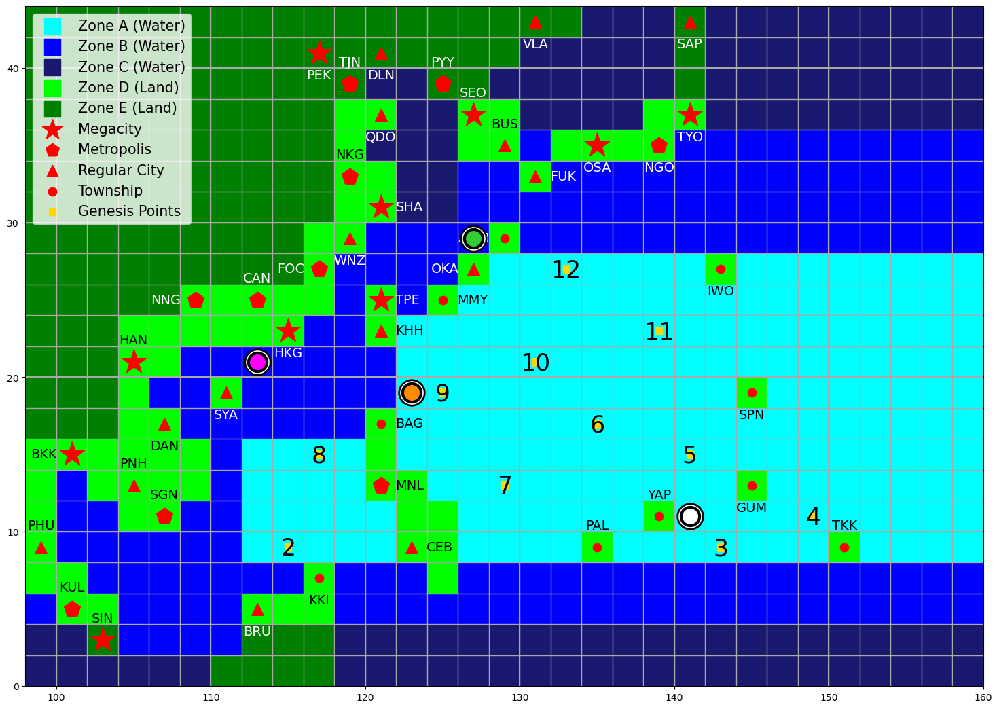

Intensity: 100 knots
ACE: 140 kJ
Landfall Costs: $0 M
Hand:
Random Teleportation
Extra Time
E 1 S 1
Wrong Way Round
E 1

--- Round 5: Jin's draw phase ---
0: Movement Deck (43 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jin drew: N 2 from Movement Deck.

0: Movement Deck (42 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jin drew: N 3 from Movement Deck.


--- Round 5: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: Wrong Way Round (cannot play)
4: E 1
5: N 2
6: N 3


Choose a card by index to play:  4


Jin played: E 1



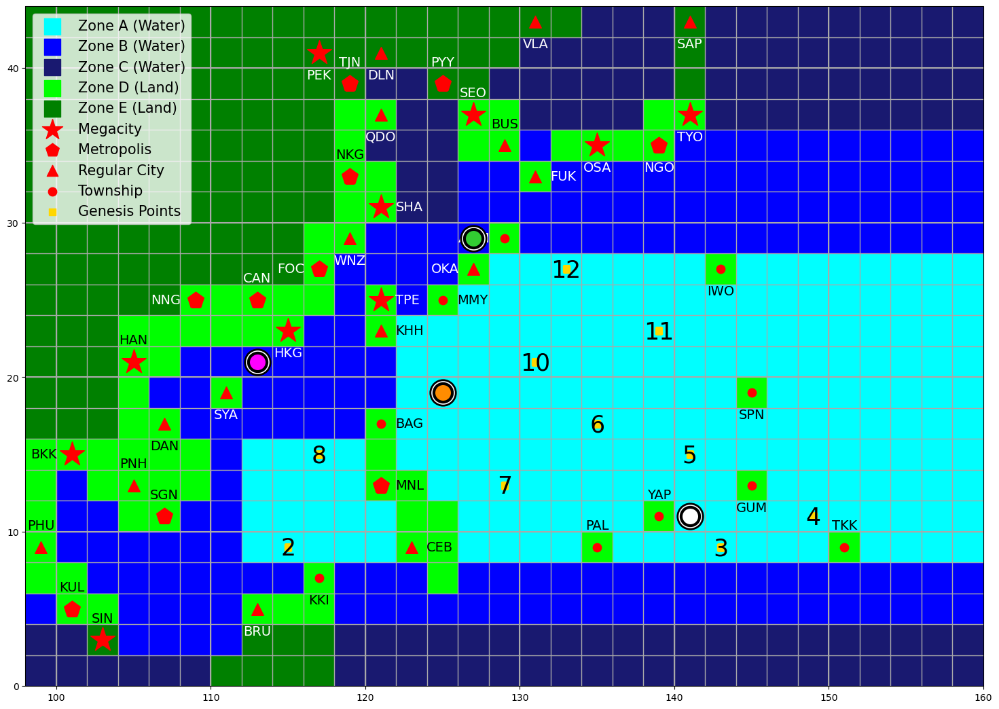


--- Round 5: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: Wrong Way Round
4: N 2
5: N 3
Enter 'p' to pass.


Choose a card by index to play:  3


Jin played: Wrong Way Round



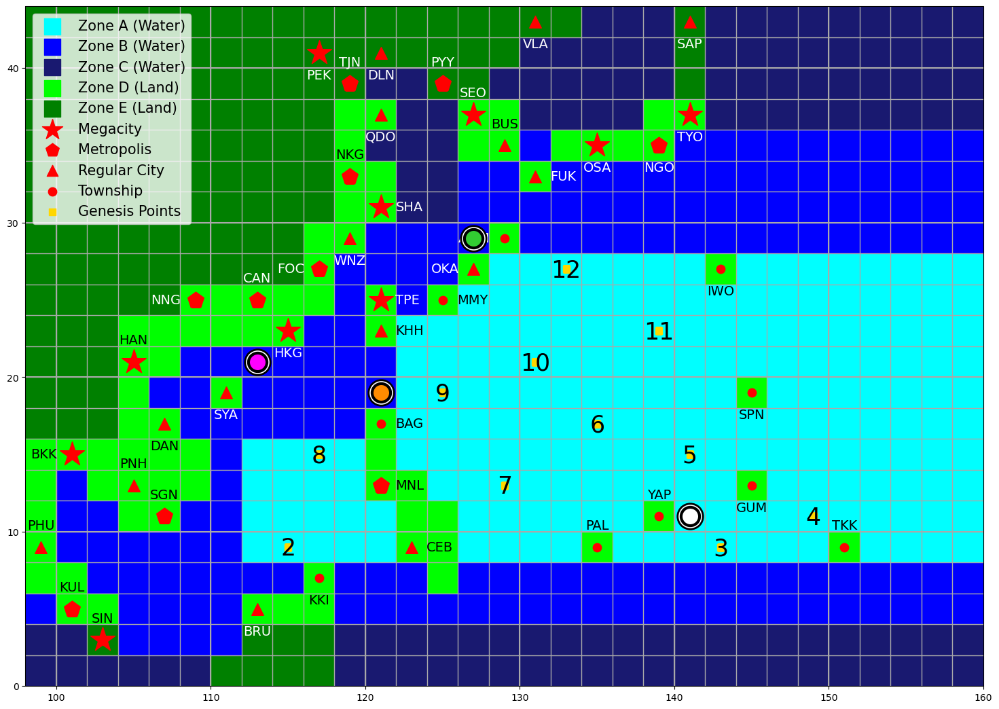

Jin has made landfall at HKG (Hong Kong) and gains $500M!
Remaining budget of HKG (Hong Kong): $675M

--- Round 5: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: N 2
4: N 3
Enter 'p' to pass.


Choose a card by index to play:  4


Jin played: N 3



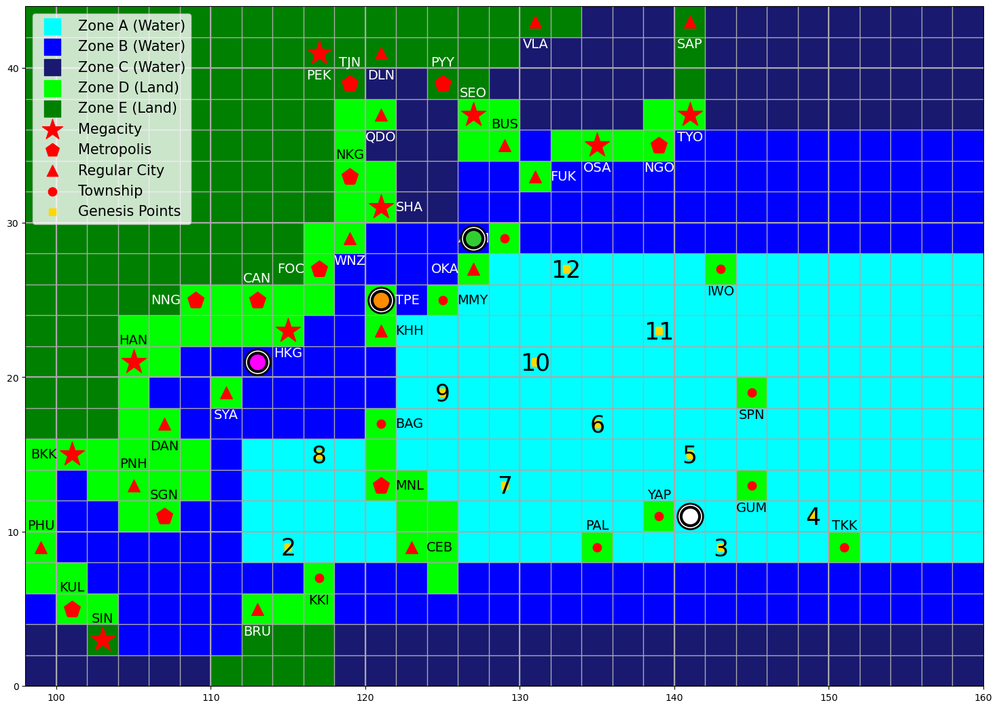

Jin has made landfall at TPE (Taipei) and gains $500M!
Remaining budget of TPE (Taipei): $525M

--- End of Jin's turn ---
Jin's current intensity: 100 knots.
Jin has gained 50 kJ. Current ACE: 190 kJ.
Jin's landfall costs: $1000M.
The ocean has 360 kJ of energy remaining.
Jin has weakened to 95 knots.


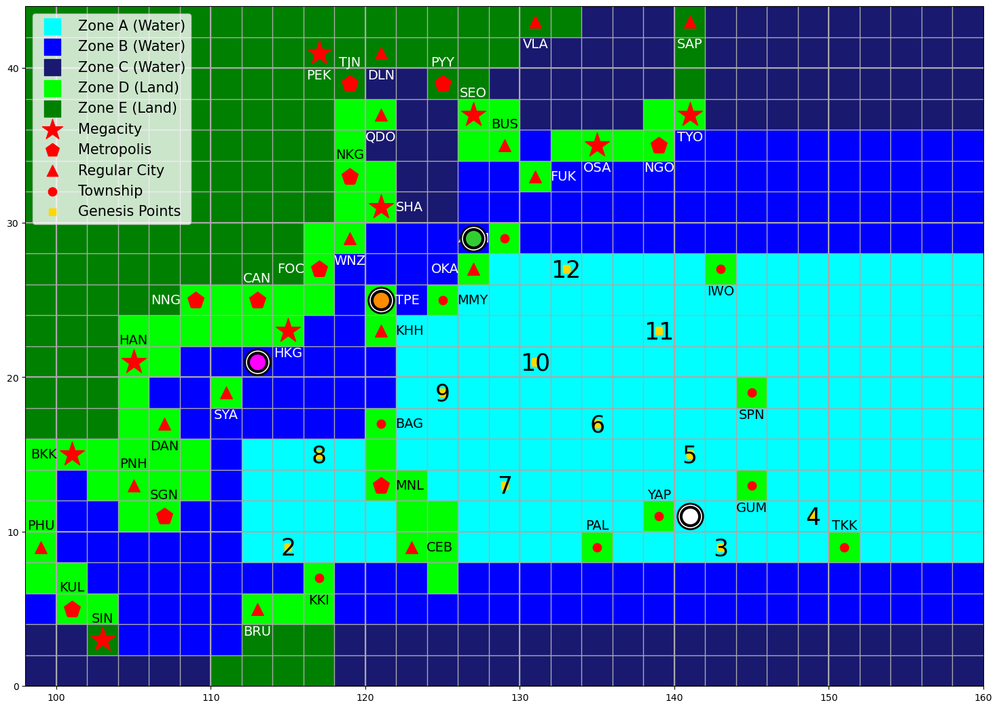

In [72]:
Run_Round(5, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 5: Jason's turn ---


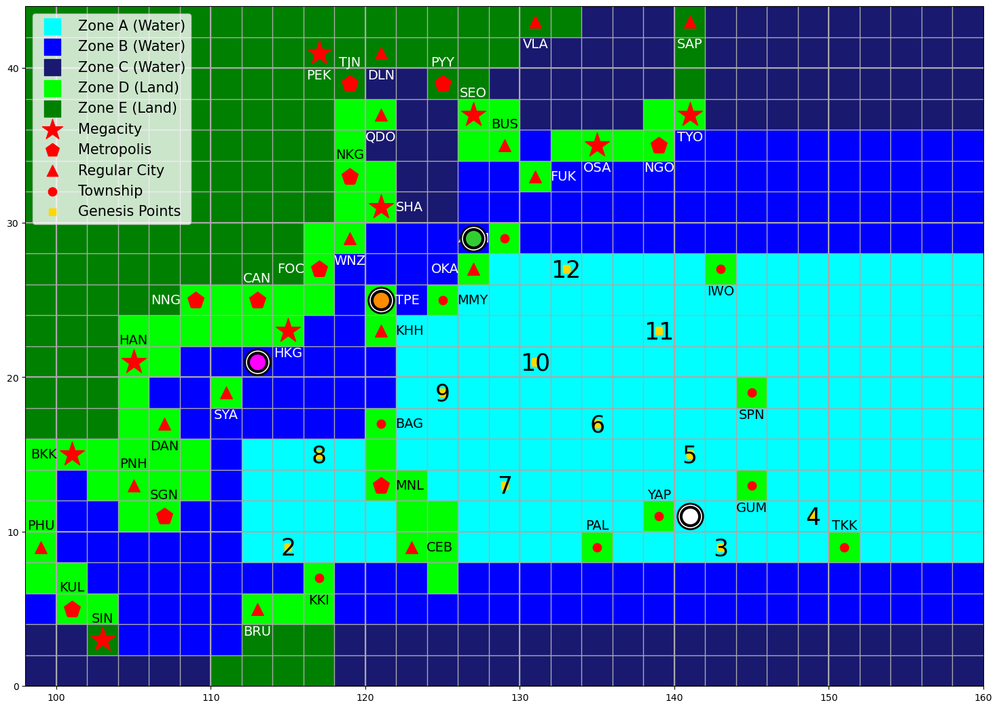

Intensity: 120 knots
ACE: 150 kJ
Landfall Costs: $0 M
Hand:
E 1
W/E/N/S 1
E 1
Cyclone Express

--- Round 5: Jason's draw phase ---
0: Movement Deck (41 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jason drew: S 2 from Movement Deck.

0: Movement Deck (40 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Jason drew: E 2 N 1 from Movement Deck.


--- Round 5: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: W/E/N/S 1
2: E 1
3: Cyclone Express (cannot play)
4: S 2
5: E 2 N 1


Choose a card by index to play:  1


Jason played: W/E/N/S 1



Choose W, E, N or S:  W


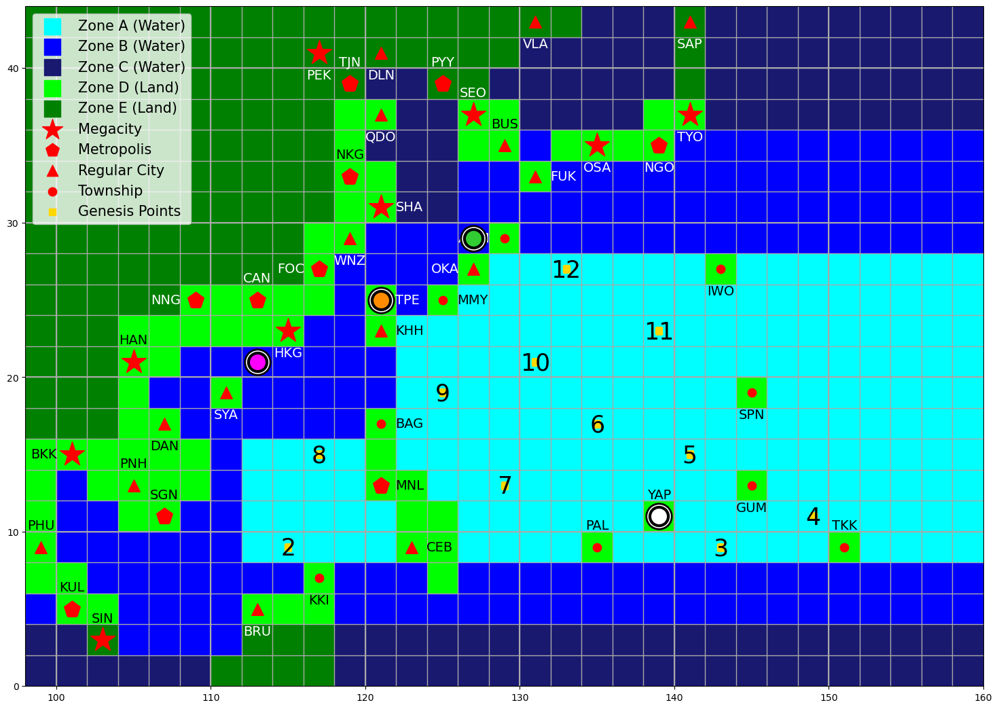

Jason has made landfall at YAP (Yap) and gains $100M!
Remaining budget of YAP (Yap): $0M

--- Round 5: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: E 1
2: Cyclone Express
3: S 2
4: E 2 N 1
Enter 'p' to pass.


Choose a card by index to play:  0


Jason played: E 1



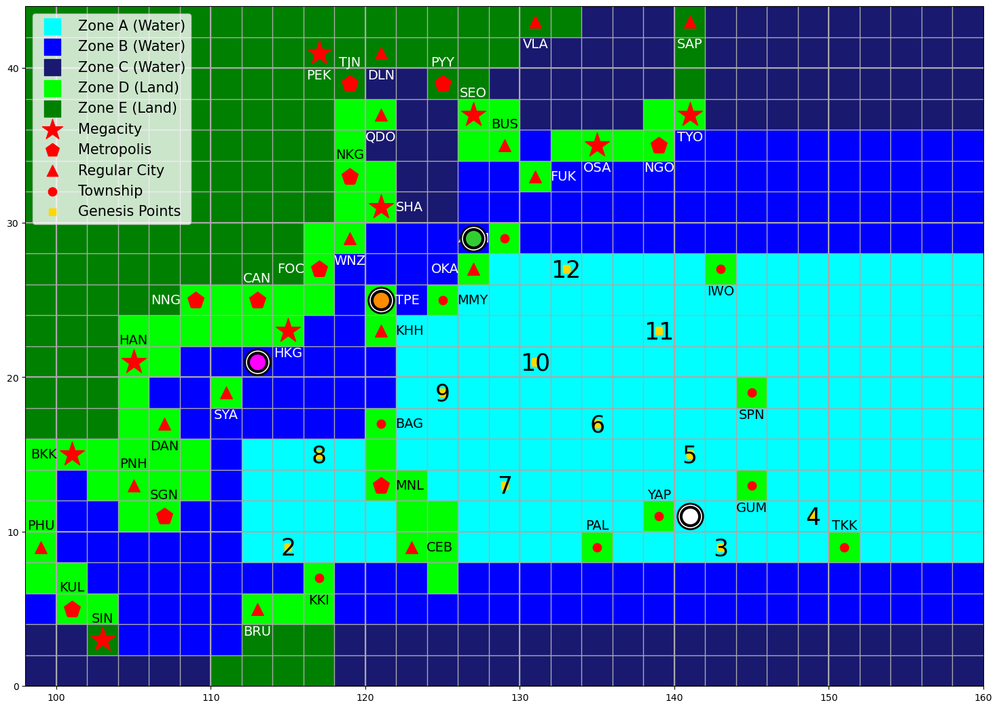


--- Round 5: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: Cyclone Express
2: S 2
3: E 2 N 1
Enter 'p' to pass.


Choose a card by index to play:  3


Jason played: E 2 N 1



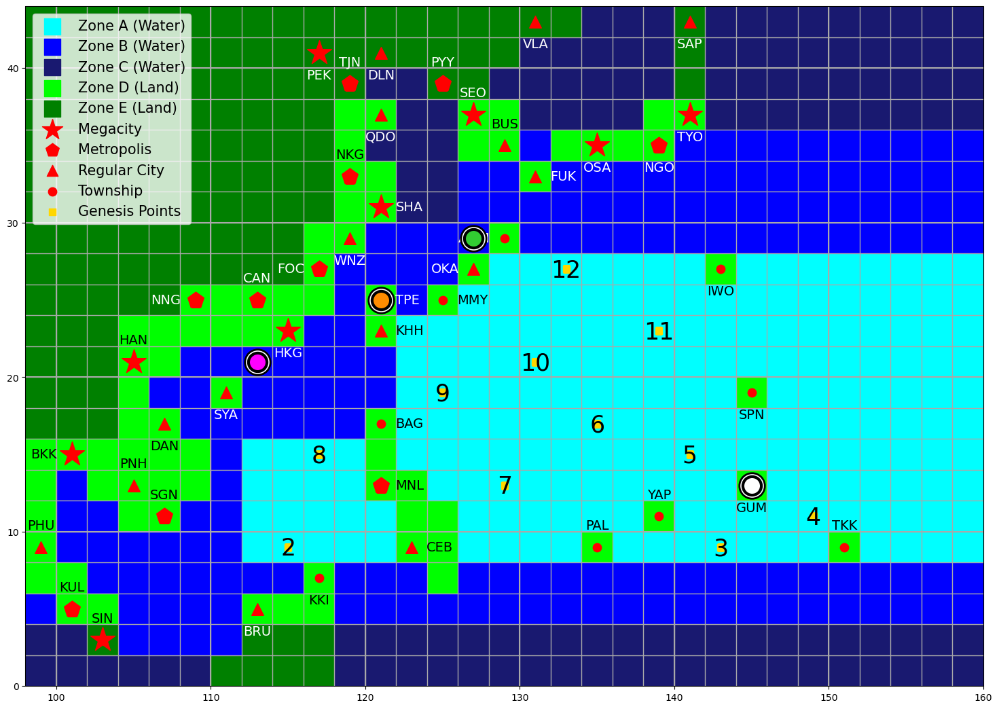

Jason has made landfall at GUM (Guam) and gains $100M!
Remaining budget of GUM (Guam): $0M

--- End of Jason's turn ---
Jason's current intensity: 120 knots.
Jason has gained 70 kJ. Current ACE: 220 kJ.
Jason's landfall costs: $200M.
The ocean has 290 kJ of energy remaining.
Jason has weakened to 115 knots.


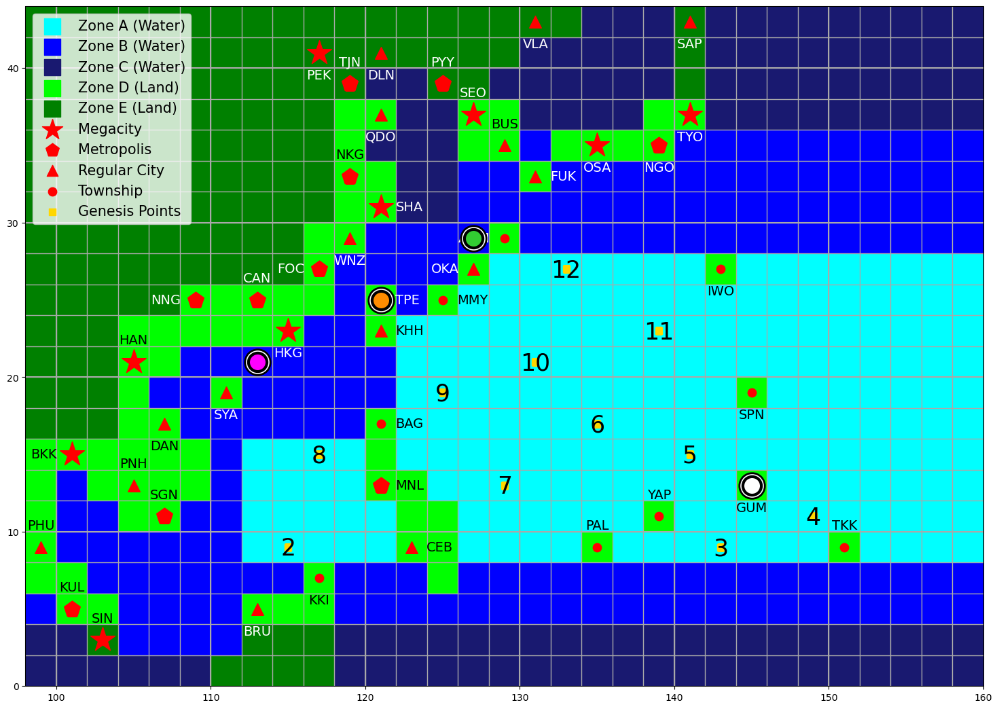

In [82]:
Run_Round(5, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 6: Demi's turn ---


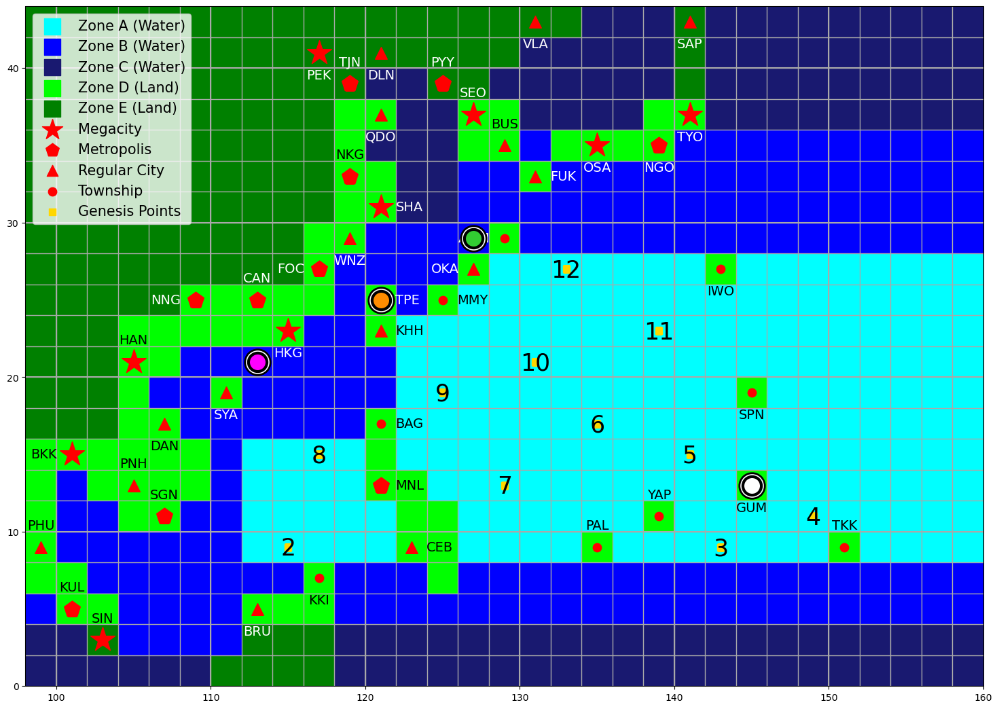

Intensity: 65 knots
ACE: 100 kJ
Landfall Costs: $780 M
Hand:
City Fortress
+5 W/m^2
+5 W/m^2

--- Round 6: Demi's draw phase ---
0: Movement Deck (39 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 0


Demi drew: S 1 from Movement Deck.

0: Movement Deck (38 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (21 cards left)


Choose a deck by index: 2


Demi drew: Cyclone Express from Action Deck.


--- Round 6: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: City Fortress
1: +5 W/m^2
2: +5 W/m^2
3: S 1
4: Cyclone Express (cannot play)


Choose a card by index to play:  0


Demi played: City Fortress



Select a city by inputting its three letter code: SHA


SHA is protected from being impacted by any opponent for the next 3 rounds.

--- Round 6: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: +5 W/m^2
1: +5 W/m^2
2: S 1
3: Cyclone Express (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  0


Demi played: +5 W/m^2

Demi remains at 65 knots.

--- Round 6: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: +5 W/m^2
1: S 1
2: Cyclone Express (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  1


Demi played: S 1



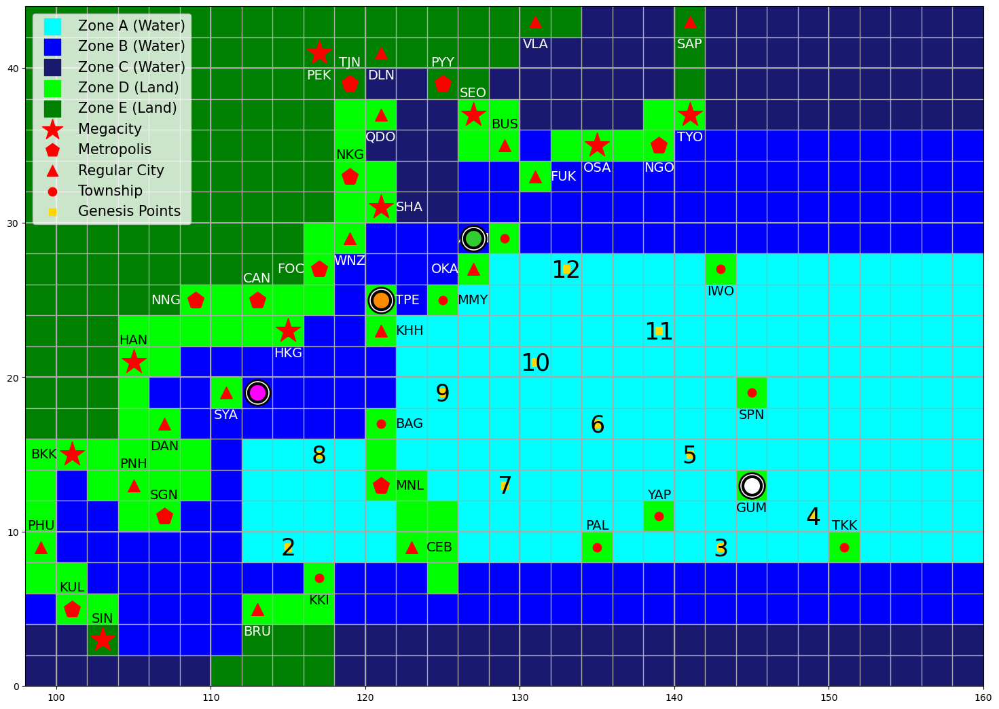


--- End of Demi's turn ---
Demi's current intensity: 65 knots.
Demi has gained 20 kJ. Current ACE: 120 kJ.
Demi's landfall costs: $780M.
The ocean has 270 kJ of energy remaining.


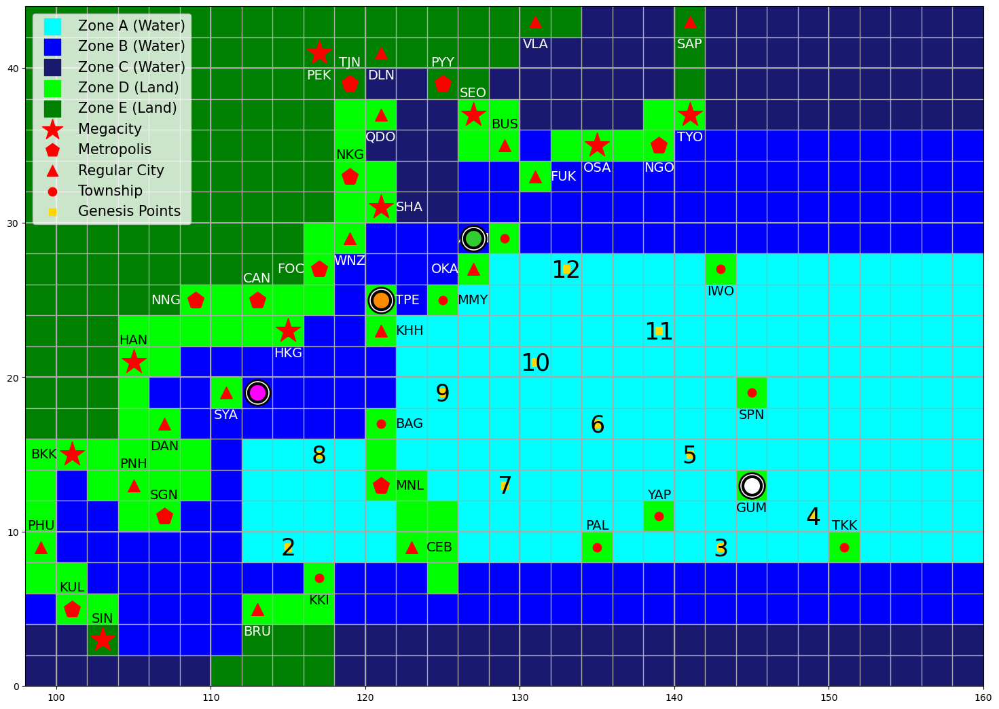

In [89]:
Run_Round(6, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 6: Kinen's turn ---


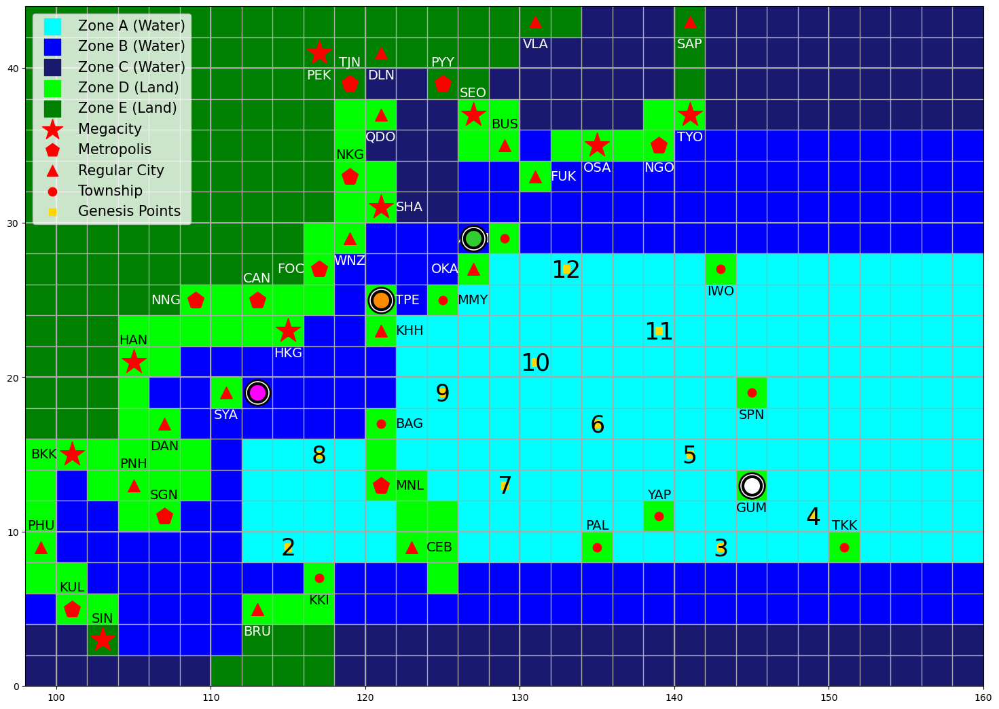

Intensity: 115 knots
ACE: 200 kJ
Landfall Costs: $965 M
Hand:
Factory Reset
E 2 S 1
S 1
S 3

--- Round 6: Kinen's draw phase ---
0: Movement Deck (38 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (20 cards left)


Choose a deck by index: 0


Kinen drew: W 2 N 1 from Movement Deck.

0: Movement Deck (37 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (20 cards left)


Choose a deck by index: 0


Kinen drew: W 1 from Movement Deck.


--- Round 6: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Factory Reset
1: E 2 S 1
2: S 1
3: S 3
4: W 2 N 1
5: W 1


Choose a card by index to play:  2


Kinen played: S 1



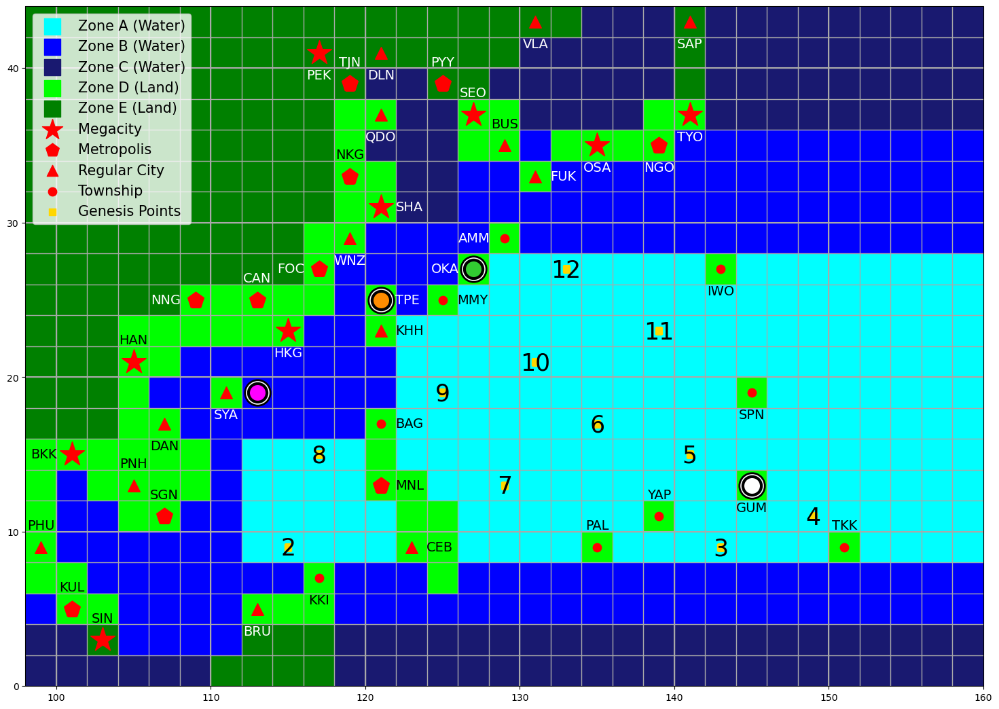

Kinen has made landfall at OKA (Okinawa) and gains $230M!
Remaining budget of OKA (Okinawa): $170M

--- Round 6: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: Factory Reset
1: E 2 S 1
2: S 3
3: W 2 N 1
4: W 1
Enter 'p' to pass.


Choose a card by index to play:  1


Kinen played: E 2 S 1



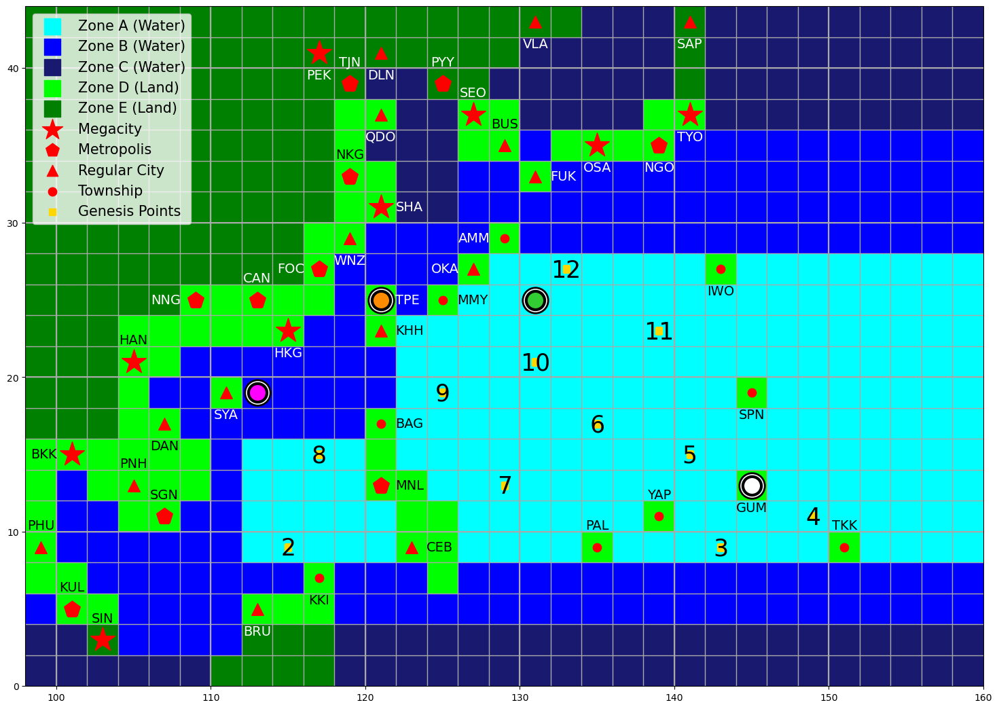


--- Round 6: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: Factory Reset
1: S 3
2: W 2 N 1
3: W 1
Enter 'p' to pass.


Choose a card by index to play:  3


Kinen played: W 1



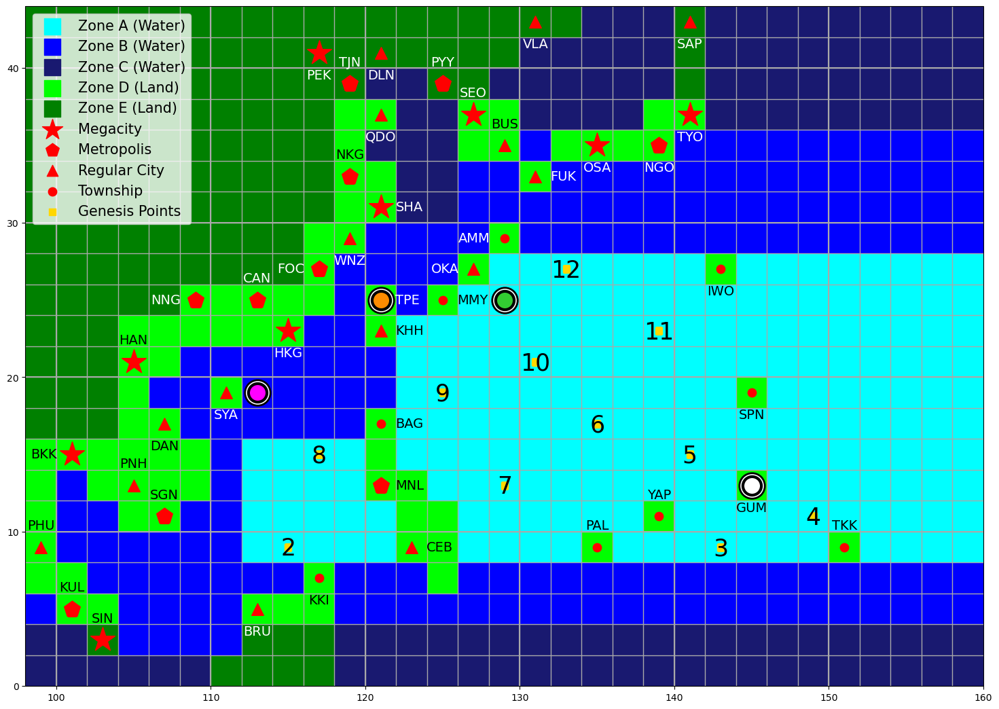


--- End of Kinen's turn ---
Kinen's current intensity: 115 knots.
Kinen has gained 50 kJ. Current ACE: 250 kJ.
Kinen's landfall costs: $1195M.
The ocean has 220 kJ of energy remaining.


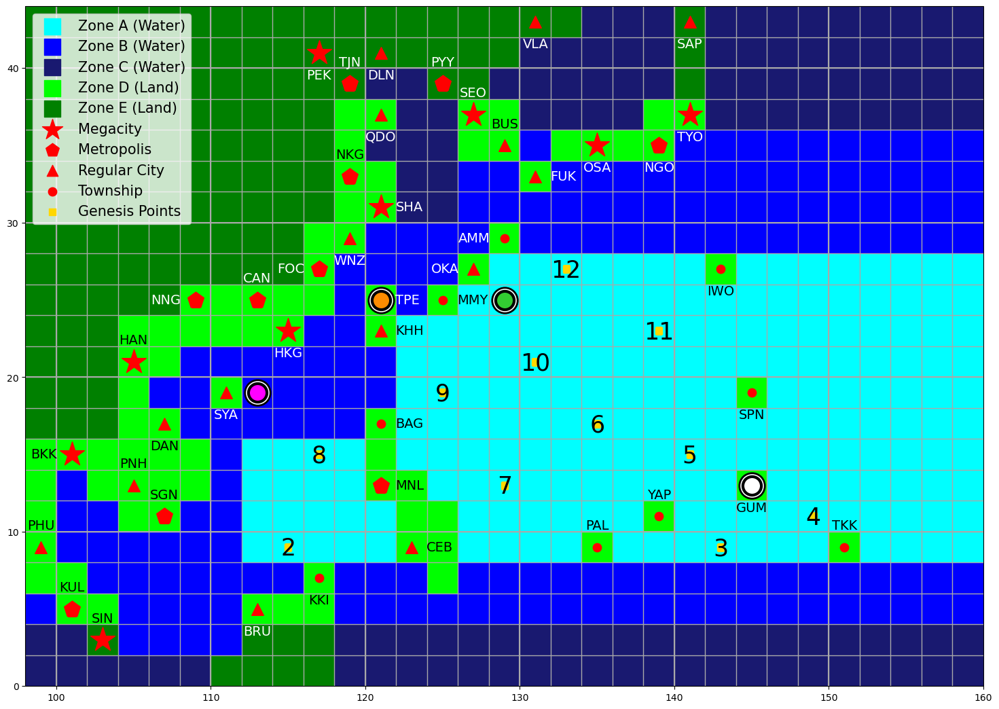

In [122]:
Run_Round(6, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 6: Jin's turn ---


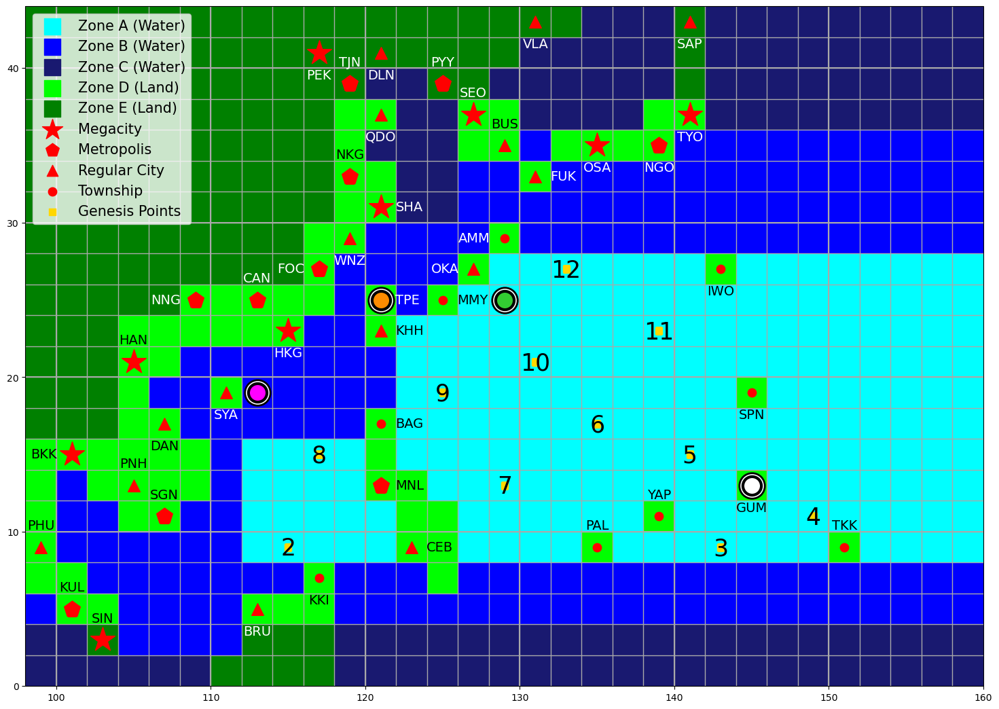

Intensity: 95 knots
ACE: 190 kJ
Landfall Costs: $500 M
Hand:
Random Teleportation
Extra Time
E 1 S 1
N 2

--- Round 6: Jin's draw phase ---
0: Movement Deck (36 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (20 cards left)


Choose a deck by index: 0


Jin drew: N/S 1 from Movement Deck.

0: Movement Deck (35 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (20 cards left)


Choose a deck by index: 2


Jin drew: Expand Circulation from Action Deck.


--- Round 6: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: N 2
4: N/S 1
5: Expand Circulation


Choose a card by index to play:  5


Jin played: Expand Circulation

Jin has made landfall at KHH (Kaohsiung) and gains $190M!
Remaining budget of KHH (Kaohsiung): $20M

--- Round 6: Jin's playing phase ---
Cards played this round: 1 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: N 2
4: N/S 1
Enter 'p' to pass.


Choose a card by index to play:  3


Jin played: N 2



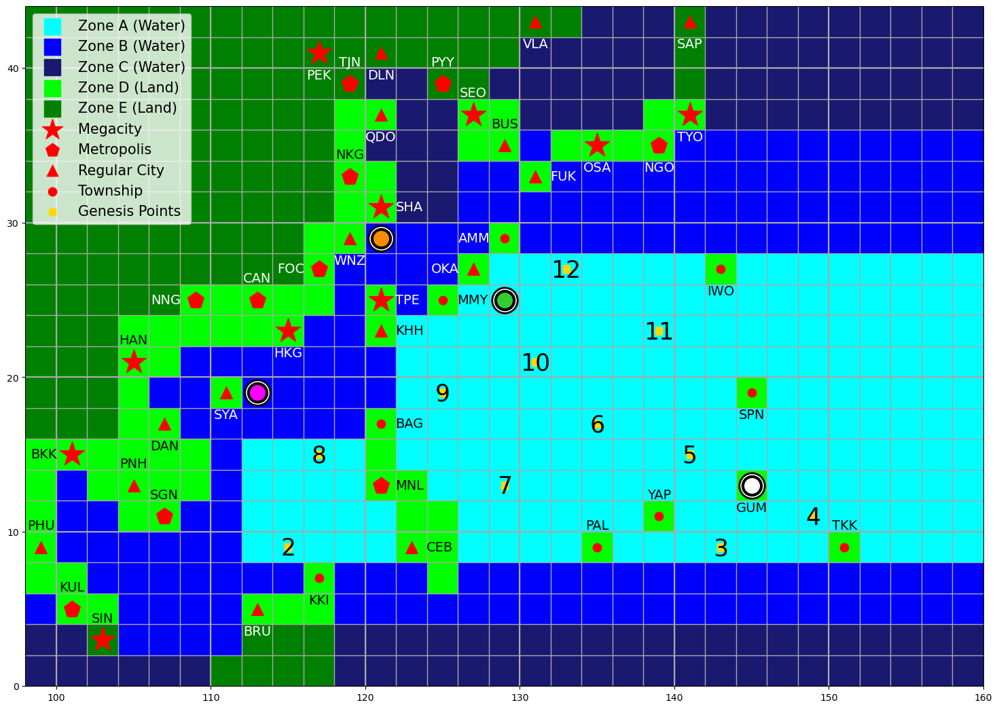


--- Round 6: Jin's playing phase ---
Cards played this round: 2 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: N/S 1
Enter 'p' to pass.


Choose a card by index to play:  p


Jin passes.

--- End of Jin's turn ---
Jin's current intensity: 95 knots.
Jin has gained 30 kJ. Current ACE: 220 kJ.
Jin's landfall costs: $690M.
The ocean has 190 kJ of energy remaining.


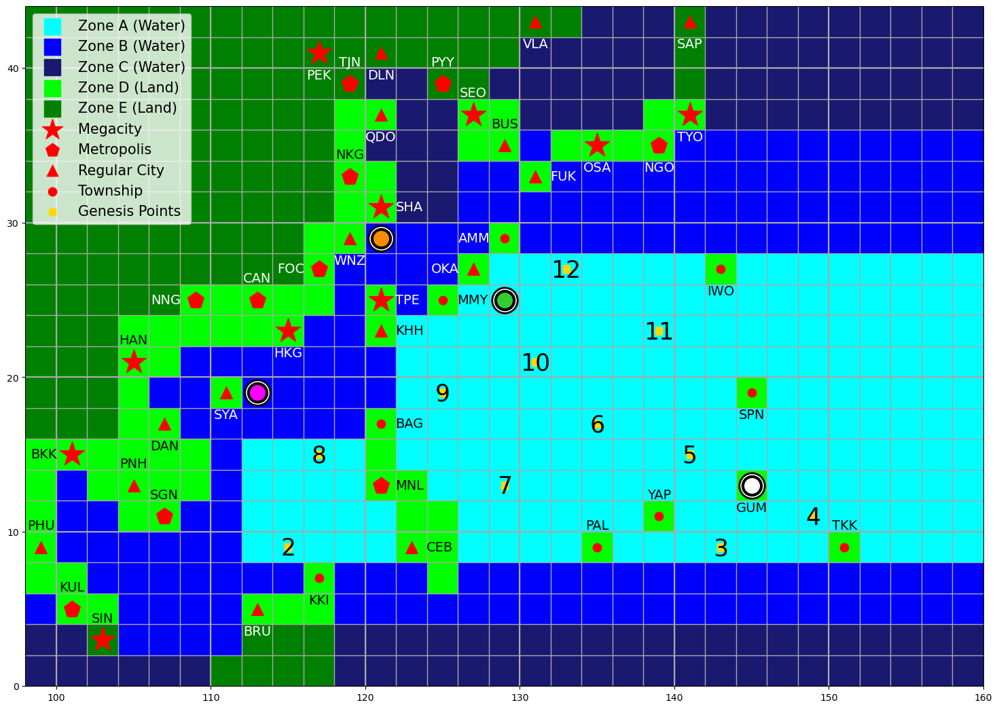

In [123]:
Run_Round(6, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 6: Jason's turn ---


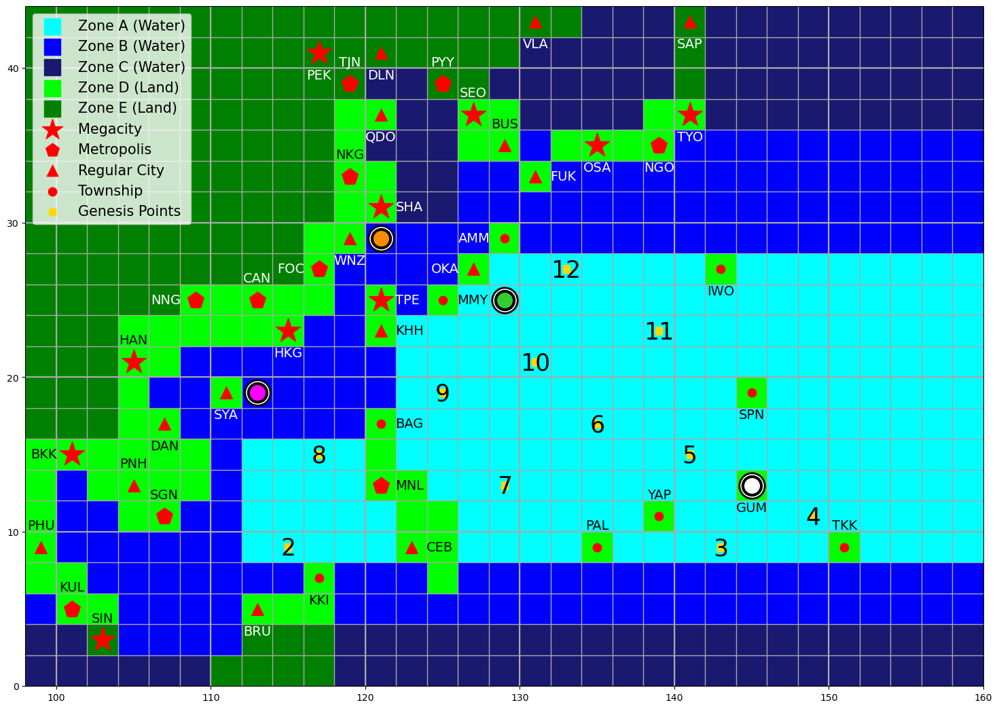

Intensity: 115 knots
ACE: 220 kJ
Landfall Costs: $200 M
Hand:
E 1
Cyclone Express
S 2

--- Round 6: Jason's draw phase ---
0: Movement Deck (35 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 0


Jason drew: E 3 from Movement Deck.

0: Movement Deck (34 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 0


Jason drew: N ? from Movement Deck.


--- Round 6: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: Cyclone Express (cannot play)
2: S 2
3: E 3
4: N ?


Choose a card by index to play:  4


Jason played: N ?

Jason rolled 1: N 1


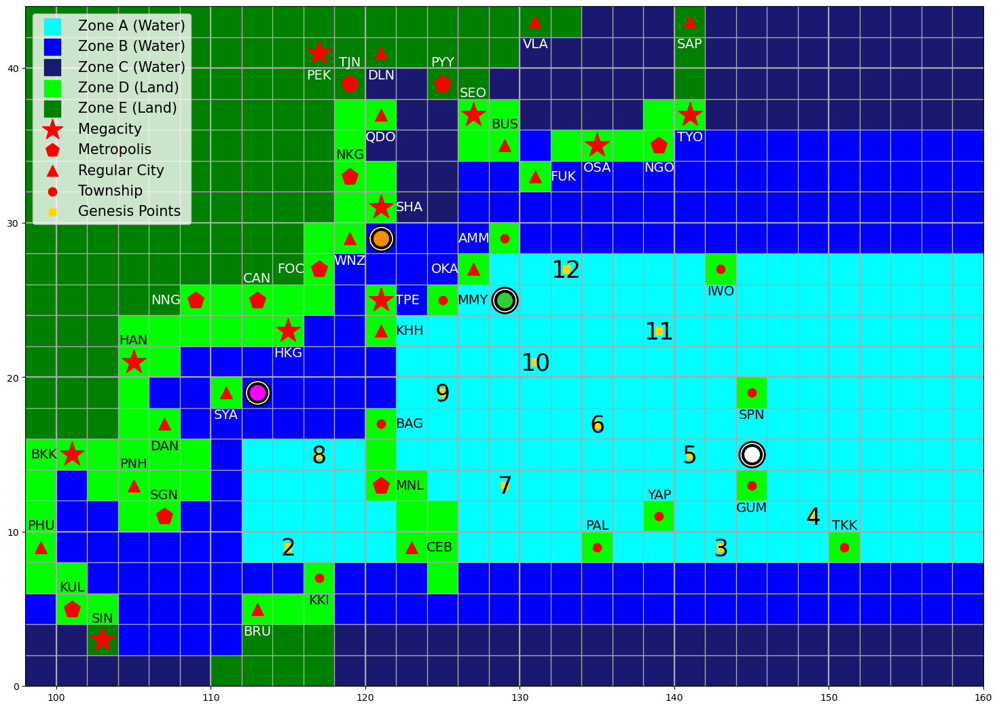


--- Round 6: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: Cyclone Express
2: S 2
3: E 3
Enter 'p' to pass.


Choose a card by index to play:  1


Jason played: Cyclone Express

Jason rolled 5: N 5


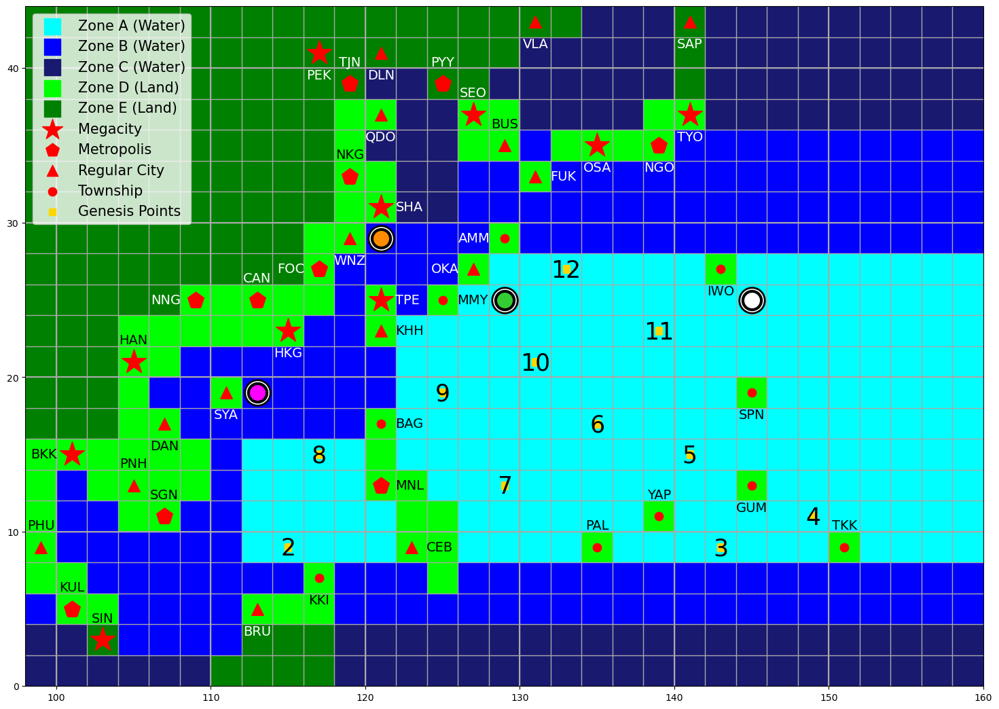


--- Round 6: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: S 2
2: E 3
Enter 'p' to pass.


Choose a card by index to play:  p


Jason passes.

--- End of Jason's turn ---
Jason's current intensity: 115 knots.
Jason has gained 50 kJ. Current ACE: 270 kJ.
Jason's landfall costs: $200M.
The ocean has 140 kJ of energy remaining.


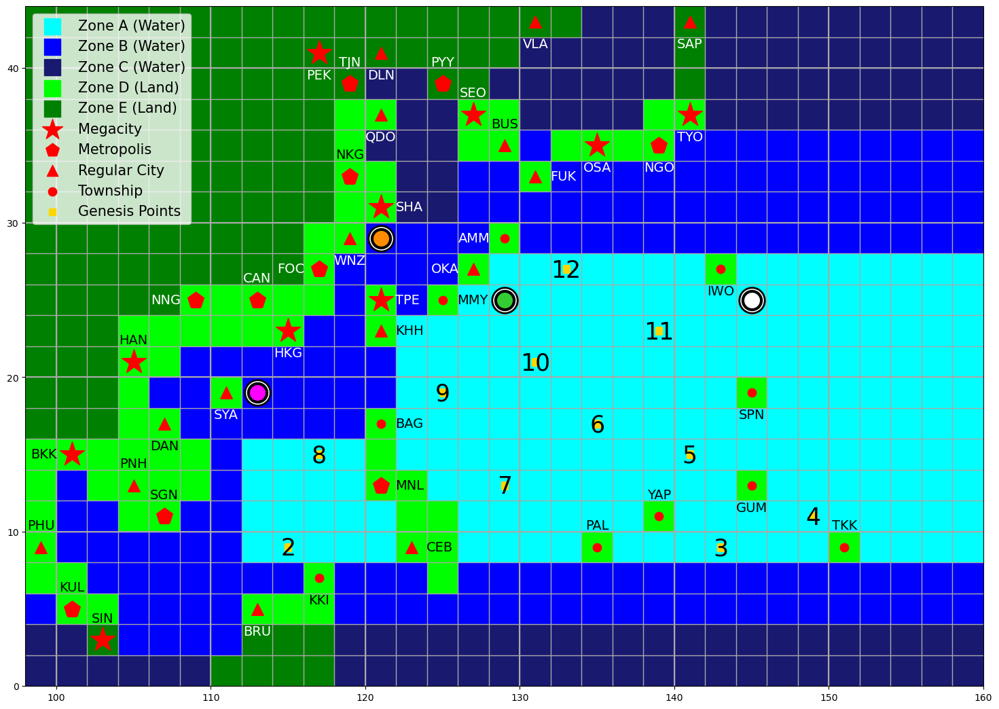

In [124]:
Run_Round(6, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 7: Demi's turn ---


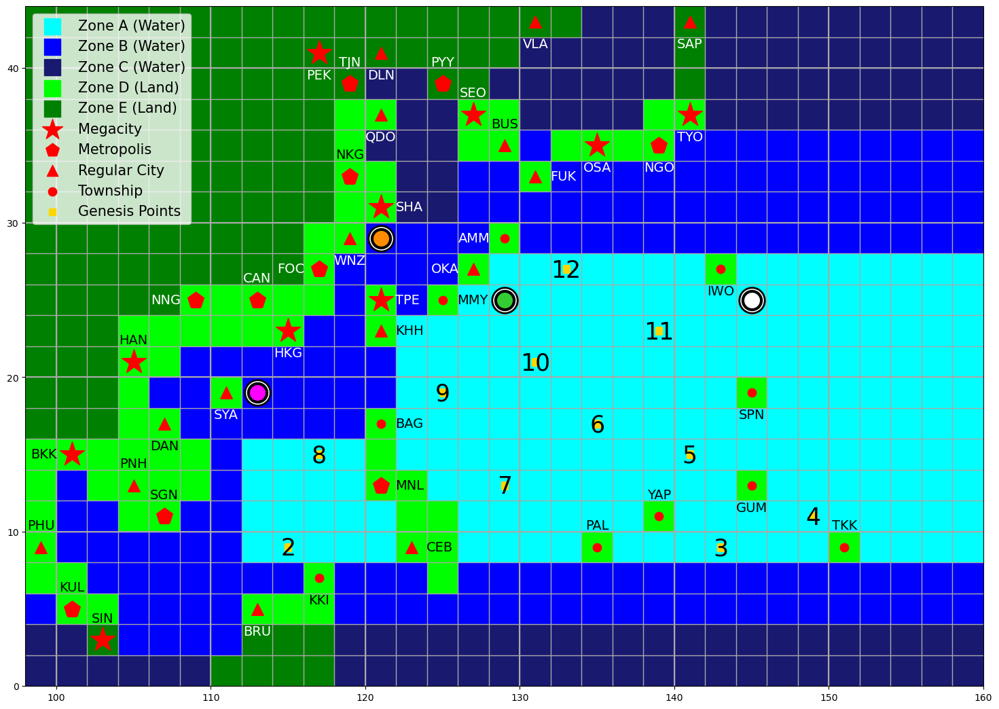

Intensity: 65 knots
ACE: 120 kJ
Landfall Costs: $780 M
Hand:
+5 W/m^2
Cyclone Express

--- Round 7: Demi's draw phase ---
0: Movement Deck (33 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 0


Demi drew: N 4 from Movement Deck.

0: Movement Deck (32 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 0


Demi drew: S 1 from Movement Deck.


--- Round 7: Demi's playing phase ---
Cards played this round: 0 / 3
Hand:
0: +5 W/m^2
1: Cyclone Express (cannot play)
2: N 4
3: S 1


Choose a card by index to play:  2


Demi played: N 4



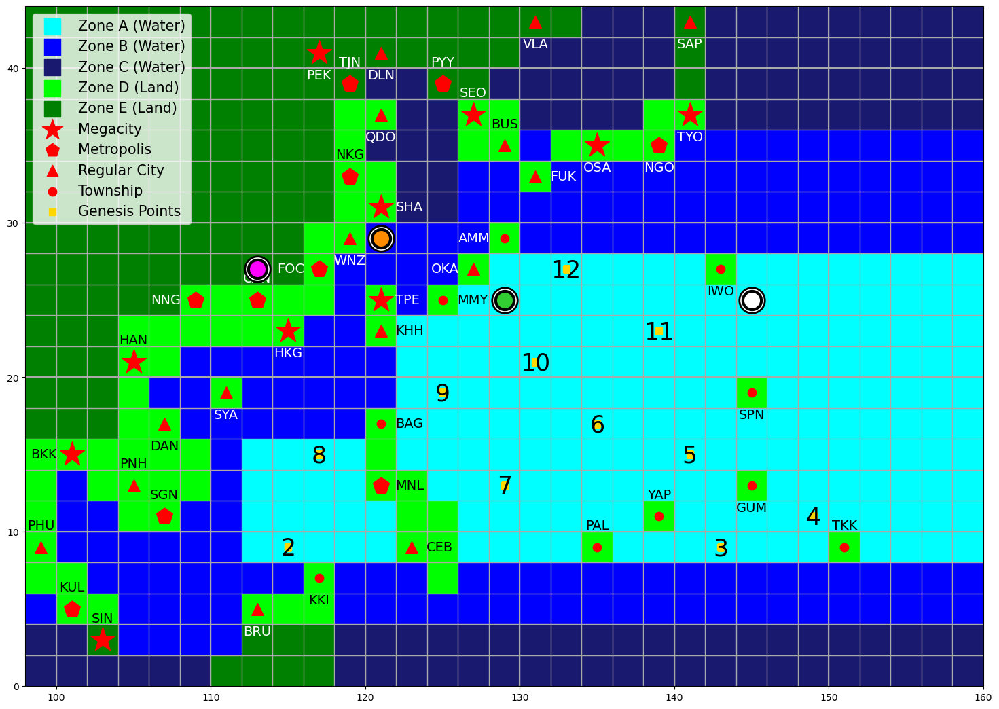


--- Round 7: Demi's playing phase ---
Cards played this round: 1 / 3
Hand:
0: +5 W/m^2 (cannot play)
1: Cyclone Express
2: S 1
Enter 'p' to pass.


Choose a card by index to play:  2


Demi played: S 1



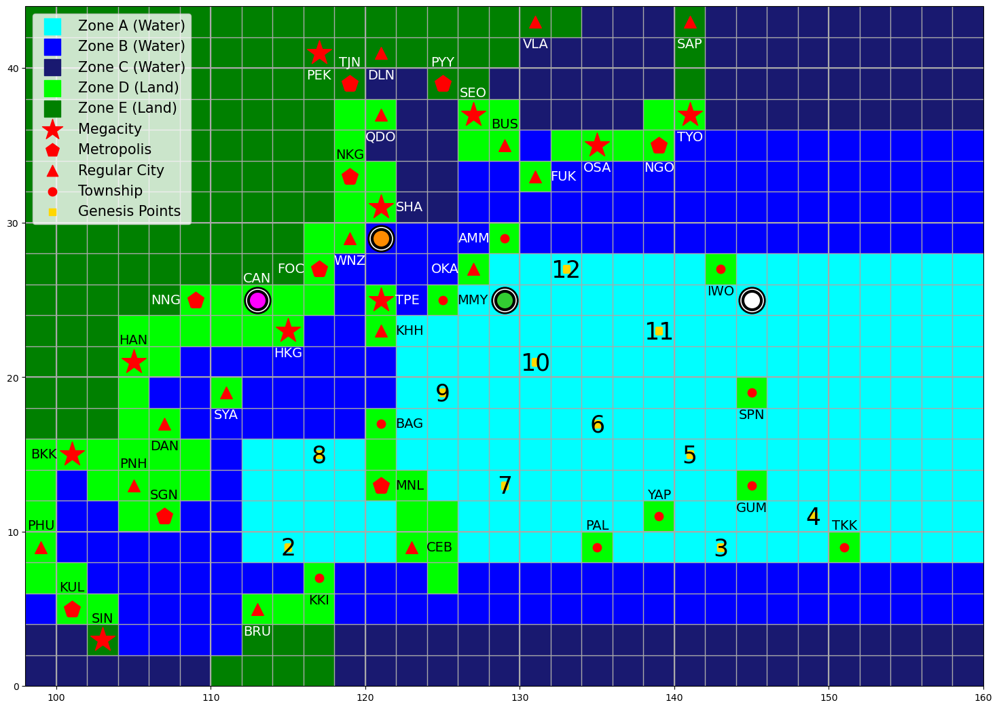

Demi has made landfall at CAN (Guangzhou) and gains $195M!
Remaining budget of CAN (Guangzhou): $555M

--- Round 7: Demi's playing phase ---
Cards played this round: 2 / 3
Hand:
0: +5 W/m^2 (cannot play)
1: Cyclone Express
Enter 'p' to pass.


Choose a card by index to play:  1


Demi played: Cyclone Express



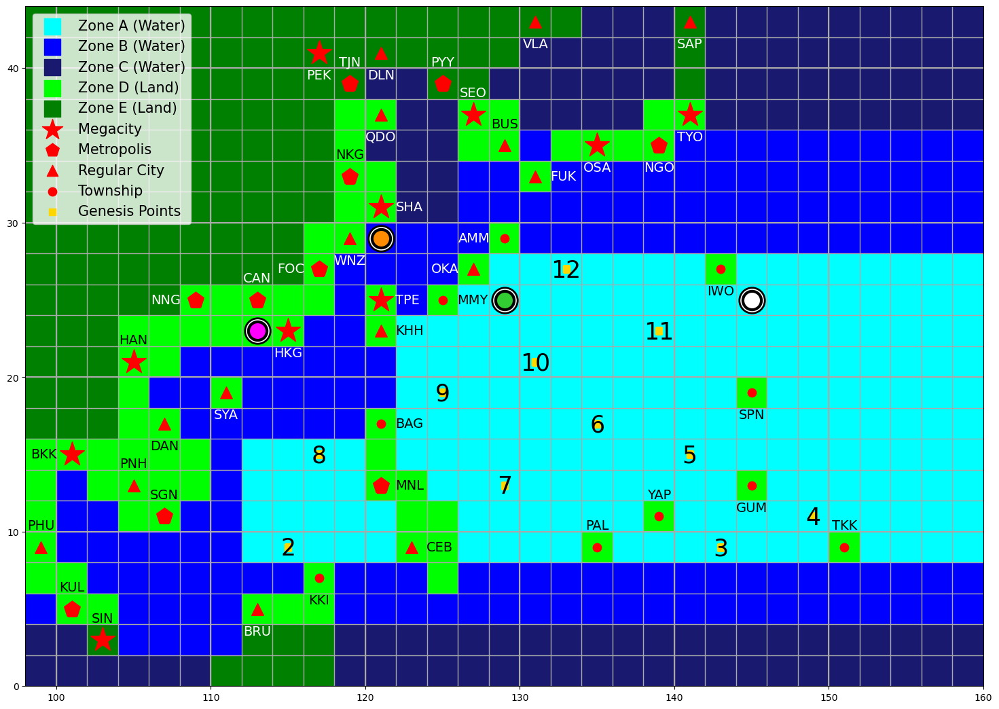


--- End of Demi's turn ---
Demi's current intensity: 65 knots. Demi has gained 20 kJ.
Demi's current ACE: 140 kJ.
Demi's total landfall costs: $975M.
The ocean has 120 kJ of energy remaining.
Demi has weakened to 60 knots.


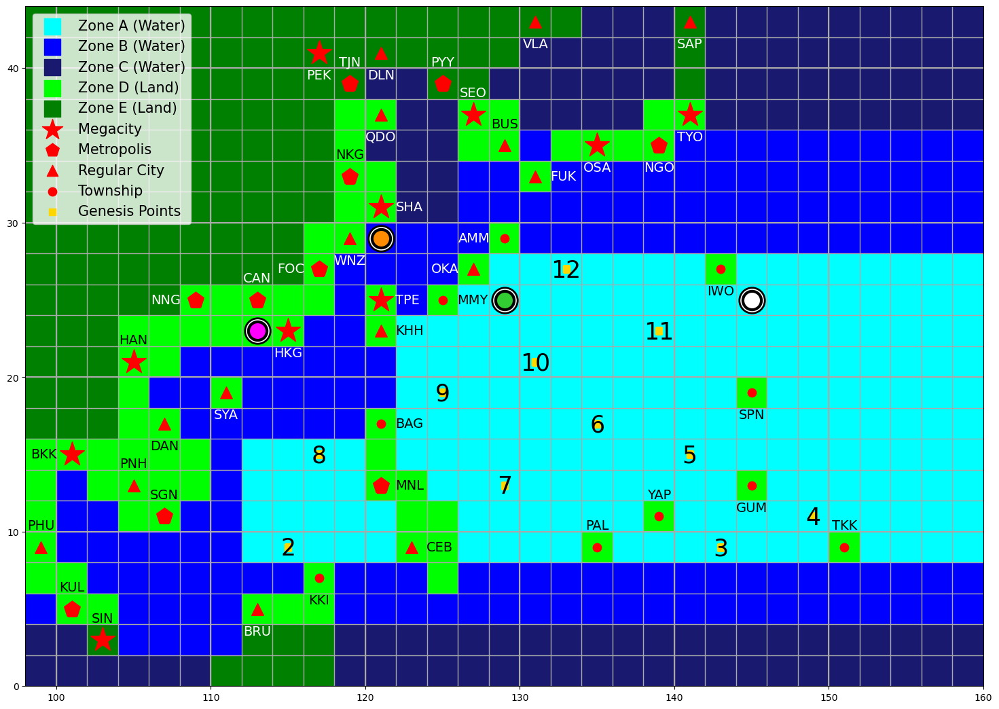

In [139]:
Run_Round(7, 1, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 7: Kinen's turn ---


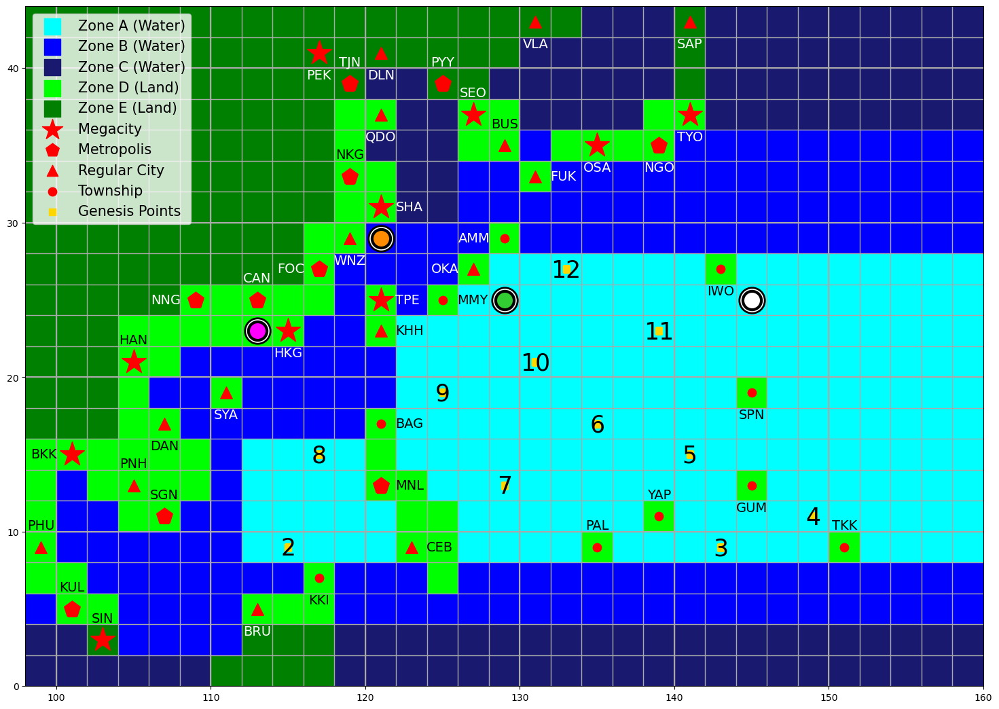

Intensity: 115 knots
ACE: 250 kJ
Landfall Costs: $1195 M
Hand:
Factory Reset
S 3
W 2 N 1

--- Round 7: Kinen's draw phase ---
0: Movement Deck (31 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 0


Kinen drew: N 2 from Movement Deck.

0: Movement Deck (30 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (19 cards left)


Choose a deck by index: 2


Kinen drew: Breaking Free from Action Deck.


--- Round 7: Kinen's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Factory Reset
1: S 3
2: W 2 N 1
3: N 2
4: Breaking Free (cannot play)


Choose a card by index to play:  3


Kinen played: N 2



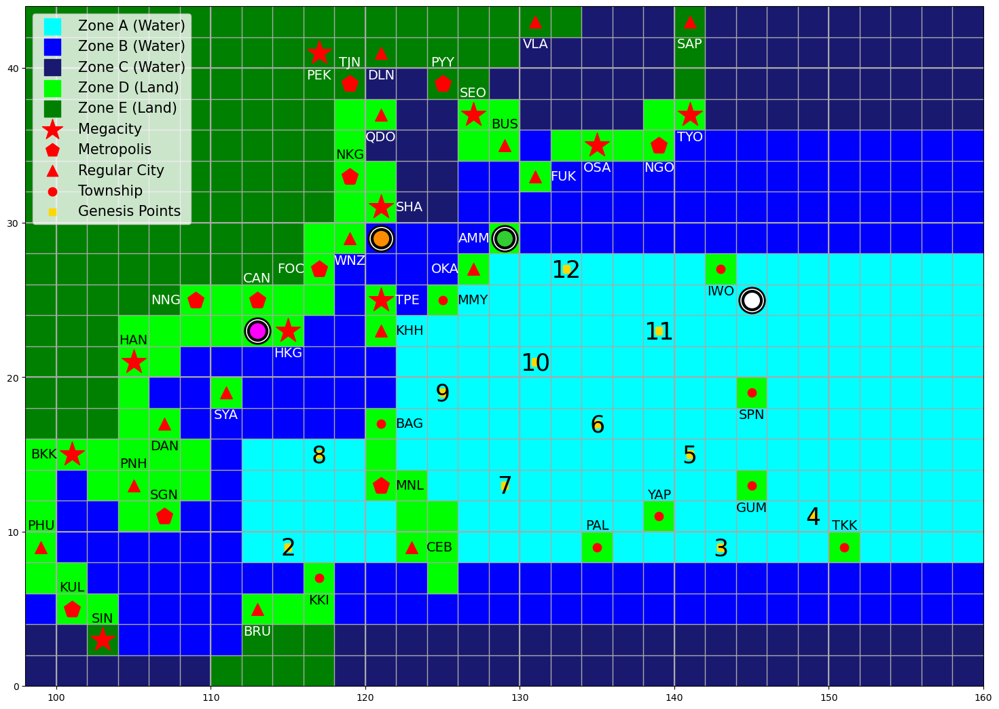

Kinen has made landfall at AMM (Amami) and gains $100M!
Remaining budget of AMM (Amami): $0M

--- Round 7: Kinen's playing phase ---
Cards played this round: 1 / 3
Hand:
0: Factory Reset
1: S 3
2: W 2 N 1
3: Breaking Free (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  1


Kinen played: S 3



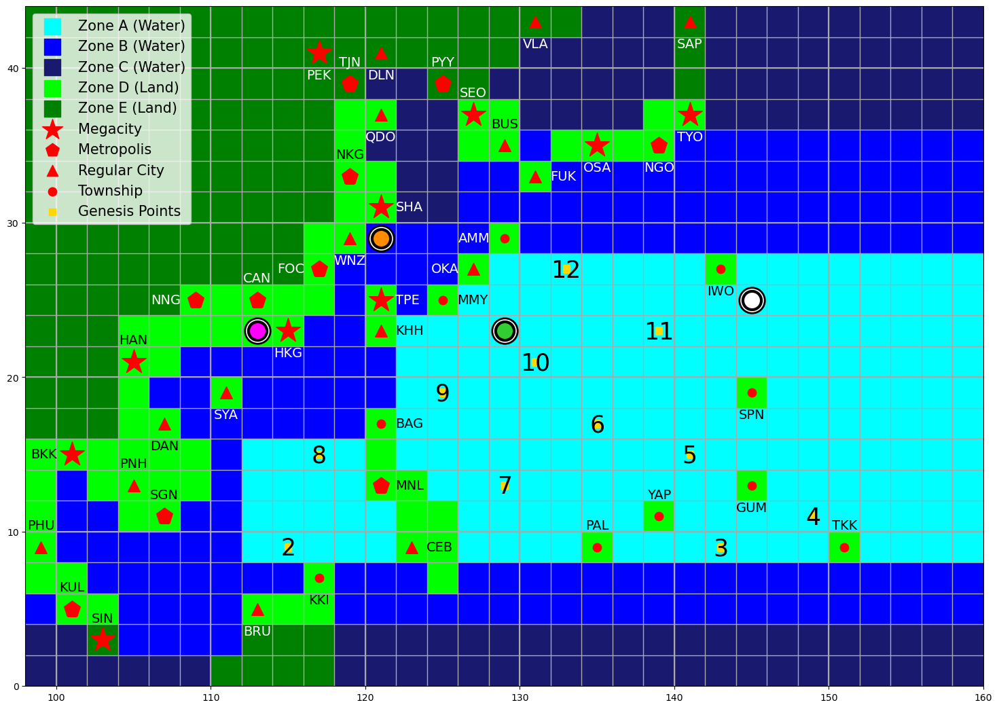


--- Round 7: Kinen's playing phase ---
Cards played this round: 2 / 3
Hand:
0: Factory Reset
1: W 2 N 1
2: Breaking Free (cannot play)
Enter 'p' to pass.


Choose a card by index to play:  1


Kinen played: W 2 N 1



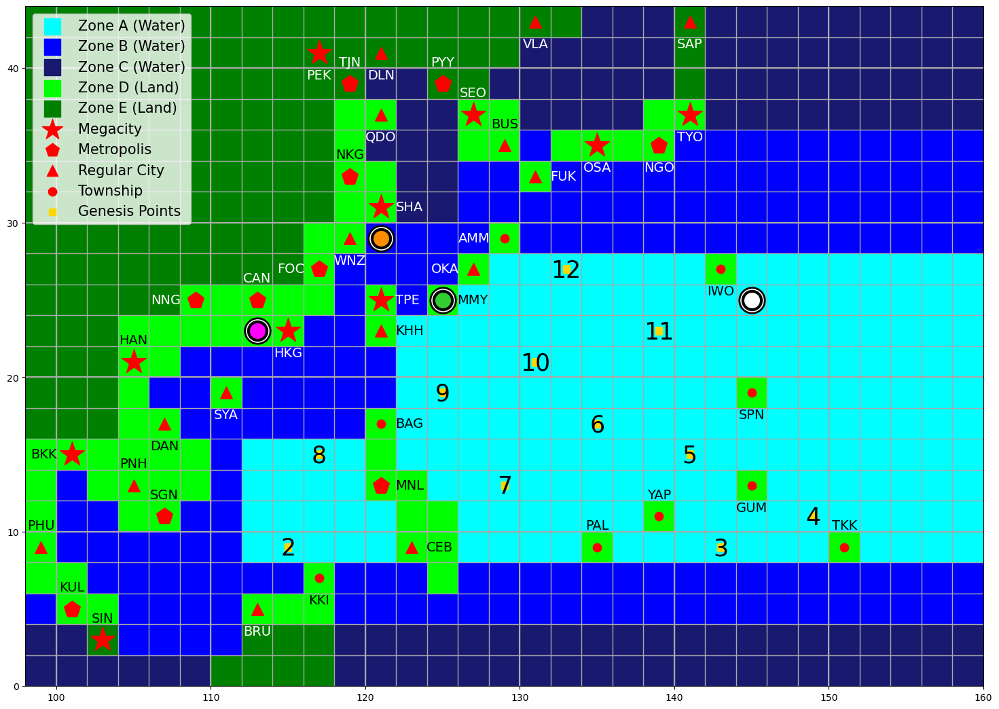

Kinen has made landfall at MMY (Miyakojima) and gains $100M!
Remaining budget of MMY (Miyakojima): $0M

--- End of Kinen's turn ---
Kinen's current intensity: 115 knots. Kinen has gained 50 kJ.
Kinen's current ACE: 300 kJ.
Kinen's total landfall costs: $1395M.
The ocean has 70 kJ of energy remaining.
Kinen has weakened to 110 knots.


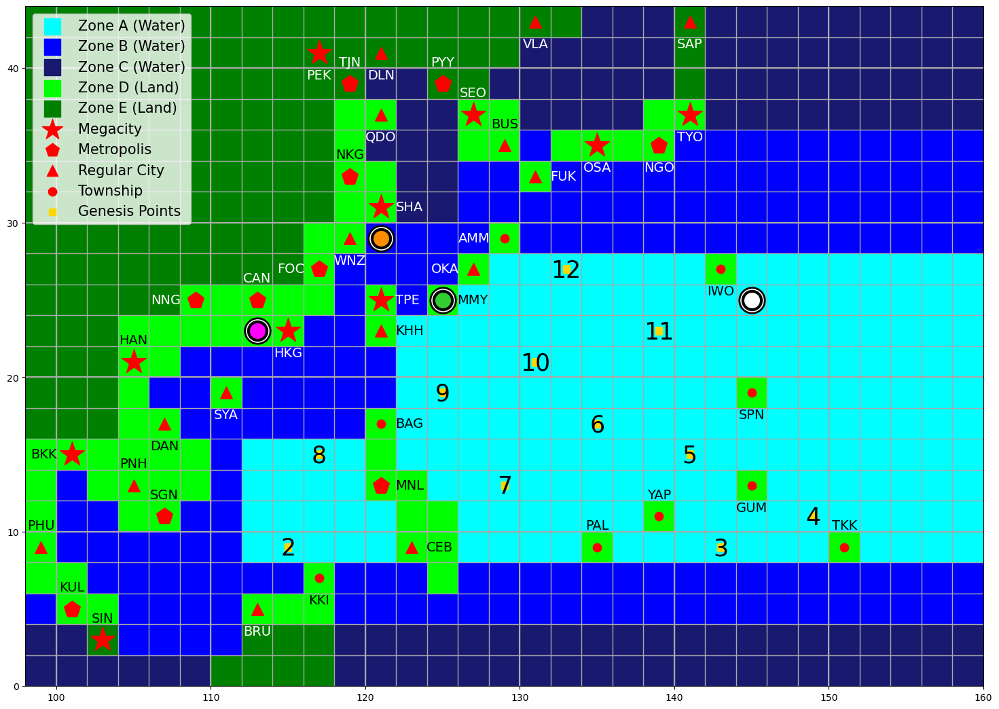

In [140]:
Run_Round(7, 2, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 7: Jin's turn ---


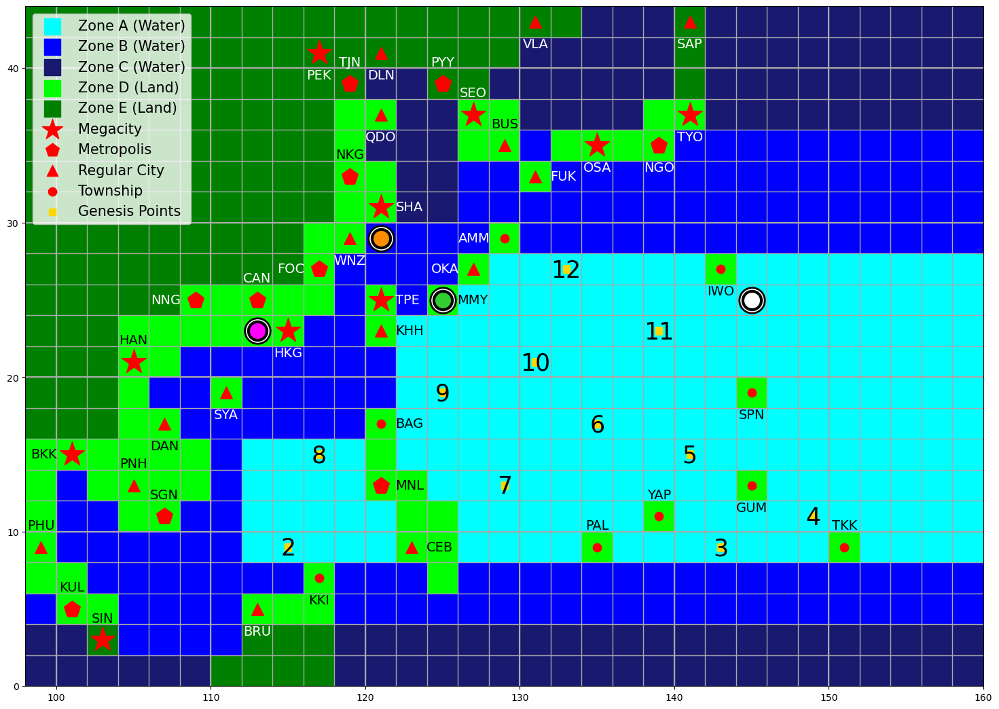

Intensity: 95 knots
ACE: 220 kJ
Landfall Costs: $690 M
Hand:
Random Teleportation
Extra Time
E 1 S 1
N/S 1

--- Round 7: Jin's draw phase ---
0: Movement Deck (30 cards left)
1: Intensity Deck (48 cards left)
2: Action Deck (18 cards left)


Choose a deck by index: 1


Jin drew: + ? W/m^2 from Intensity Deck.

0: Movement Deck (30 cards left)
1: Intensity Deck (47 cards left)
2: Action Deck (18 cards left)


Choose a deck by index: 1


Jin drew: +5 W/m^2 from Intensity Deck.


--- Round 7: Jin's playing phase ---
Cards played this round: 0 / 3
Hand:
0: Random Teleportation
1: Extra Time
2: E 1 S 1
3: N/S 1
4: + ? W/m^2
5: +5 W/m^2


Choose a card by index to play:  1


Jin played: Extra Time

Jin is able to use 6 cards within this round.

--- Round 7: Jin's playing phase ---
Cards played this round: 1 / 6
Hand:
0: Random Teleportation
1: E 1 S 1
2: N/S 1
3: + ? W/m^2
4: +5 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  3


Jin played: + ? W/m^2

Jin rolled 5: + 25 W/m^2
Jin has intensified to 105 knots!

--- Round 7: Jin's playing phase ---
Cards played this round: 2 / 6
Hand:
0: Random Teleportation
1: E 1 S 1
2: N/S 1
3: +5 W/m^2
Enter 'p' to pass.


Choose a card by index to play:  3


Jin played: +5 W/m^2

Jin remains at 105 knots.

--- Round 7: Jin's playing phase ---
Cards played this round: 3 / 6
Hand:
0: Random Teleportation
1: E 1 S 1
2: N/S 1
Enter 'p' to pass.


Choose a card by index to play:  2


Jin played: N/S 1



Choose N or S:  N


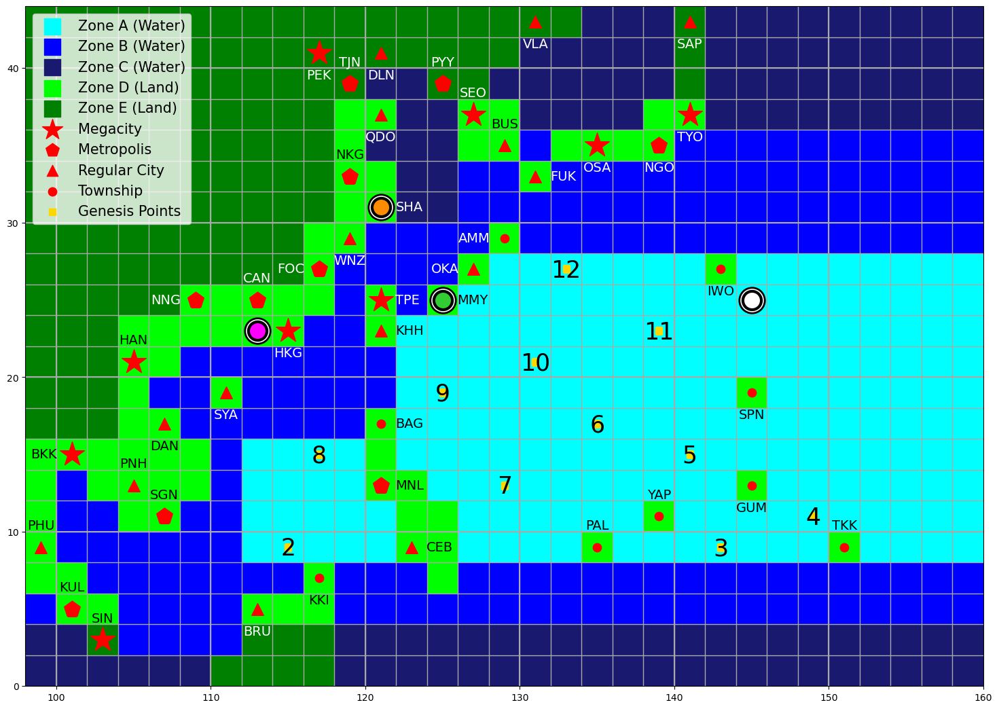

Jin has made landfall at SHA (Shanghai) and gains $525M!
Remaining budget of SHA (Shanghai): $975M

--- Round 7: Jin's playing phase ---
Cards played this round: 4 / 6
Hand:
0: Random Teleportation
1: E 1 S 1
Enter 'p' to pass.


Choose a card by index to play:  1


Jin played: E 1 S 1



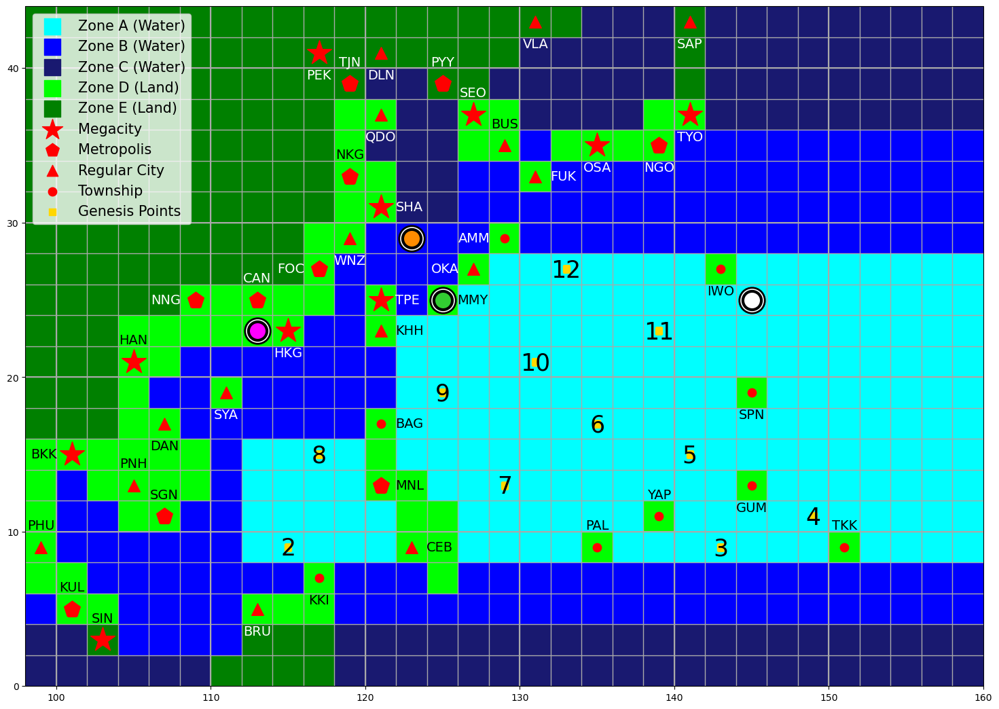


--- Round 7: Jin's playing phase ---
Cards played this round: 5 / 6
Hand:
0: Random Teleportation
Enter 'p' to pass.


Choose a card by index to play:  0


Jin played: Random Teleportation

Jin rolled 10 and is teleported to genesis point 10.


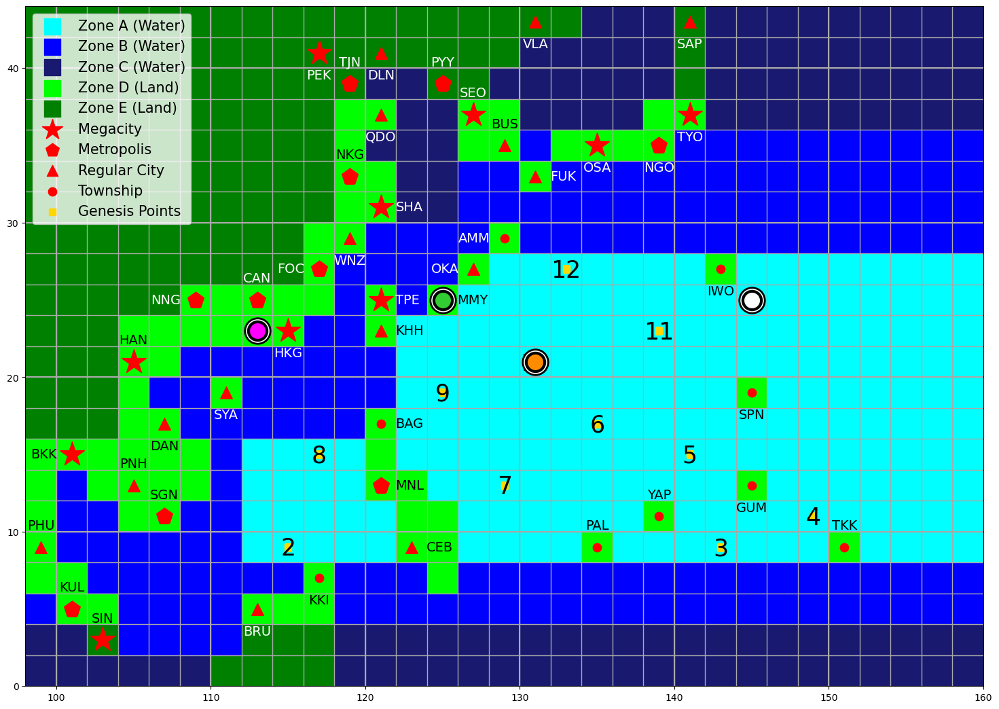


--- End of Jin's turn ---
Jin's current intensity: 105 knots. Jin has gained 50 kJ.
Jin's current ACE: 270 kJ.
Jin's total landfall costs: $1215M.
The ocean has 20 kJ of energy remaining.


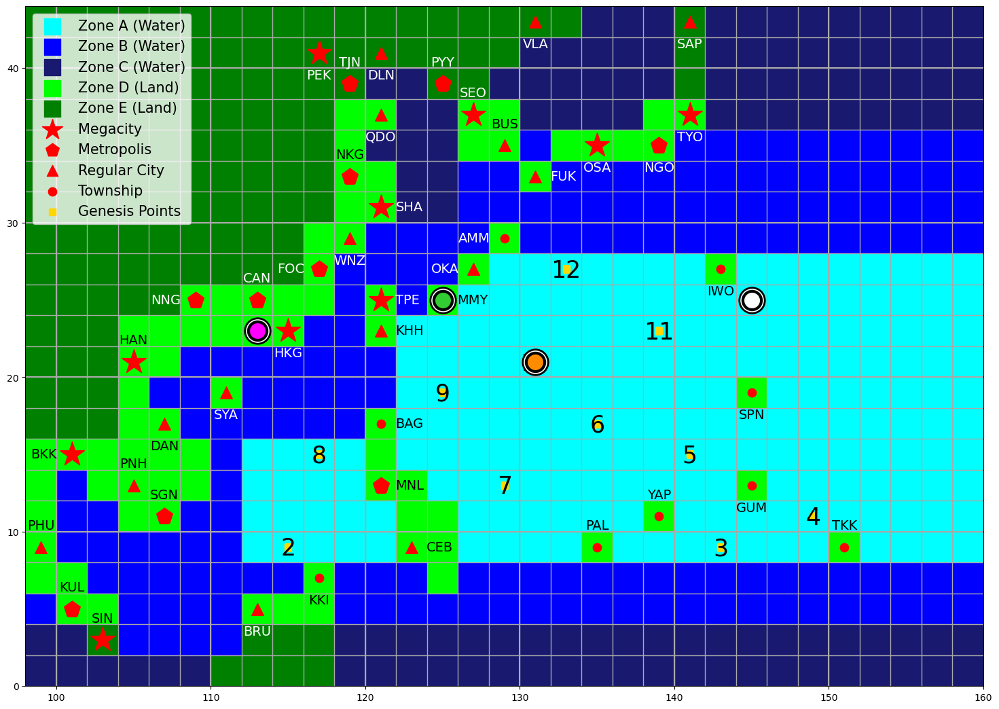

In [148]:
Run_Round(7, 3, Player_Data, Game_State, Player_Data_History, Game_State_History)


--- Round 7: Jason's turn ---


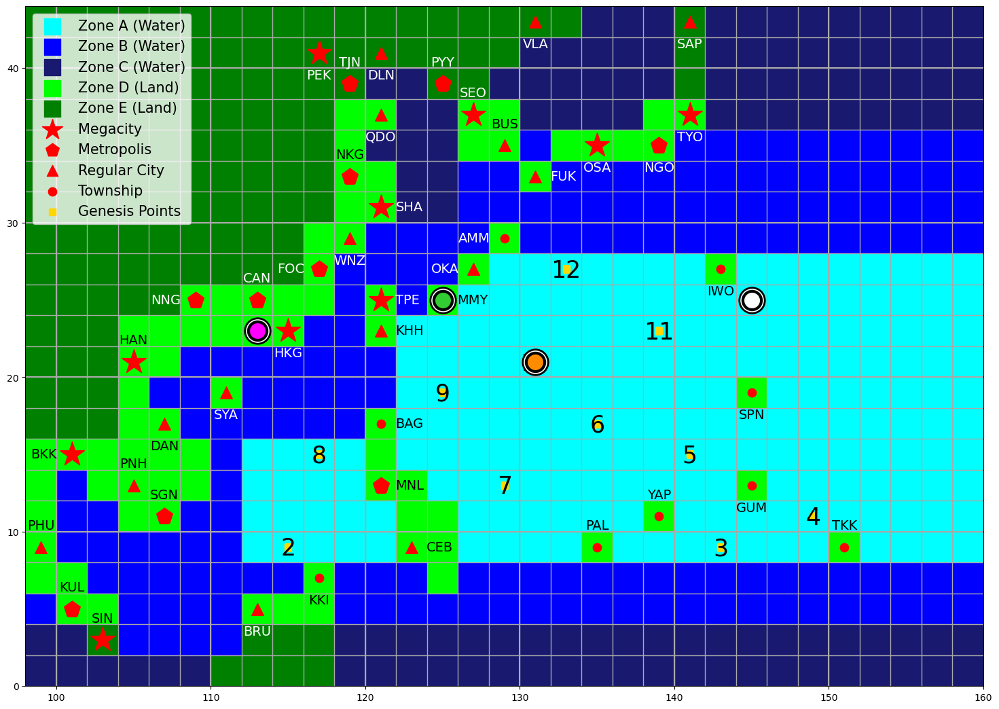

Intensity: 115 knots
ACE: 270 kJ
Landfall Costs: $200 M
Hand:
E 1
S 2
E 3

--- Round 7: Jason's draw phase ---
0: Movement Deck (30 cards left)
1: Intensity Deck (46 cards left)
2: Action Deck (18 cards left)


Choose a deck by index: 2


Jason drew: Expand Circulation from Action Deck.

0: Movement Deck (30 cards left)
1: Intensity Deck (46 cards left)


Choose a deck by index: 0


Jason drew: E 1 N 2 from Movement Deck.


--- Round 7: Jason's playing phase ---
Cards played this round: 0 / 3
Hand:
0: E 1
1: S 2
2: E 3
3: Expand Circulation (cannot play)
4: E 1 N 2


Choose a card by index to play:  1


Jason played: S 2



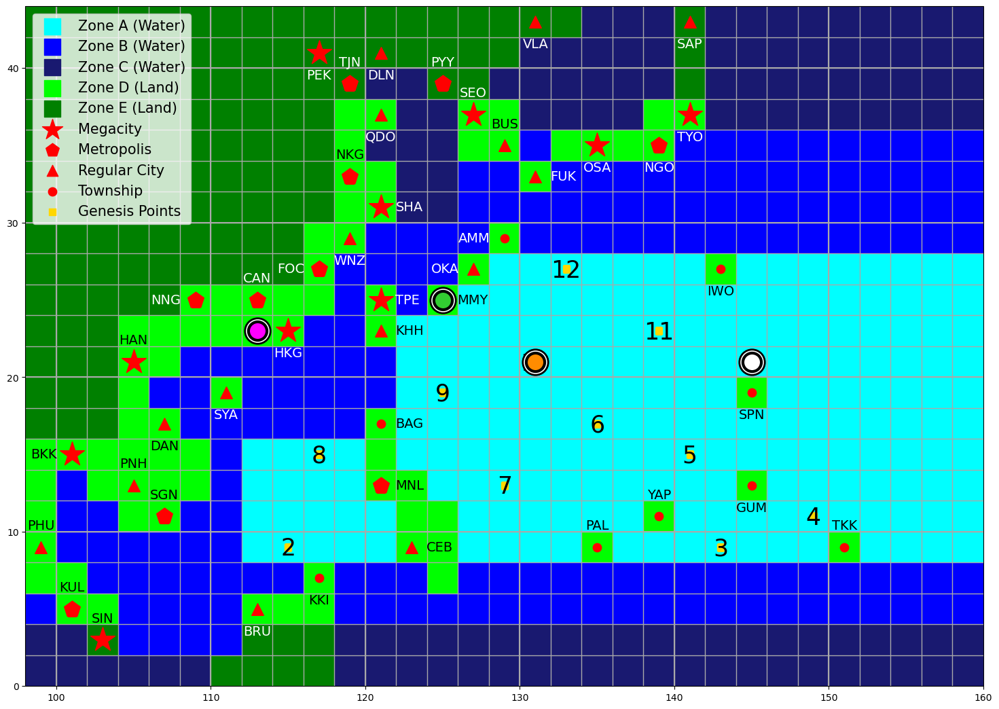


--- Round 7: Jason's playing phase ---
Cards played this round: 1 / 3
Hand:
0: E 1
1: E 3
2: Expand Circulation
3: E 1 N 2
Enter 'p' to pass.


Choose a card by index to play:  2


Jason played: Expand Circulation

Jason has made landfall at SPN (Saipan) and gains $100M!
Remaining budget of SPN (Saipan): $0M

--- Round 7: Jason's playing phase ---
Cards played this round: 2 / 3
Hand:
0: E 1
1: E 3
2: E 1 N 2
Enter 'p' to pass.


Choose a card by index to play:  2


Jason played: E 1 N 2



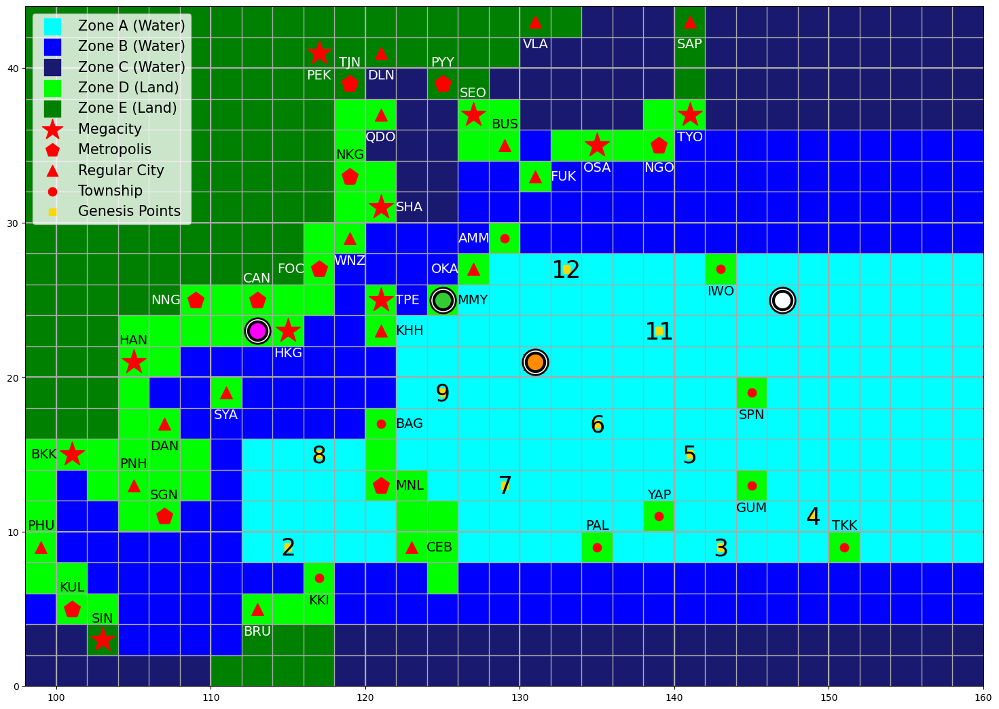


--- End of Jason's turn ---
Jason's current intensity: 115 knots. Jason has gained 50 kJ.
Jason's current ACE: 320 kJ.
Jason's total landfall costs: $300M.
The ocean has 0 kJ of energy remaining.

Ocean ACE has been depleted!
All remaining players will complete their turns this round.


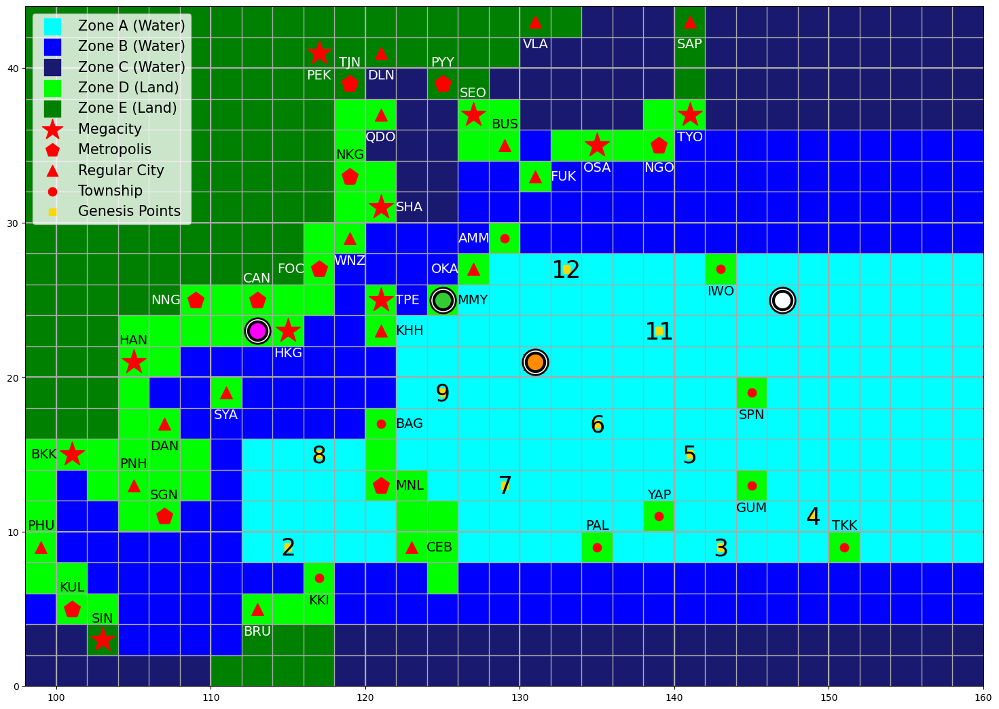

In [149]:
Run_Round(7, 4, Player_Data, Game_State, Player_Data_History, Game_State_History)

## Final Results

In [158]:
Final_Results = Points_Tally(Player_Data, Game_State)
Print_Points_Tally(Final_Results)


========== FINAL RESULTS ==========

1. Kinen
ACE: 300
Landfall Costs: 1395
Peak Intensity: 115 kt (Rank 2, + 100 points)
Landfall Cities Count: 6 (Rank 1, +200 points)
Final Score: 1995

2. Jin
ACE: 270
Landfall Costs: 1215
Peak Intensity: 105 kt (Rank 3, + 50 points)
Landfall Cities Count: 3 (Rank 3, +50 points)
Final Score: 1585

3. Demi
ACE: 140
Landfall Costs: 975
Peak Intensity: 65 kt (Rank 4, + 0 points)
Landfall Cities Count: 5 (Rank 2, +100 points)
Final Score: 1215

4. Jason
ACE: 320
Landfall Costs: 300
Peak Intensity: 120 kt (Rank 1, + 200 points)
Landfall Cities Count: 3 (Rank 4, +0 points)
Final Score: 820
